In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
from invisible_cities.database import load_db
sipm_info = load_db.DataSiPM('new', -6400)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
r_cut_mm = 100 # 10 cm radius cut

def sipm_center_cut(pmaps_list, radius):

    bad_keys = []

    for k in pmaps_list.keys():
        i = -1
        for j in range(len(pmaps_list[k].s2s[0].sipms.sum_over_times)):
            if i == -1:
                i = j
            elif pmaps_list[k].s2s[0].sipms.sum_over_times[j] > pmaps_list[k].s2s[0].sipms.sum_over_times[i]:
                i = j
        max_id = pmaps_list[k].s2s[0].sipms.ids[i]
        max_loc = sipm_info.iloc[max_id][['X', 'Y']]
        max_r = (max_loc['X']**2 + max_loc['Y']**2)**0.5

        if max_r > r_cut_mm:
            bad_keys.append(k)

    for k in bad_keys:
        del pmaps_list[k]

    print('Num events after position selection =', len(pmaps_list))

In [4]:
# Select for 1 S1 and 1 S2
def s1s2selection(pmaps_list):
    print('Num events before selection =', len(pmaps_list))
    bad_keys = []

    for k in pmaps_list.keys():
        if not len(pmaps_list[k].s1s) == 1:
            bad_keys.append(k)
        elif not len(pmaps_list[k].s2s) == 1:
            bad_keys.append(k)
        elif len(pmaps_list[k].s2s[0].sipms.ids) == 0:
            bad_keys.append(k)
            print(k, 'HAS NO SIPM RESPONSE')
        
    for k in bad_keys:
        del pmaps_list[k]

    print('Num events after selection =', len(pmaps_list))

In [5]:
# Re index events properly
def reindex(pmaps_list):    
    event_total = 0
    reindexed_pmaps = {}
    for i in range(len(pmaps_list)):
        keys = list(pmaps_list[i].keys())
        for k in keys:
            reindexed_pmaps[event_total] = pmaps_list[i][k]
            event_total += 1
    return reindexed_pmaps.copy()

In [6]:
import time
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = 10, 8
plt.rcParams["font.size"     ] = 14
from invisible_cities.io.pmaps_io import load_pmaps

In [7]:
def four_digit(i):
    j = str(i)
    while len(j) < 4:
        j = '0'+j
    return j

In [8]:
def read_in_cut_pmaps(myallpmaps, r_cut_mm):
    t0 = time.time()
    print('Loading', myallpmaps[0], 'to', myallpmaps[-1])
    my_pmaps = [load_pmaps(pmap_file) for pmap_file in myallpmaps]
    print('Time to load', len(my_pmaps), 'pmaps =', time.time() - t0)
    my_pmaps = reindex(my_pmaps)
    s1s2selection(my_pmaps)
    sipm_center_cut(my_pmaps, r_cut_mm)
    return my_pmaps

In [9]:
r_cut_mm = 100 # 10 cm radius cut

# The normal MC location should be from now on '/Volumes/NEXT_data/IC_Data/simulation'. Remember
# when moving over data to look at irene outputs, even if you have to go up a few directories
# to find it.

# all_pmaps = ['/Volumes/NEXT_data/IC_Data/kdst/nexus_newKr_pmaps_NEW/new.kr83m.pmaps.'+str(i)+'.h5' for i in range(1, 501)]

# Run, offset, num_files
run_number = 7851
offset = 20
num_files = 20
data_pmaps_files = ['/Volumes/NEXT_data/IC_Data/pmaps/'+str(run_number)+'/pmaps_'+four_digit(i)+'_'+str(run_number)+'_trigger1_v1.2.0_20191122_krbg1600.h5' for i in range(offset, offset + num_files)] # 20 is chosen because using all would take hours to read in

# 20200427. Flat 50% reflectance. No PEDOT
# mc_date = '20200427'
# mc_pmaps_files = ['/Volumes/NEXT_data/IC_Data/simulation/20200427/new.kr83m.pmaps.'+str(i)+'.h5' for i in range(1, 501)]

# 20200430. 10% blue light, 0% VUV
mc_date = '20200430'
mc_pmaps_files = ['/Volumes/NEXT_data/IC_Data/pmaps/mc20200430/new.kr83m.hypathia.'+str(i)+'.h5' for i in range(1, 501)]

# 20200429
# mc_date = '20200429'
# mc_pmaps_files = ['/Volumes/NEXT_data/IC_Data/pmaps/mc'+mc_date+'/new.kr83m.hypathia.'+str(i)+'.h5' for i in range(1, 501)]

In [10]:
# 8 minutes to load any recent (500 file) MC
# 2 minutes to load old MC
# 1 minute to load 20 files of data
data_pmaps = read_in_cut_pmaps(data_pmaps_files, r_cut_mm)

Loading /Volumes/NEXT_data/IC_Data/pmaps/7851/pmaps_0020_7851_trigger1_v1.2.0_20191122_krbg1600.h5 to /Volumes/NEXT_data/IC_Data/pmaps/7851/pmaps_0039_7851_trigger1_v1.2.0_20191122_krbg1600.h5
Time to load 20 pmaps = 71.68521690368652
Num events before selection = 6215
Num events after selection = 4732
Num events after position selection = 1140


In [11]:
mc_pmaps = read_in_cut_pmaps(mc_pmaps_files, r_cut_mm)

Loading /Volumes/NEXT_data/IC_Data/pmaps/mc20200430/new.kr83m.hypathia.1.h5 to /Volumes/NEXT_data/IC_Data/pmaps/mc20200430/new.kr83m.hypathia.500.h5
Time to load 500 pmaps = 768.1734249591827
Num events before selection = 49960
Num events after selection = 28088
Num events after position selection = 6641


In [12]:
pmt_data = load_db.DataPMT('new', 7851)
pmt_radii = np.array([pmt_data['X'][i]**2 + pmt_data['Y'][i]**2 for i in range(0, 12)])
all_ids = np.array([ i for i in range(12)])
inner_cutoff = 5000
inner_indices = all_ids[pmt_radii <= inner_cutoff]
outer_indices = all_ids[pmt_radii > inner_cutoff]

In [13]:
def drift_times_from_pmaps(allpmaps):
    return {k : 0.97 * (allpmaps[k].s2s[0].time_at_max_energy / 1000 - allpmaps[k].s1s[0].time_at_max_energy / 1000) for k in allpmaps.keys() }

In [14]:
def partial_average(allpmaps, subindices):
    allsum = 0
    num = 0
    for i in subindices:
        for k in allpmaps.keys():
            if i in allpmaps[k].s2s[0].pmts.ids:
                allsum += allpmaps[k].s2s[0].pmts.sum_over_times[i]
                num += 1
    return allsum / num
    # return np.average([[allpmaps[k].s2s[0].pmts.sum_over_times[i] for i in subindices] for k in data_pmaps.keys()])

In [15]:
r7851_inner = 1160.4229
r7851_outer = 885.17426

nexus_newKr_pmaps_NEW_inner = 218.75660187255474 # nexus_newKr_pmaps_NEW
nexus_newKr_pmaps_NEW_outer = 145.59450294753233 # nexus_newKr_pmaps_NEW

nexus_20200427_inner = 405.68195495727736
nexus_20200427_outer = 276.7825584972007

In [61]:
def pointwise_average_drift_s2(allpmaps, inner, outer, zrange, drifttimes):
    allsum = 0
    num = 0
    for k in allpmaps.keys():
        if zrange[0] <= drifttimes[k] < zrange[1]:
            inner_sum = np.sum([allpmaps[k].s2s[0].pmts.sum_over_times[i] for i in inner]) / len(inner)
            outer_sum = np.sum([allpmaps[k].s2s[0].pmts.sum_over_times[i] for i in outer]) / len(outer)
            if outer_sum > 0:
                allsum += inner_sum / outer_sum
            num += 1
    return allsum / num

def pointwise_average_drift_s1(allpmaps, inner, outer, zrange, drifttimes):
    allsum = 0
    num = 0
    for k in allpmaps.keys():
        if zrange[0] <= drifttimes[k] < zrange[1]:
            inner_sum = np.sum([allpmaps[k].s1s[0].pmts.sum_over_times[i] for i in inner]) / len(inner)
            outer_sum = np.sum([allpmaps[k].s1s[0].pmts.sum_over_times[i] for i in outer]) / len(outer)
            if outer_sum > 0:
                allsum += inner_sum / outer_sum
                num += 1
    return allsum / num

In [16]:
def partial_average_drift(allpmaps, subindices, zrange, drifttimes):
    allsum = 0
    num = 0
    for i in subindices:
        for k in allpmaps.keys():
            if zrange[0] <= drifttimes[k] < zrange[1]:
                if i in allpmaps[k].s2s[0].pmts.ids:
                    allsum += allpmaps[k].s2s[0].pmts.sum_over_times[i]
                    num += 1
    return allsum / num
    # return np.average([[allpmaps[k].s2s[0].pmts.sum_over_times[i] for i in subindices] for k in data_pmaps.keys()])

In [17]:
def partial_average_drift_s1(allpmaps, subindices, zrange, drifttimes):
    allsum = 0
    num = 0
    for i in subindices:
        for k in allpmaps.keys():
            if zrange[0] <= drifttimes[k] < zrange[1]:
                if i in allpmaps[k].s1s[0].pmts.ids:
                    allsum += allpmaps[k].s1s[0].pmts.sum_over_times[i]
                    num += 1
    return allsum / num

In [18]:
drift_times_mc = drift_times_from_pmaps(mc_pmaps)
drift_times_data = drift_times_from_pmaps(data_pmaps)

In [19]:
zcuts = [2, 100, 200, 300, 400, 500]
zranges = [[zcuts[i], zcuts[i+1]] for i in range(len(zcuts)-1)]

In [20]:
def ratios_vs_z(allpmaps, drifttimes, zranges):
    return [partial_average_drift(allpmaps, inner_indices, zrange, drifttimes) / partial_average_drift(allpmaps, outer_indices, zrange, drifttimes) for zrange in zranges]

def ratios_vs_z_s1(allpmaps, drifttimes, zranges):
    return [partial_average_drift_s1(allpmaps, inner_indices, zrange, drifttimes) / partial_average_drift_s1(allpmaps, outer_indices, zrange, drifttimes) for zrange in zranges]

In [54]:
print('Data average ratio S2 = ', ratios_vs_z(data_pmaps, drift_times_data, [[0, 500]]))
print('MC average ratio S2 = ', ratios_vs_z(mc_pmaps, drift_times_mc, [[0, 500]]))
print('Data average ratio S1 = ', ratios_vs_z_s1(data_pmaps, drift_times_data, [[0, 500]]))
print('MC average ratio S1 = ', ratios_vs_z_s1(mc_pmaps, drift_times_mc, [[0, 500]]))

Data average ratio S2 =  [1.3120196776615587]
MC average ratio S2 =  [1.5913936147624226]
Data average ratio S1 =  [1.4924979642606464]
MC average ratio S1 =  [1.6515237823981772]


In [62]:
print('Data pointwise average ratio S2 =', pointwise_average_drift_s2(data_pmaps, inner_indices, outer_indices, [0, 500], drift_times_data))
print('Data pointwise average ratio S1 =', pointwise_average_drift_s1(data_pmaps, inner_indices, outer_indices, [0, 500], drift_times_data))
print('MC pointwise average ratio S2 =', pointwise_average_drift_s2(mc_pmaps, inner_indices, outer_indices, [0, 500], drift_times_mc))
print('MC pointwise average ratio S1 =', pointwise_average_drift_s1(mc_pmaps, inner_indices, outer_indices, [0, 500], drift_times_mc))

Data pointwise average ratio S2 = 1.312275346950178
Data pointwise average ratio S1 = 1.9152991639371126
MC pointwise average ratio S2 = 1.5919003942313883
MC pointwise average ratio S1 = 2.0018571027161296


In [66]:
s1_ptws_ratios_mc = [pointwise_average_drift_s1(mc_pmaps, inner_indices, outer_indices, zrange, drift_times_mc) for zrange in zranges]
s2_ptws_ratios_mc = [pointwise_average_drift_s2(mc_pmaps, inner_indices, outer_indices, zrange, drift_times_mc) for zrange in zranges]
s1_ptws_ratios_data = [pointwise_average_drift_s1(data_pmaps, inner_indices, outer_indices, zrange, drift_times_data) for zrange in zranges]
s2_ptws_ratios_data = [pointwise_average_drift_s2(data_pmaps, inner_indices, outer_indices, zrange, drift_times_data) for zrange in zranges]

print(s1_ptws_ratios_mc)
print(s2_ptws_ratios_mc)
print(s1_ptws_ratios_data)
print(s2_ptws_ratios_data)

[1.996137973817912, 1.903210636922461, 1.9051181614073043, 2.042473436274581, 2.1694868734838706]
[1.593943798218356, 1.5916688640964602, 1.593549556342025, 1.591889469657799, 1.5883000319088978]
[1.855321182116355, 1.8791136813822682, 1.798286380294094, 1.8580268101451303, 2.1581568776699704]
[1.3099473957786456, 1.314426046106145, 1.3121808450163701, 1.3114527506276963, 1.3131014318869259]


In [22]:
ratios_mc = ratios_vs_z(mc_pmaps, drift_times_mc, zranges)
ratios_data = ratios_vs_z(data_pmaps, drift_times_data, zranges)

In [23]:
s1_ratios_mc = ratios_vs_z_s1(mc_pmaps, drift_times_mc, zranges)
s1_ratios_data = ratios_vs_z_s1(data_pmaps, drift_times_data, zranges)

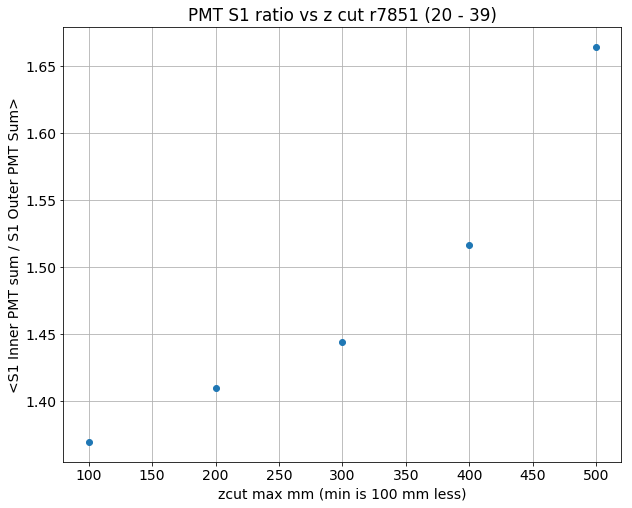

In [24]:
plt.plot(zcuts[1:], s1_ratios_data, 'o')
plt.xlabel('zcut max mm (min is 100 mm less)')
plt.ylabel('<S1 Inner PMT sum / S1 Outer PMT Sum>')
plt.title('PMT S1 ratio vs z cut r7851 ('+str(offset)+' - '+str(offset+num_files-1)+')')
plt.grid()
plt.show()

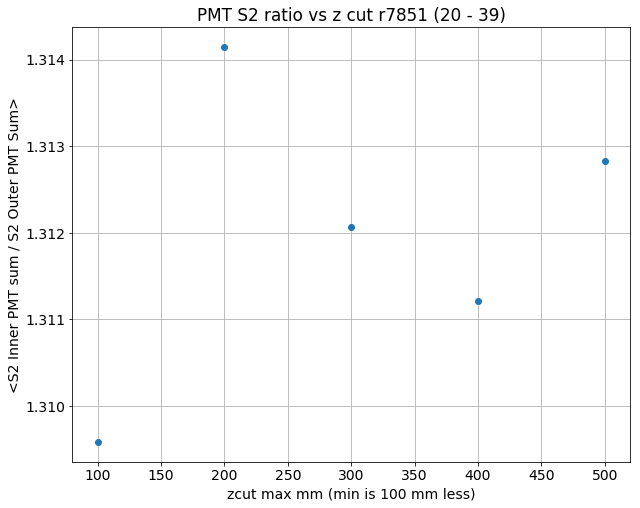

In [25]:
plt.plot(zcuts[1:], ratios_data, 'o')
plt.xlabel('zcut max mm (min is 100 mm less)')
plt.ylabel('<S2 Inner PMT sum / S2 Outer PMT Sum>')
plt.title('PMT S2 ratio vs z cut r7851 ('+str(offset)+' - '+str(offset+num_files-1)+')')
plt.grid()
plt.show()

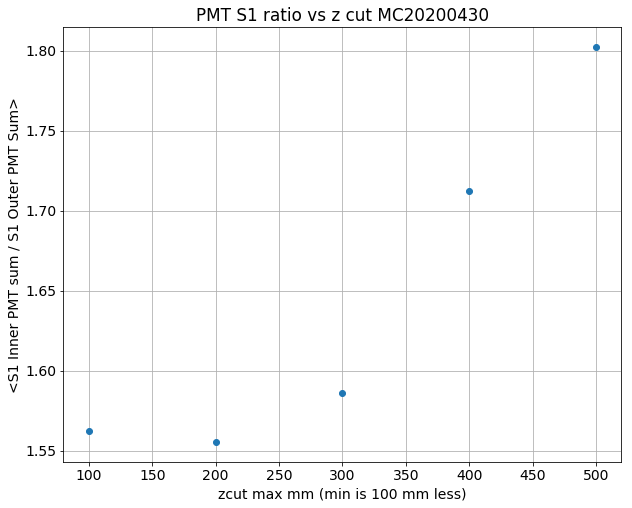

In [26]:
plt.plot(zcuts[1:], s1_ratios_mc, 'o')
plt.xlabel('zcut max mm (min is 100 mm less)')
plt.ylabel('<S1 Inner PMT sum / S1 Outer PMT Sum>')
plt.title('PMT S1 ratio vs z cut MC'+mc_date)
plt.grid()
plt.show()

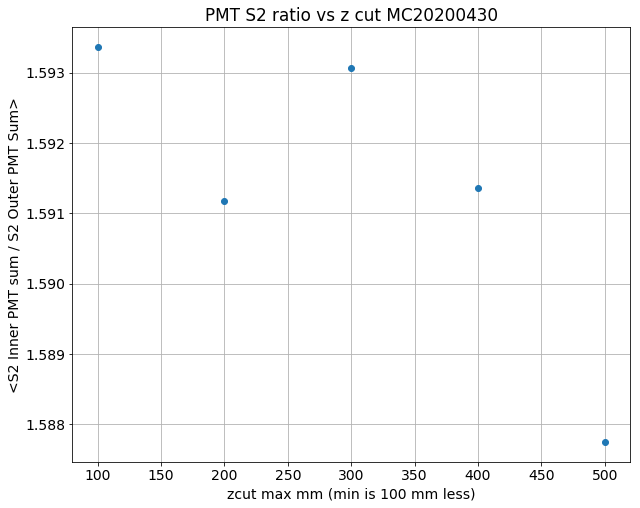

In [27]:
plt.plot(zcuts[1:], ratios_mc, 'o')
plt.xlabel('zcut max mm (min is 100 mm less)')
plt.ylabel('<S2 Inner PMT sum / S2 Outer PMT Sum>')
plt.title('PMT S2 ratio vs z cut MC'+mc_date)
plt.grid()
plt.show()

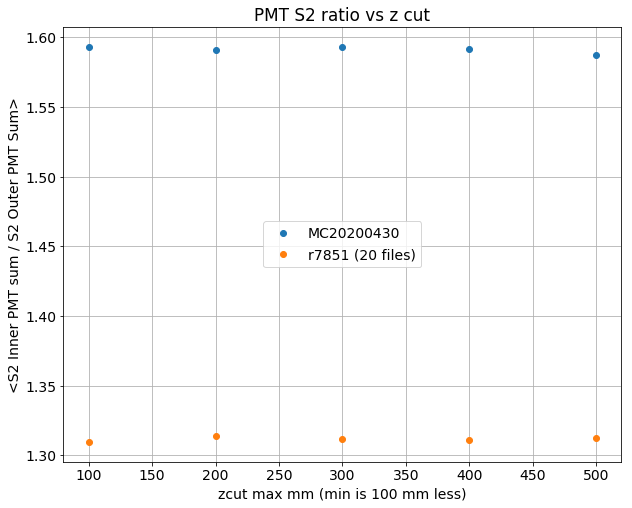

In [28]:
plt.plot(zcuts[1:], ratios_mc, 'o', label = 'MC'+mc_date)
plt.plot(zcuts[1:], ratios_data, 'o', label = 'r7851 (20 files)')
plt.xlabel('zcut max mm (min is 100 mm less)')
plt.ylabel('<S2 Inner PMT sum / S2 Outer PMT Sum>')
plt.title('PMT S2 ratio vs z cut')
plt.legend(loc='center')
plt.grid()
plt.show()

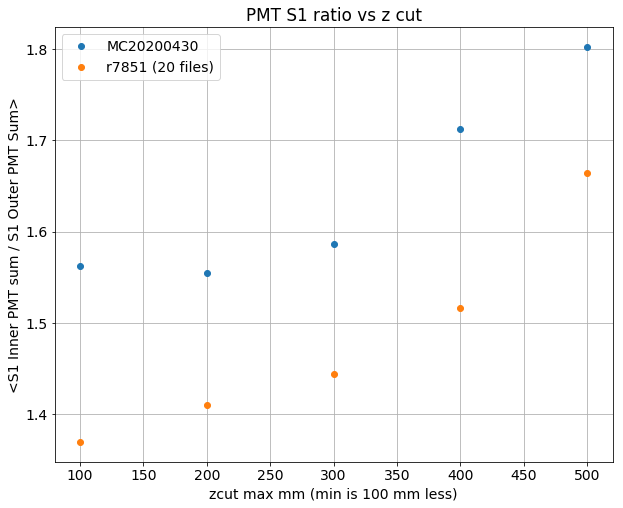

In [29]:
plt.plot(zcuts[1:], s1_ratios_mc, 'o', label = 'MC'+mc_date)
plt.plot(zcuts[1:], s1_ratios_data, 'o', label = 'r7851 (20 files)')
plt.xlabel('zcut max mm (min is 100 mm less)')
plt.ylabel('<S1 Inner PMT sum / S1 Outer PMT Sum>')
plt.title('PMT S1 ratio vs z cut')
plt.legend(loc='upper left')
plt.grid()
plt.show()

In [30]:
s1_ratios_mc[0]

1.5619149915605337

In [31]:
s1_ratios_data[0]

1.3698137687420753

In [32]:
ratios_mc[0]

1.5933678693516364

In [33]:
ratios_data[0]

1.3095843345132212

In [34]:
inner_indices

array([0, 1, 2])

In [37]:
print(ratios_mc)

[1.5933678693516364, 1.5911776925703018, 1.5930623810616107, 1.5913629289436746, 1.5877487161447383]


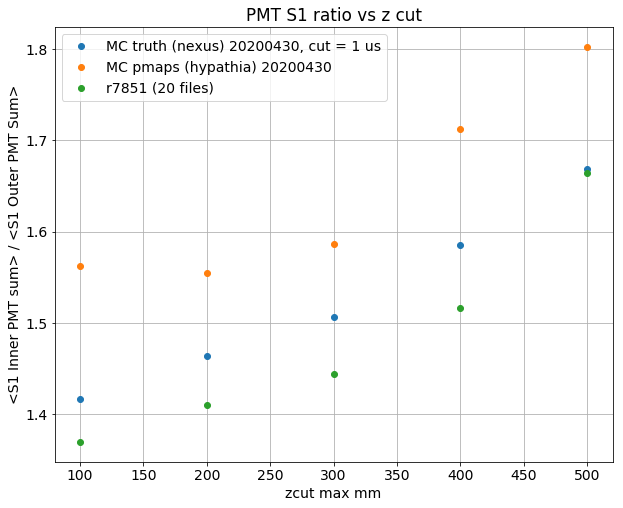

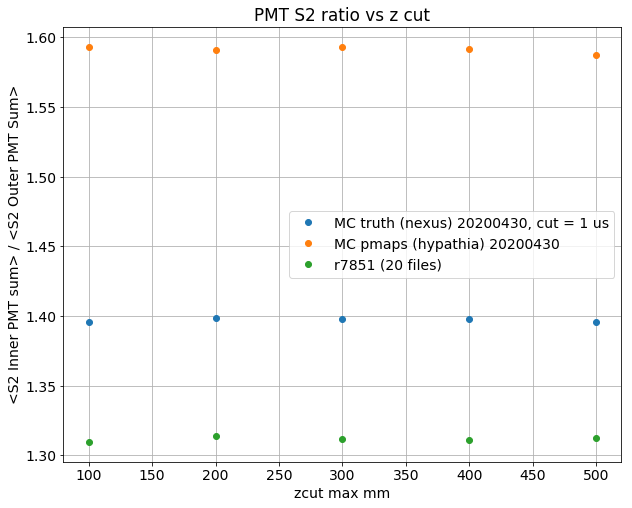

In [73]:
##### GLOBAL RATIO COMPARISON < inner sum > / < outer sum > #####

nexus_date = '20200430'
us_cut = '1 us'
hypathia_date = '20200430'

####################
### CHOOSE NEXUS ###
####################

if us_cut == '1 us':
    
    if nexus_date == '20200430':
        # This is all for nexus 20200430, 1 us cut
        zcut_max_mm = [100, 200, 300, 400, 500]
        s1_nexus_ratio = [1.4167762128325507, 1.4642381762733567, 1.506613422798866, 1.585383431969065, 1.668498293051154]
        s2_nexus_ratio = [1.3954688555461212, 1.3984008557262748, 1.398121352031371, 1.3980096627686185, 1.3955358595288887]

    elif nexus_date == '20200429':
        # This is for nexus 20200429, 1 us cut
        zcut_max_mm = [100, 200, 300, 400, 500]
        s1_nexus_ratio = [1.3213354465974743, 1.3420706655710763, 1.3668649425623167, 1.4010642365536579, 1.4421524663677132]
        s2_nexus_ratio = [1.2904397651788087, 1.2893888224859897, 1.2918302865381615, 1.2906568832496241, 1.2936954928521296]

elif us_cut == '2 us':
    
    if nexus_date == '20200430':
        # This is all for nexus 20200430, 2 us cut
        zcut_max_mm = [100, 200, 300, 400, 500]
        s1_nexus_ratio = [1.4131315538608198, 1.4643145976546703, 1.5066579576325283, 1.5853567270913023, 1.6684256337721683]
        s2_nexus_ratio = [1.3954747166467276, 1.398400650517535, 1.3981212172562794, 1.3980097084622904, 1.3955360420045257]

    elif nexus_date == '20200429':
        # This is for nexus 20200429, 2 us cut
        zcut_max_mm = [100, 200, 300, 400, 500]
        s1_nexus_ratio = [1.3175007628928899, 1.3422760887428102, 1.3668361086765994, 1.4010982008199333, 1.4420561550130226]
        s2_nexus_ratio = [1.2904411981943937, 1.2893882673121881, 1.2918303670993354, 1.2906567528765276, 1.2936958312089204]




####################
### CHOOSE PMAPS ###
####################

if hypathia_date == '20200430':
    # MC pmaps for 20200430
    zcuts_hypathia = [100, 200, 300, 400, 500]
    s1_hypathia_pmap_ratio = [1.5619149915605337, 1.5553153611393693, 1.5861481086840703, 1.7125425964603715, 1.8024598122774842]
    s2_hypathia_pmap_ratio = [1.5933678693516364, 1.5911776925703018, 1.5930623810616107, 1.5913629289436746, 1.5877487161447383]

elif hypathia_date == '20200429':
    # MC pmaps for 20200429
    zcuts_hypathia = [100, 200, 300, 400, 500]
    s1_hypathia_pmap_ratio = [1.4926071022368255, 1.4345380689511509, 1.4645754461871283, 1.4808894516103506, 1.579043142012283]
    s2_hypathia_pmap_ratio = [1.4760270112740188, 1.4731795080479575, 1.470864328820543, 1.4750344774727053, 1.4714707663508018]



plt.plot(zcut_max_mm, s1_nexus_ratio, 'o', label = 'MC truth (nexus) '+nexus_date+', cut = '+us_cut)
plt.plot(zcuts_hypathia, s1_hypathia_pmap_ratio, 'o', label = 'MC pmaps (hypathia) '+hypathia_date)
plt.plot(zcuts[1:], s1_ratios_data, 'o', label = 'r7851 (20 files)')
plt.grid()
plt.xlabel('zcut max mm')
plt.ylabel('<S1 Inner PMT sum> / <S1 Outer PMT Sum>')
plt.title('PMT S1 ratio vs z cut')
plt.legend()
plt.show()

plt.plot(zcut_max_mm, s2_nexus_ratio, 'o', label = 'MC truth (nexus) '+nexus_date+', cut = '+us_cut)
plt.plot(zcuts_hypathia, s2_hypathia_pmap_ratio, 'o', label = 'MC pmaps (hypathia) '+hypathia_date)
plt.plot(zcuts[1:], ratios_data, 'o', label = 'r7851 (20 files)')
plt.grid()
plt.xlabel('zcut max mm')
plt.ylabel('<S2 Inner PMT sum> / <S2 Outer PMT Sum>')
plt.title('PMT S2 ratio vs z cut')
plt.legend()
plt.show()

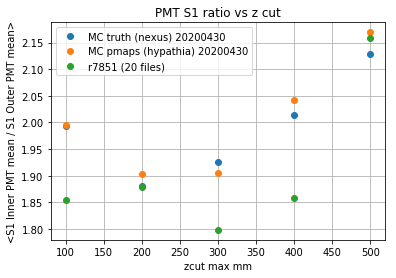

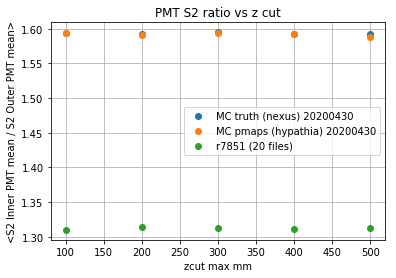

In [53]:
##### POINTWISE RATIO COMPARISON < inner sum / outer sum > #####

# For 20200430
hypathia_date = '20200430'
s1_ptws_ratios_hypathia = [1.996137973817912, 1.903210636922461, 1.9051181614073043, 2.042473436274581, 2.1694868734838706]
s2_ptws_ratios_hypathia = [1.593943798218356, 1.5916688640964602, 1.593549556342025, 1.591889469657799, 1.5883000319088978]

# For 20200430, fixed
nexus_date = '20200430'
s1_ptws_ratios_nexus = [1.9928526575153467, 1.8809972192916118, 1.9251310759709848, 2.013553932913265, 2.128018004270067]
s2_ptws_ratios_nexus = [1.5942619102819477, 1.5931558935543118, 1.595051505804295, 1.5918001189667885, 1.591821645947716]

# For first 20 files of 7851
s1_ptws_ratios_data = [1.855321182116355, 1.8791136813822682, 1.798286380294094, 1.8580268101451303, 2.1581568776699704]
s2_ptws_ratios_data = [1.3099473957786456, 1.314426046106145, 1.3121808450163701, 1.3114527506276963, 1.3131014318869259]

# plt.plot(zcut_max_mm, s1_nexus_ratio, 'o', label = 'MC truth (nexus) '+nexus_date+', cut = '+us_cut)
plt.plot(zcuts[1:], s1_ptws_ratios_nexus, 'o', label = 'MC truth (nexus) '+nexus_date)
plt.plot(zcuts[1:], s1_ptws_ratios_hypathia, 'o', label = 'MC pmaps (hypathia) '+hypathia_date)
plt.plot(zcuts[1:], s1_ptws_ratios_data, 'o', label = 'r7851 (20 files)')
plt.grid()
plt.xlabel('zcut max mm')
plt.ylabel('<S1 Inner PMT mean / S1 Outer PMT mean>')
plt.title('PMT S1 ratio vs z cut')
plt.legend()
plt.show()

plt.plot(zcuts[1:], s2_ptws_ratios_nexus, 'o', label = 'MC truth (nexus) '+nexus_date)
plt.plot(zcuts[1:], s2_ptws_ratios_hypathia, 'o', label = 'MC pmaps (hypathia) '+hypathia_date)
plt.plot(zcuts[1:], s2_ptws_ratios_data, 'o', label = 'r7851 (20 files)')
plt.grid()
plt.xlabel('zcut max mm')
plt.ylabel('<S2 Inner PMT mean / S2 Outer PMT mean>')
plt.title('PMT S2 ratio vs z cut')
plt.legend()
plt.show()


# XYZ bins

In [1]:
# Ok. I want to separate events into 3x3 xy bins and 5 z bins, then for each bin, generate a plot
# of PMT data / PMT MC for each PMT.
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
from invisible_cities.database import load_db
sipm_info = load_db.DataSiPM('new', -6400)

import time
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = 10, 8
plt.rcParams["font.size"     ] = 14
from invisible_cities.io.pmaps_io import load_pmaps

In [3]:
def four_digit(i):
    j = str(i)
    while len(j) < 4:
        j = '0'+j
    return j

In [4]:
# The normal MC location should be from now on '/Volumes/NEXT_data/IC_Data/simulation'. Remember
# when moving over data to look at irene outputs, even if you have to go up a few directories
# to find it.

# all_pmaps = ['/Volumes/NEXT_data/IC_Data/kdst/nexus_newKr_pmaps_NEW/new.kr83m.pmaps.'+str(i)+'.h5' for i in range(1, 501)]

# Run, offset, num_files
run_number = 7851
offset = 0
num_files = 40
data_pmaps_files = ['/Volumes/NEXT_data/IC_Data/pmaps/'+str(run_number)+'/pmaps_'+four_digit(i)+'_'+str(run_number)+'_trigger1_v1.2.0_20191122_krbg1600.h5' for i in range(offset, offset + num_files)] # 20 is chosen because using all would take hours to read in

# 20200427. Flat 50% reflectance. No PEDOT
# mc_date = '20200427'
# mc_pmaps_files = ['/Volumes/NEXT_data/IC_Data/simulation/20200427/new.kr83m.pmaps.'+str(i)+'.h5' for i in range(1, 501)]

# 20200430. 10% blue light, 0% VUV
mc_date = '20200430'
mc_pmaps_files = ['/Volumes/NEXT_data/IC_Data/pmaps/mc20200430/new.kr83m.hypathia.'+str(i)+'.h5' for i in range(1, 501)]

# 20200429
# mc_date = '20200429'
# mc_pmaps_files = ['/Volumes/NEXT_data/IC_Data/pmaps/mc'+mc_date+'/new.kr83m.hypathia.'+str(i)+'.h5' for i in range(1, 501)]

In [5]:
def read_in_good_pmaps(myallpmaps):
    t0 = time.time()
    print('Loading', myallpmaps[0], 'to', myallpmaps[-1])
    my_pmaps = [load_pmaps(pmap_file) for pmap_file in myallpmaps]
    print('Time to load', len(my_pmaps), 'pmaps =', time.time() - t0)
    my_pmaps = reindex(my_pmaps)
    s1s2selection(my_pmaps)
    return my_pmaps

In [7]:
def reindex(pmaps_list):    
    event_total = 0
    reindexed_pmaps = {}
    for i in range(len(pmaps_list)):
        keys = list(pmaps_list[i].keys())
        for k in keys:
            reindexed_pmaps[event_total] = pmaps_list[i][k]
            event_total += 1
    return reindexed_pmaps.copy()

In [9]:
def s1s2selection(pmaps_list):
    print('Num events before selection =', len(pmaps_list))
    bad_keys = []

    for k in pmaps_list.keys():
        if not len(pmaps_list[k].s1s) == 1:
            bad_keys.append(k)
        elif not len(pmaps_list[k].s2s) == 1:
            bad_keys.append(k)
        elif len(pmaps_list[k].s2s[0].sipms.ids) == 0:
            bad_keys.append(k)
            print(k, 'HAS NO SIPM RESPONSE')
        
    for k in bad_keys:
        del pmaps_list[k]

    print('Num events after selection =', len(pmaps_list))

In [10]:
good_data_pmaps = read_in_good_pmaps(data_pmaps_files)

Loading /Volumes/NEXT_data/IC_Data/pmaps/7851/pmaps_0000_7851_trigger1_v1.2.0_20191122_krbg1600.h5 to /Volumes/NEXT_data/IC_Data/pmaps/7851/pmaps_0039_7851_trigger1_v1.2.0_20191122_krbg1600.h5
Time to load 40 pmaps = 120.274649143219
Num events before selection = 12416
Num events after selection = 9454


In [11]:
good_mc_pmaps = read_in_good_pmaps(mc_pmaps_files)

Loading /Volumes/NEXT_data/IC_Data/pmaps/mc20200430/new.kr83m.hypathia.1.h5 to /Volumes/NEXT_data/IC_Data/pmaps/mc20200430/new.kr83m.hypathia.500.h5
Time to load 500 pmaps = 658.5832231044769
Num events before selection = 49960
Num events after selection = 28088


In [12]:
import itertools

def drift_times_from_pmaps(allpmaps):
    return {k : 0.97 * (allpmaps[k].s2s[0].time_at_max_energy / 1000 - allpmaps[k].s1s[0].time_at_max_energy / 1000) for k in allpmaps.keys() }

def get_xys(allpmaps):

    xys = {}
    
    for k in allpmaps.keys():
        
        i = -1
        for j in range(len(allpmaps[k].s2s[0].sipms.sum_over_times)):
            if i == -1:
                i = j
            elif allpmaps[k].s2s[0].sipms.sum_over_times[j] > allpmaps[k].s2s[0].sipms.sum_over_times[i]:
                i = j

        max_id = allpmaps[k].s2s[0].sipms.ids[i]
        max_loc = sipm_info.iloc[max_id][['X', 'Y']]
        x = max_loc['X']
        y = max_loc['Y']
        
        xys[k] = [x, y]
        
    return xys

In [40]:
pmt_ids = [x for x in range(12)]

def varfrac(ex, ey, vx, vy):
    return (vx / ex**2 + vy / ey**2)*(ex / ey)**2    

def mean_signal_vsPMTZ(allpmaps, xr, yr, zranges):
        
    drifttimes = drift_times_from_pmaps(allpmaps)
    xys = get_xys(allpmaps)
    
    allsum = np.array([[0 for z in zranges] for p in pmt_ids])
    allnum = np.array([[0 for z in zranges] for p in pmt_ids])
    allval = [[[] for z in zranges] for p in pmt_ids]
    
    allsum1 = np.array([[0 for z in zranges] for p in pmt_ids])
    allnum1 = np.array([[0 for z in zranges] for p in pmt_ids])
    allval1 = [[[] for z in zranges] for p in pmt_ids]

    for zr, zi in zip(zranges, range(len(zranges))):
        # print('Scanning in xr, yr, zr =', xr, yr, zr)
        for k, pid in itertools.product(allpmaps.keys(), pmt_ids):
            if zr[0] <= drifttimes[k] < zr[1] and xr[0] <= xys[k][0] < xr[1] and yr[0] <= xys[k][1] < yr[1]:
                s2 = allpmaps[k].s2s[0].pmts.sum_over_times[pid]
                s1 = allpmaps[k].s1s[0].pmts.sum_over_times[pid]
                allsum[pid][zi] += s2
                allnum[pid][zi] += 1
                allval[pid][zi].append(s2)
                
                allsum1[pid][zi] += s1
                allnum1[pid][zi] += 1
                allval1[pid][zi].append(s1)

    allnum[allnum == 0] = 1
    allnum1[allnum1 == 0] = 1
    
    meanS2 = allsum / allnum
    meanS1 = allsum1 / allnum1
    
    for p in pmt_ids:
        fig, axs = plt.subplots(1,len(zranges), figsize=(20,5))
        for zi in range(len(zranges)):
            axs[zi].hist(allval[p][zi], color = 'skyblue')
            axs[zi].set_title('S2; PMT'+str(p)+'; Zslice'+str(zi))
        plt.show()
    
    for p in pmt_ids:
        fig, axs = plt.subplots(1,len(zranges), figsize=(20,5))
        for zi in range(len(zranges)):
            axs[zi].hist(allval1[p][zi], color = 'lightcoral')
            axs[zi].set_title('S1; PMT'+str(p)+'; Zslice'+str(zi))
        plt.show()

    varS2 = [[ np.std(allval[p][zi])**2 for z in zranges] for p in pmt_ids]
    varS1 = [[ np.std(allval1[p][zi])**2 for z in zranges] for p in pmt_ids]

    # print('For the first xr, yr, we have')
    # print(allsum)
    # print(allnum)
    
    return meanS1, meanS2, varS1, varS2

xr = [-210, -70] ; yr = [-210, -70]
calculating data...
calculating mc...
Dividing S2s
Dividing S1s


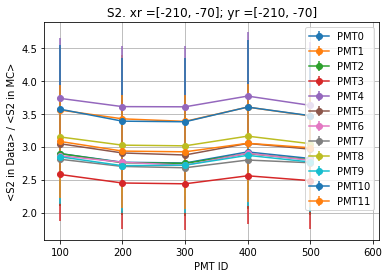

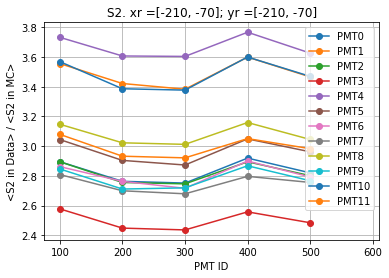

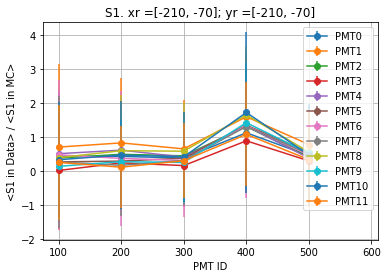

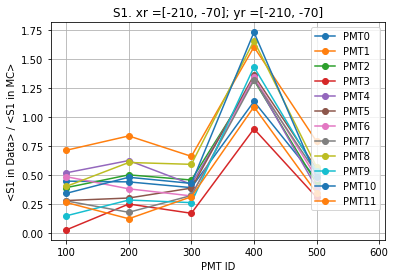

xr = [-210, -70] ; yr = [-70, 70]
calculating data...
calculating mc...
Dividing S2s
Dividing S1s


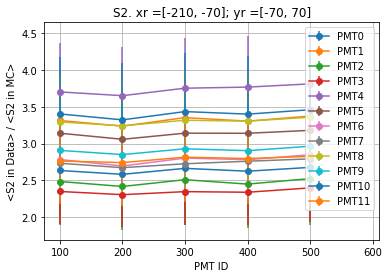

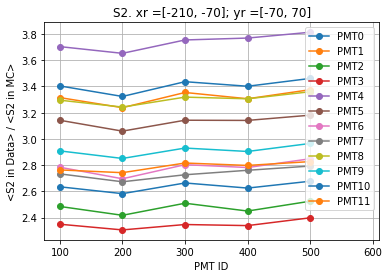

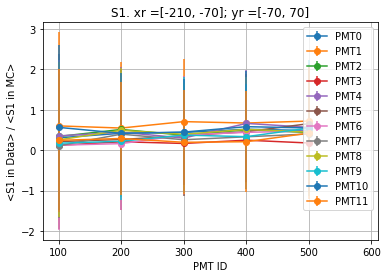

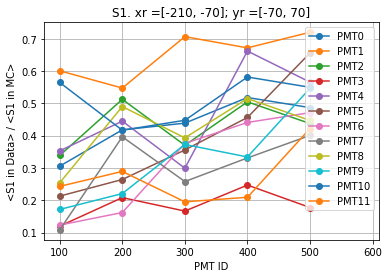

xr = [-210, -70] ; yr = [70, 210]
calculating data...
calculating mc...
Dividing S2s
Dividing S1s


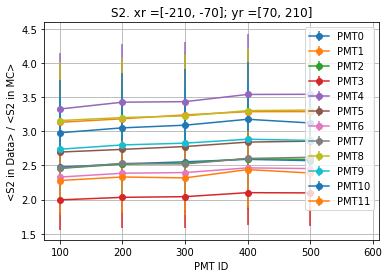

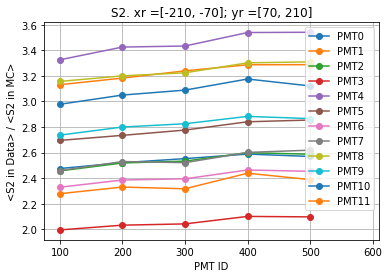

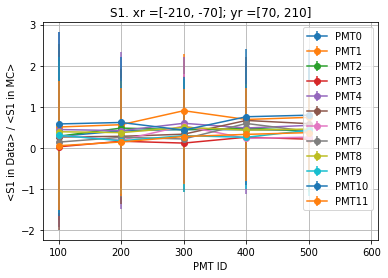

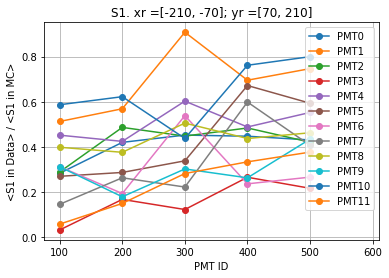

xr = [-70, 70] ; yr = [-210, -70]
calculating data...
calculating mc...
Dividing S2s
Dividing S1s


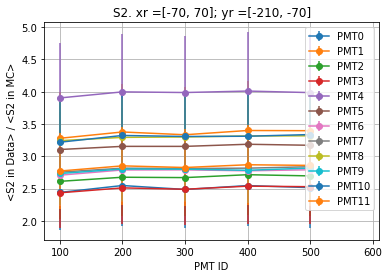

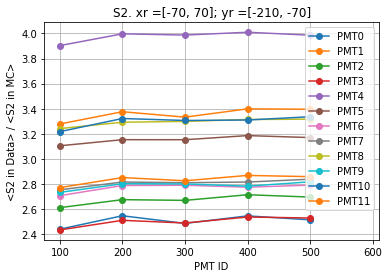

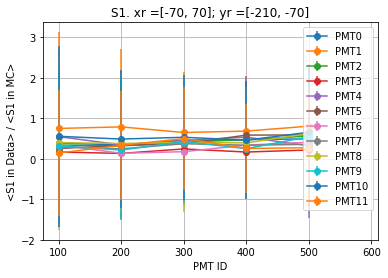

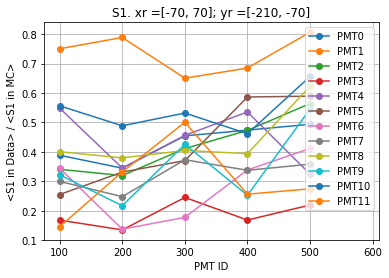

xr = [-70, 70] ; yr = [-70, 70]
calculating data...
calculating mc...
Dividing S2s
Dividing S1s


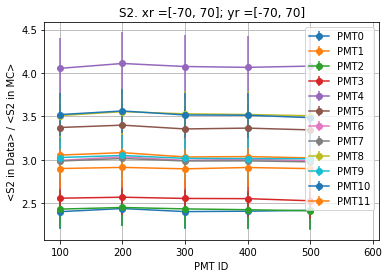

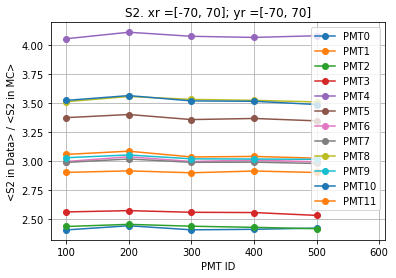

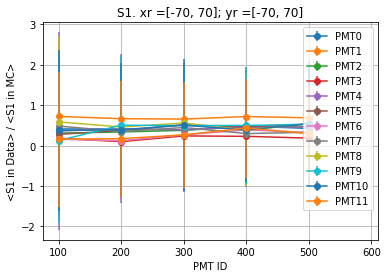

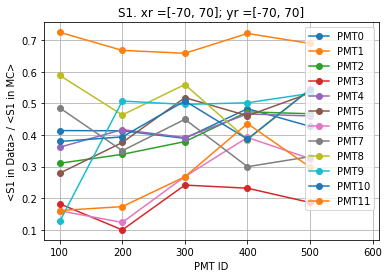

xr = [-70, 70] ; yr = [70, 210]
calculating data...
calculating mc...
Dividing S2s
Dividing S1s


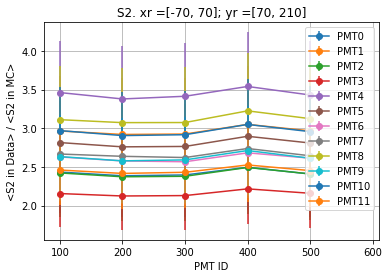

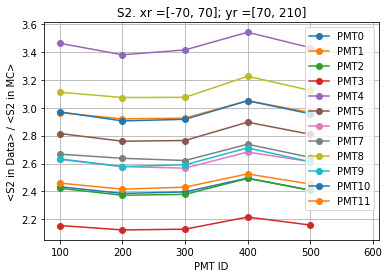

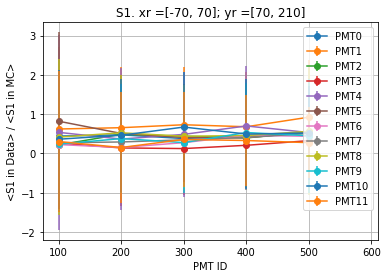

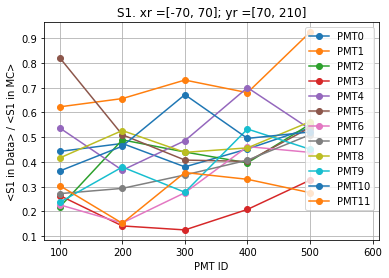

xr = [70, 210] ; yr = [-210, -70]
calculating data...
calculating mc...
Dividing S2s
Dividing S1s


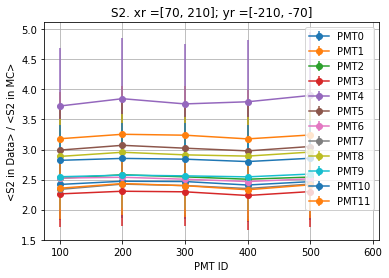

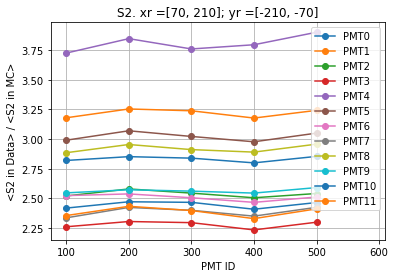

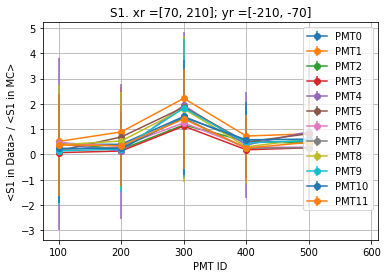

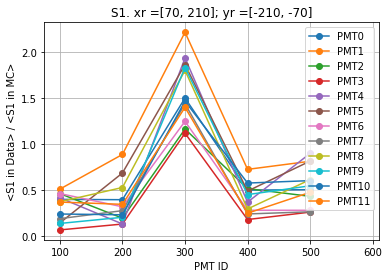

xr = [70, 210] ; yr = [-70, 70]
calculating data...
calculating mc...
Dividing S2s
Dividing S1s


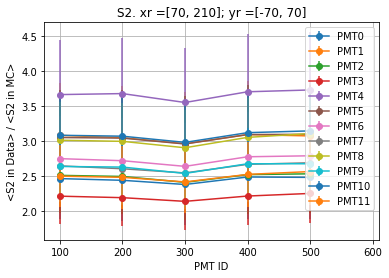

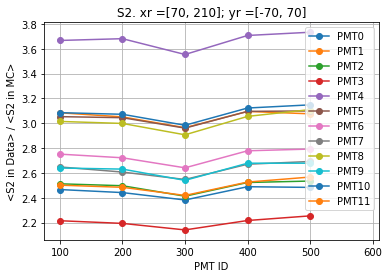

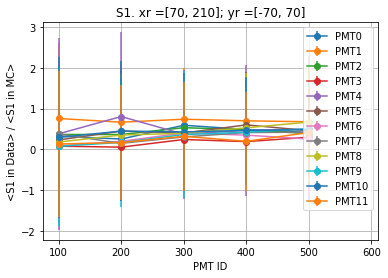

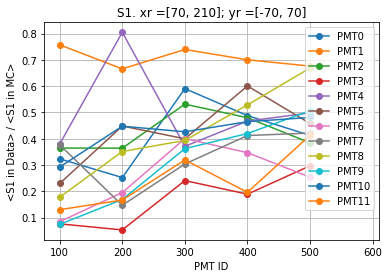

xr = [70, 210] ; yr = [70, 210]
calculating data...
calculating mc...
Dividing S2s
Dividing S1s


/Users/jmhaefner/miniconda/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.
/Users/jmhaefner/miniconda/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in multiply
  after removing the cwd from sys.path.


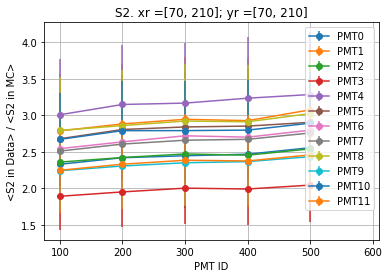

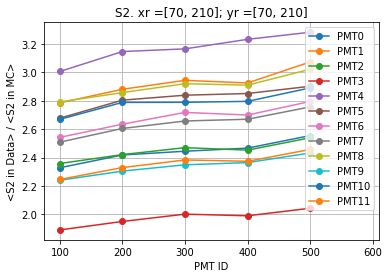

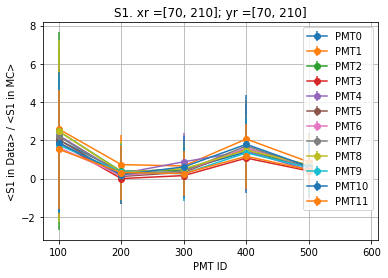

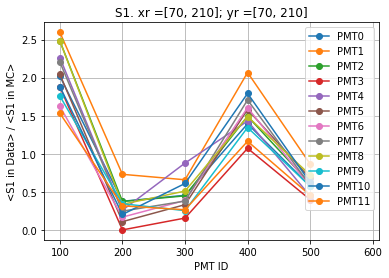

In [14]:
#xedges = [-210, -70]
xedges = [-210, -70, 70, 210]
xranges = [[xedges[i], xedges[i+1]] for i in range(len(xedges)-1)]

#yedges = [-70, 70]
yedges = [-210, -70, 70, 210]
yranges = [[yedges[i], yedges[i+1]] for i in range(len(yedges)-1)]

zcuts = [2, 100, 200, 300, 400, 500]
zranges = [[zcuts[i], zcuts[i+1]] for i in range(len(zcuts)-1)]

for xr, yr in itertools.product(xranges, yranges):
    print('xr =', xr, '; yr =', yr)

    print('calculating data...')
    data_s1avgs_ZPMT, data_s2avgs_ZPMT, data_s1vars, data_s2vars = mean_signal_vsPMTZ(good_data_pmaps, xr, yr, zranges)
    print('calculating mc...')
    mc_s1avgs_ZPMT, mc_s2avgs_ZPMT, mc_s1vars, mc_s2vars = mean_signal_vsPMTZ(good_mc_pmaps, xr, yr, zranges)
    
    # print('Data ZPMTs =', data_s2avgs_ZPMT)
    # print('MC ZPMTS   =', mc_s2avgs_ZPMT)
    
    print('Dividing S2s')
    pmt_ratios_s2 = data_s2avgs_ZPMT / mc_s2avgs_ZPMT
    pmt_ratios_s2[pmt_ratios_s2 == np.inf] = 0

    print('Dividing S1s')                
    pmt_ratios_s1 = data_s1avgs_ZPMT / mc_s1avgs_ZPMT
    pmt_ratios_s1[pmt_ratios_s1 == np.inf] = 0
    
    pmt_ratios_s1_err = varfrac(data_s1avgs_ZPMT, mc_s1avgs_ZPMT, data_s1vars, mc_s1vars)**0.5
    pmt_ratios_s2_err = varfrac(data_s2avgs_ZPMT, mc_s2avgs_ZPMT, data_s2vars, mc_s2vars)**0.5
    
    ## Plot with error bars
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], pmt_ratios_s2[pid], yerr = pmt_ratios_s2_err[pid], fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('PMT ID')
    plt.ylabel('<S2 in Data> / <S2 in MC>')
    plt.xlim(75, 610)
    plt.title('S2. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()
    
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], pmt_ratios_s2[pid], fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('PMT ID')
    plt.ylabel('<S2 in Data> / <S2 in MC>')
    plt.xlim(75, 610)
    plt.title('S2. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    ## Plot without error bars
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], pmt_ratios_s1[pid], yerr = pmt_ratios_s1_err[pid], fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('PMT ID')
    plt.ylabel('<S1 in Data> / <S1 in MC>')
    plt.xlim(75, 610)
    plt.title('S1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()
    
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], pmt_ratios_s1[pid], fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('PMT ID')
    plt.ylabel('<S1 in Data> / <S1 in MC>')
    plt.xlim(75, 610)
    plt.title('S1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

In [92]:
test / test

array([[1., 1.],
       [1., 1.],
       [1., 1.]])

In [97]:
test.astype(int)

array([[1, 2],
       [3, 5],
       [9, 8]])

In [99]:
test2 = test / (test - 1)

/Users/jmhaefner/miniconda/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.


In [101]:
test2[test2 == np.inf] = 1

In [102]:
test2

array([[1.        , 2.        ],
       [1.5       , 1.25      ],
       [1.125     , 1.14285714]])

In [166]:
x1 = np.array([1, 2, 3, 4, 5, 6, 7])
x2 = np.array([8, 2, 6, 3, 1, 7, 4])
np.cov(x1, x2)

array([[ 4.66666667, -1.16666667],
       [-1.16666667,  6.95238095]])

In [169]:
np.var(x2)

5.959183673469388

In [163]:
np.cov(x1, x1)

array([[4.66666667, 4.66666667],
       [4.66666667, 4.66666667]])

In [168]:
np.mean(x1*x2)-np.mean(x1)*np.mean(x2)

-1.0

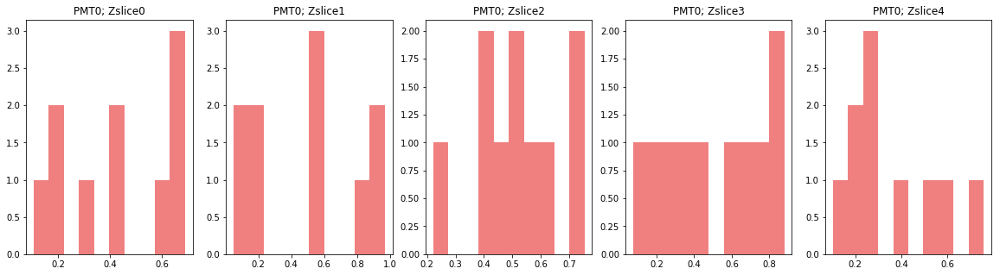

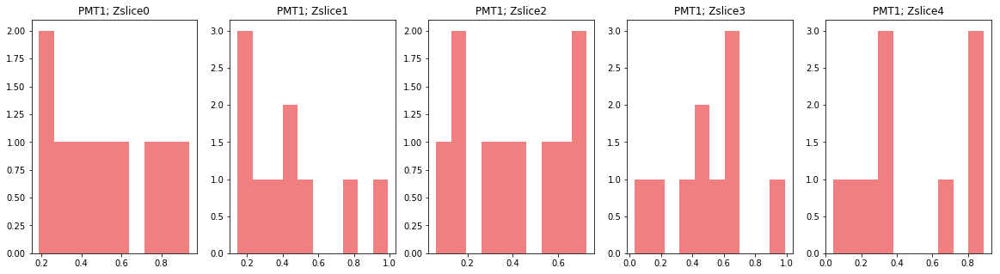

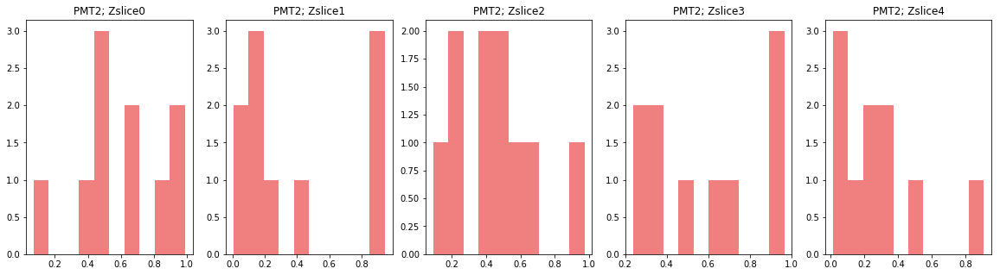

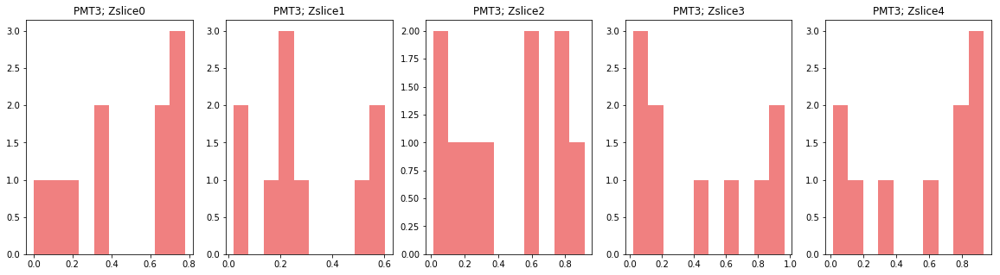

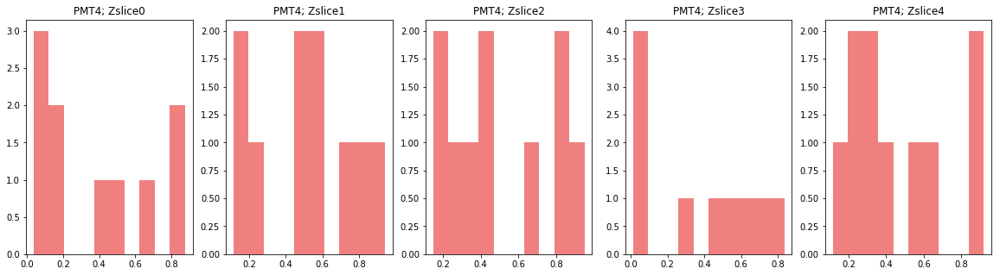

...

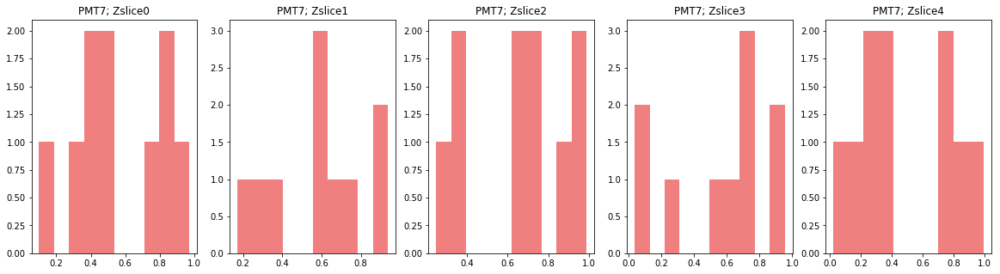

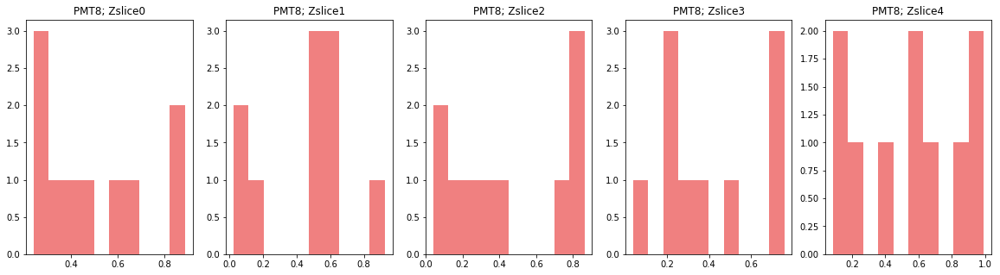

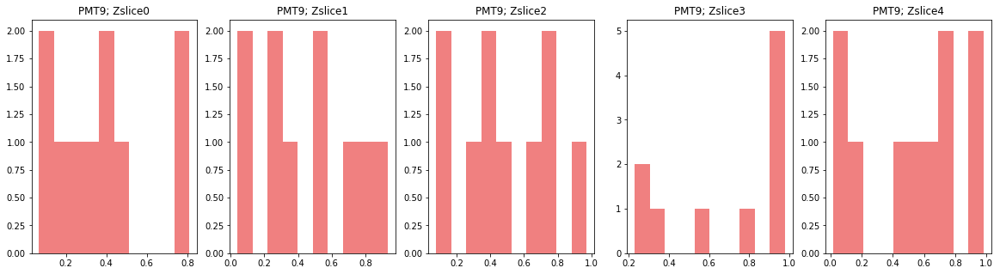

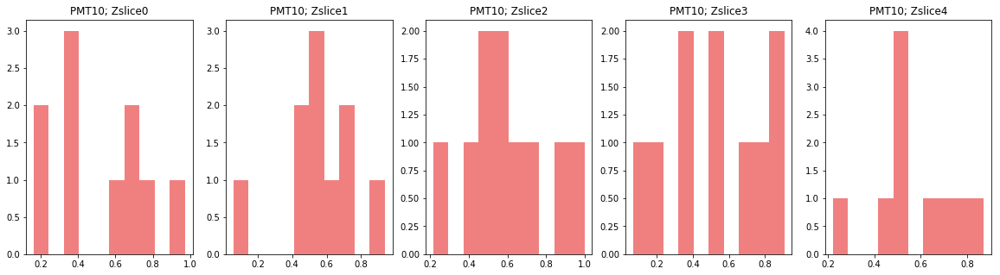

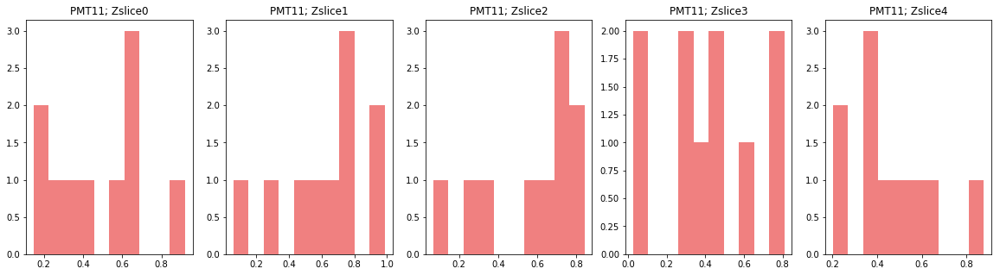

In [39]:
allval = [[np.random.rand(10) for zi in zranges] for p in pmt_ids]

for p in pmt_ids:
    fig, axs = plt.subplots(1,len(zranges), figsize=(20,5))
    for zi in range(len(zranges)):
        axs[zi].hist(allval[p][zi], color = 'lightcoral')
        axs[zi].set_title('PMT'+str(p)+'; Zslice'+str(zi))
    plt.show()


xr = [-210, -70] ; yr = [-210, -70]
calculating data...


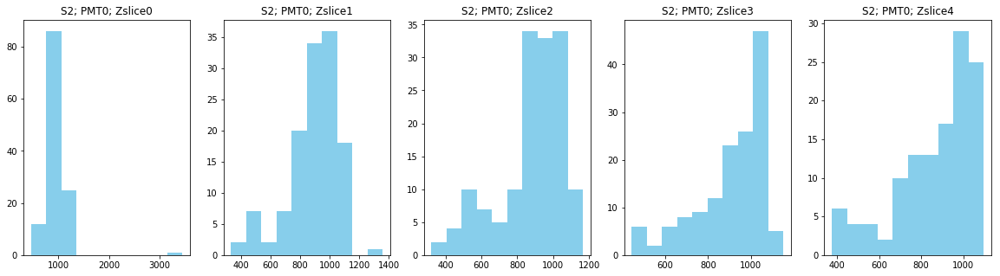

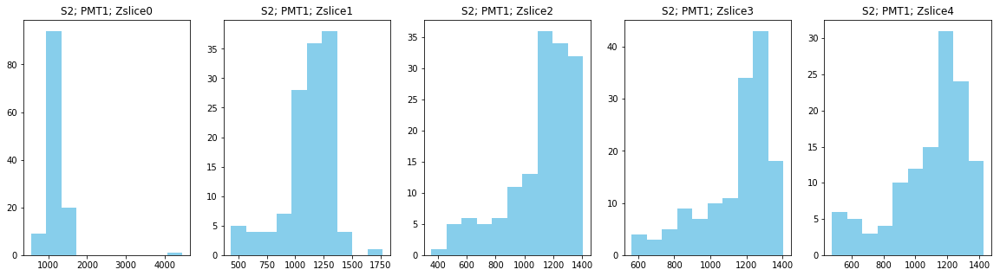

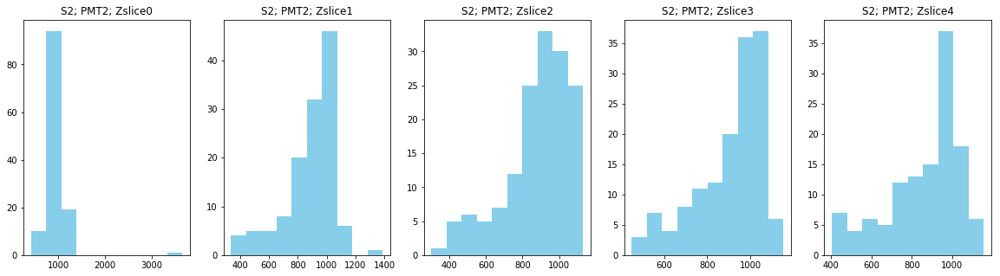

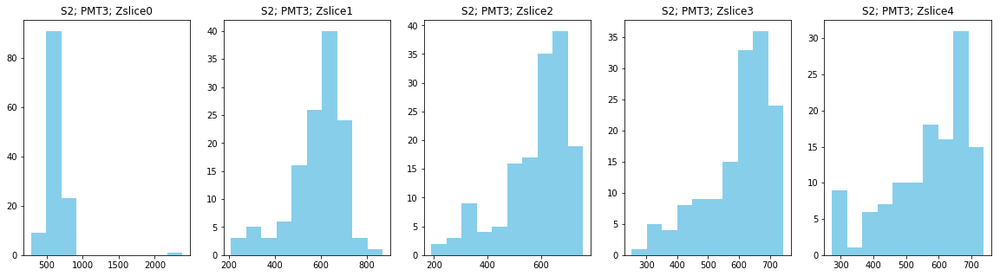

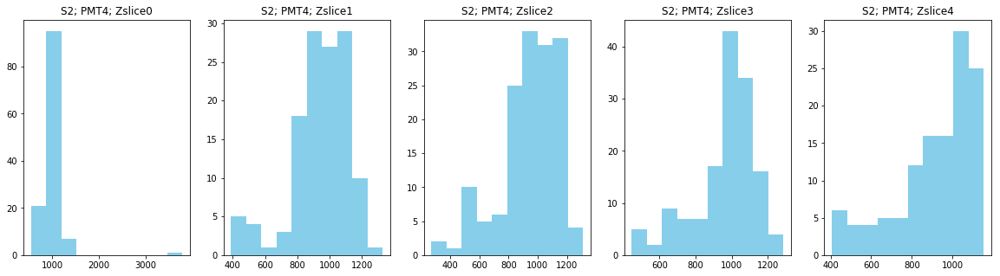

...

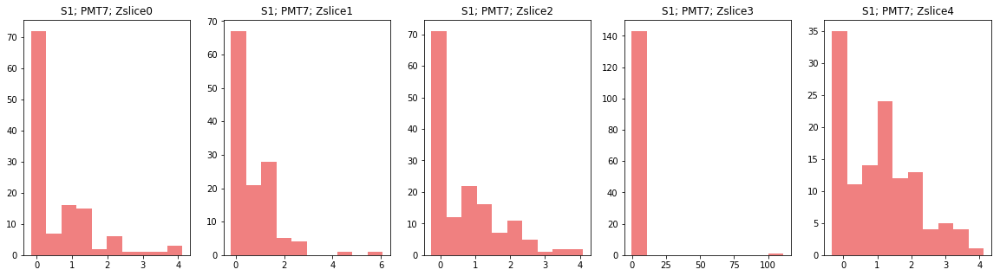

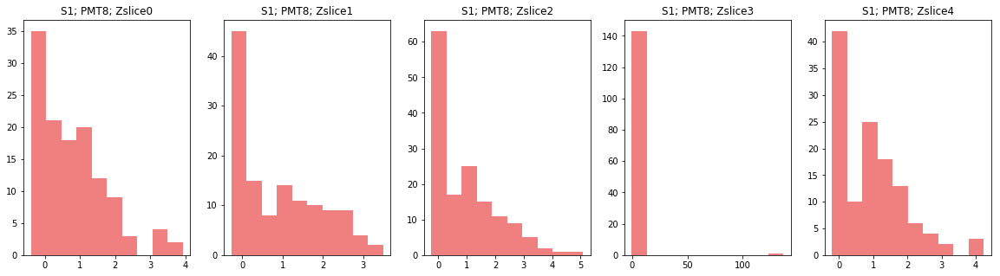

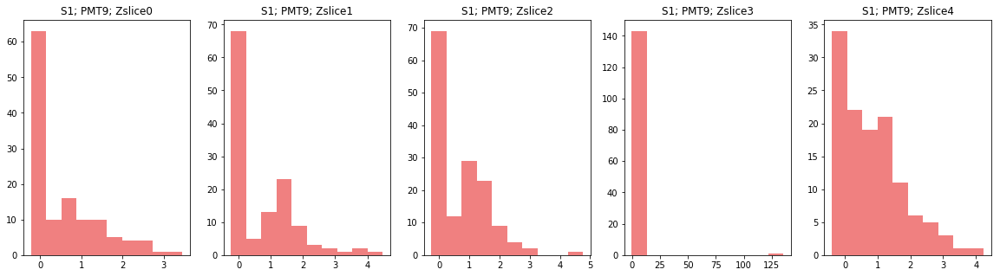

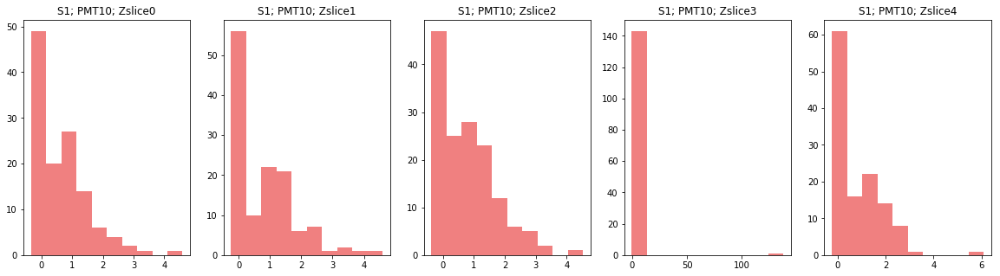

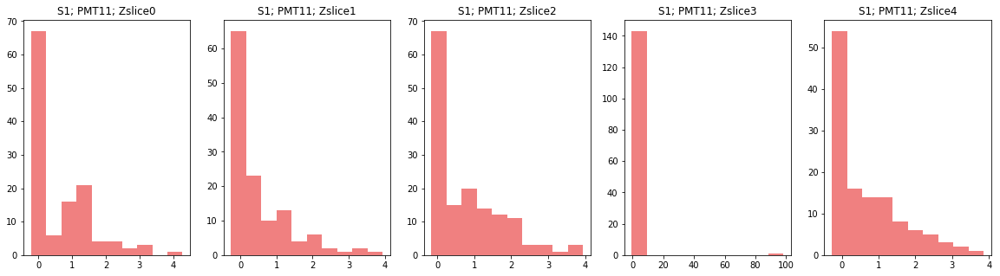

calculating mc...


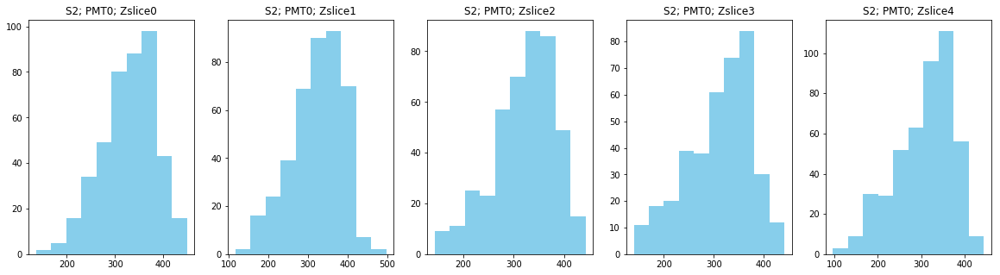

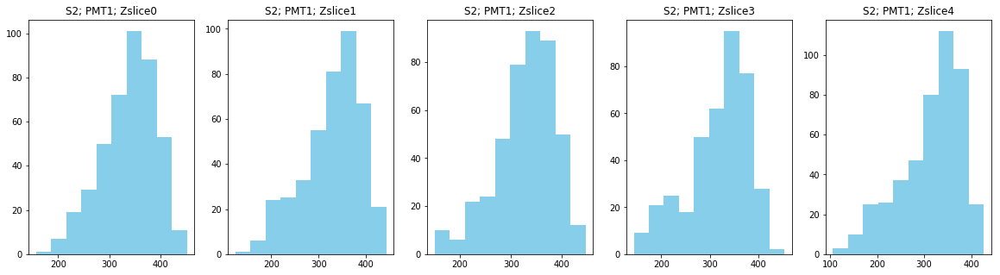

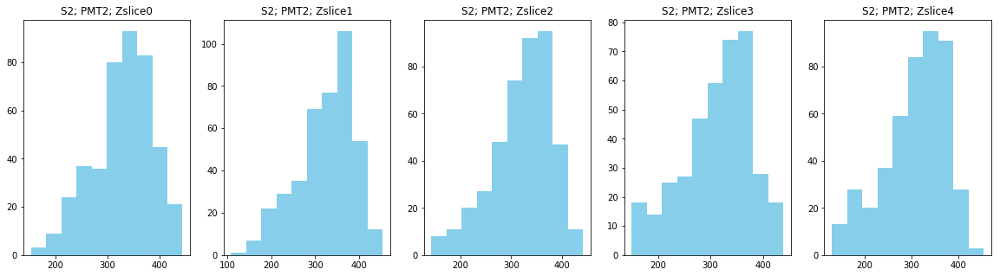

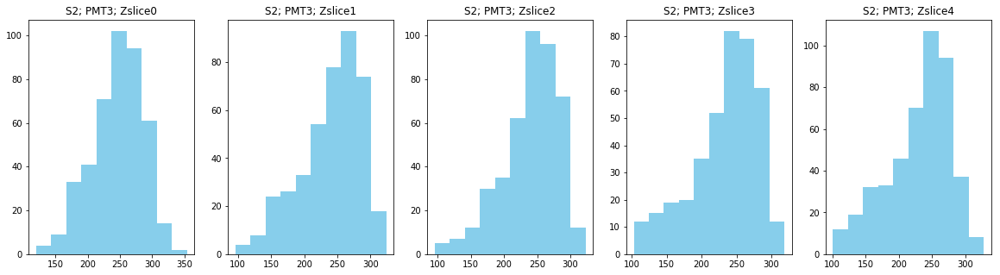

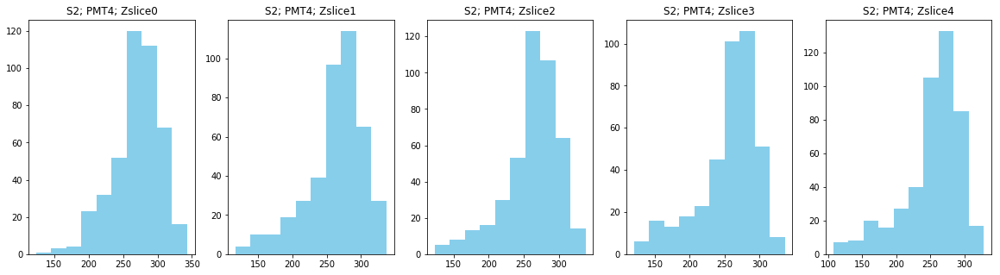

...

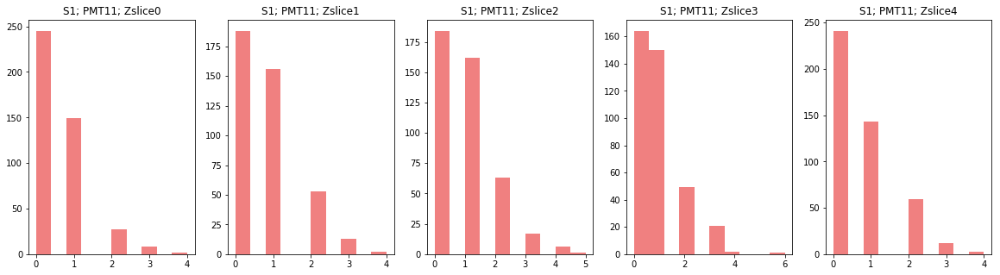

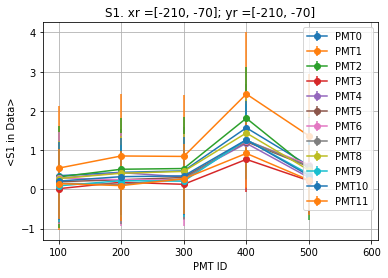

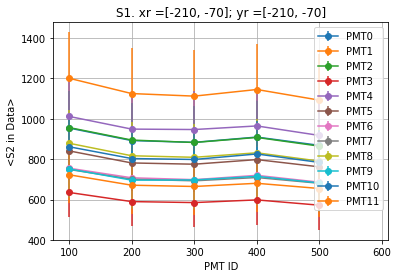

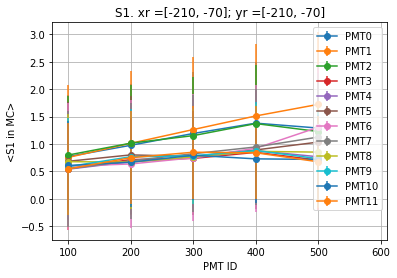

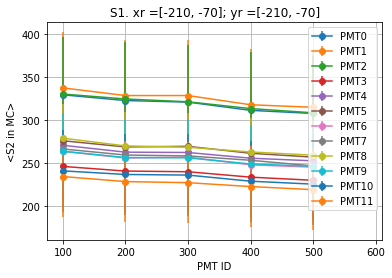

Dividing S2s
Dividing S1s


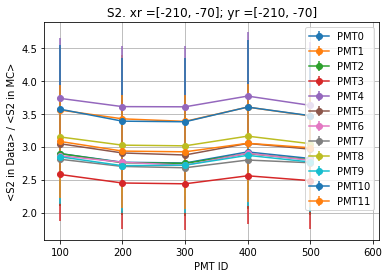

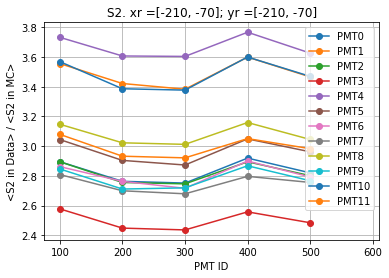

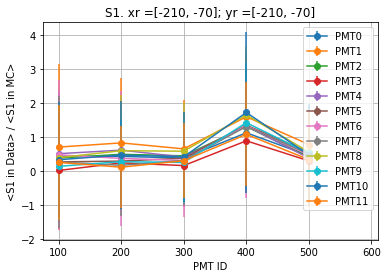

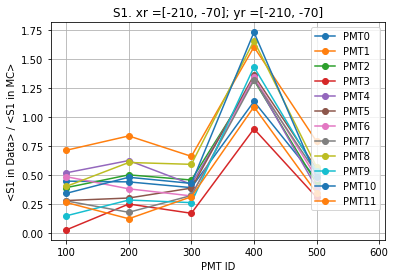

xr = [-210, -70] ; yr = [-70, 70]
calculating data...


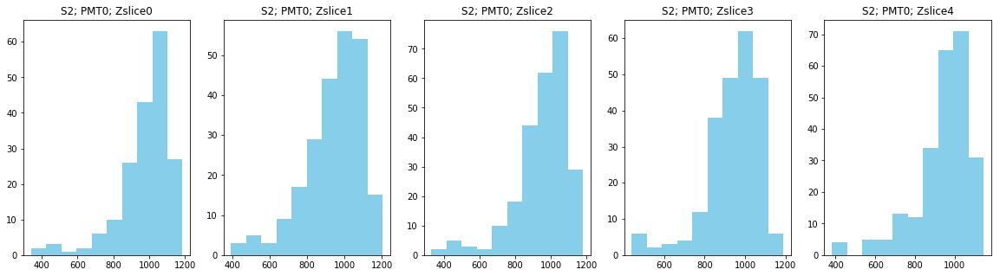

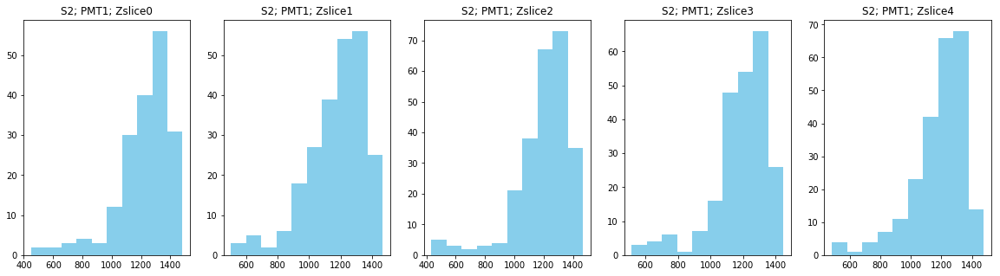

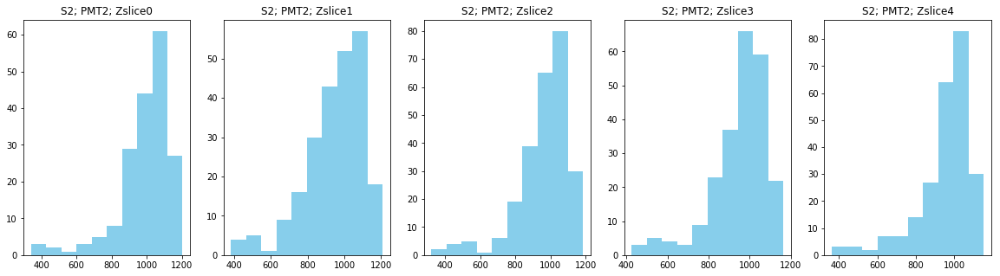

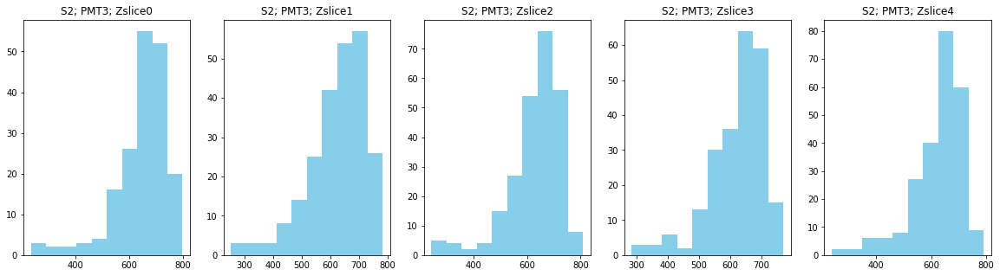

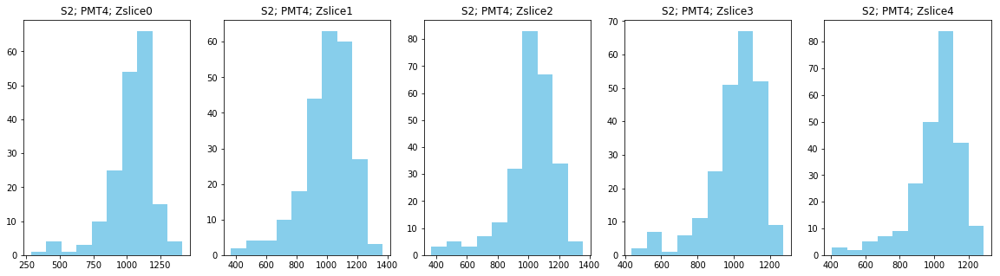

...

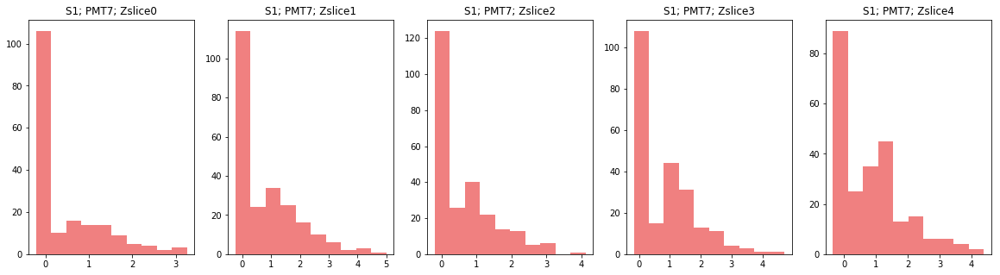

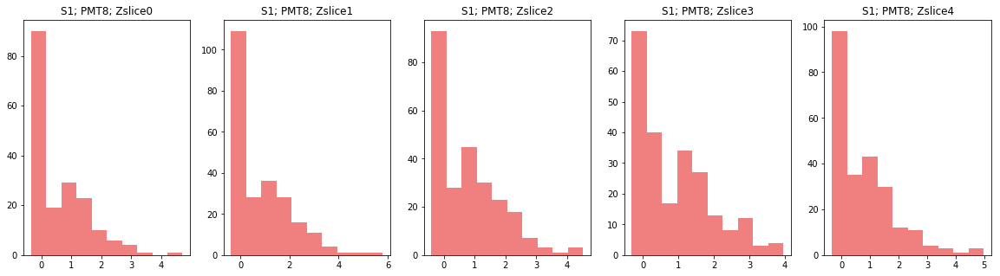

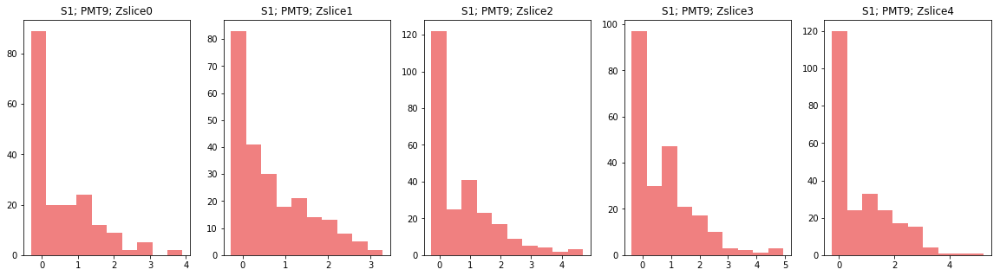

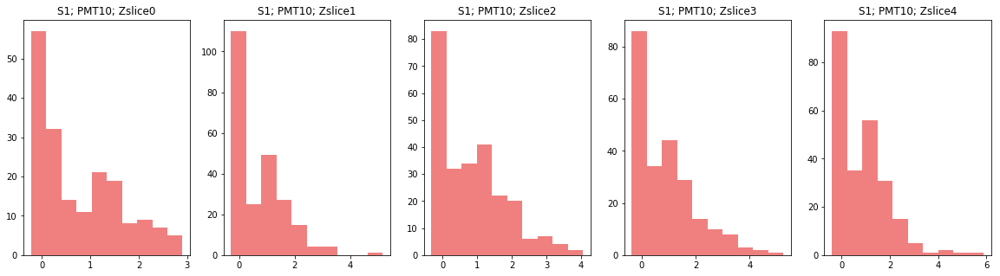

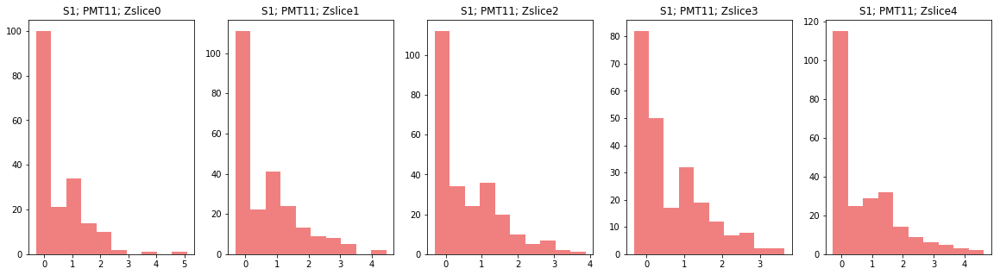

calculating mc...


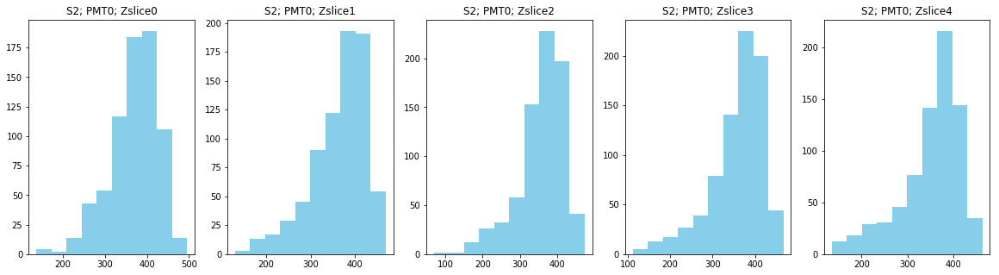

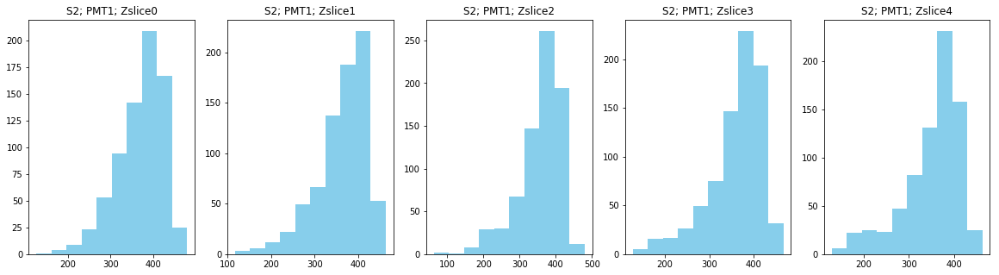

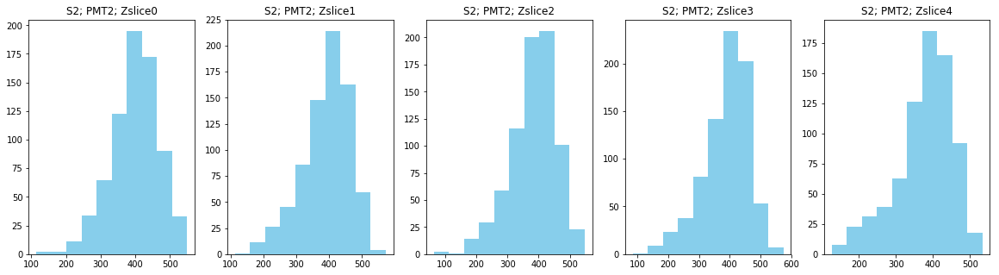

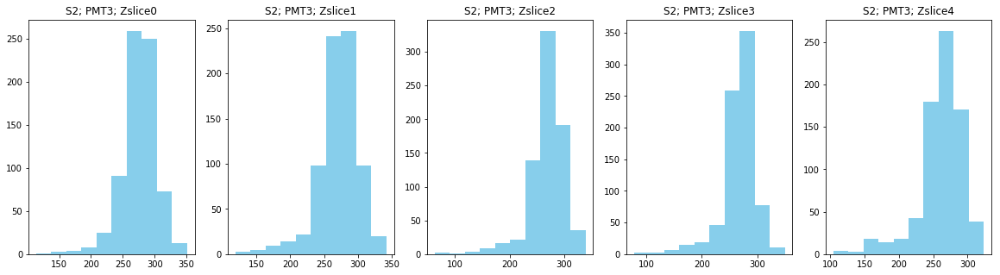

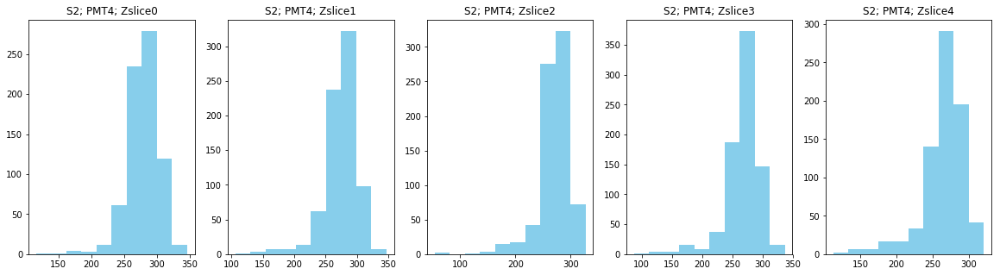

...

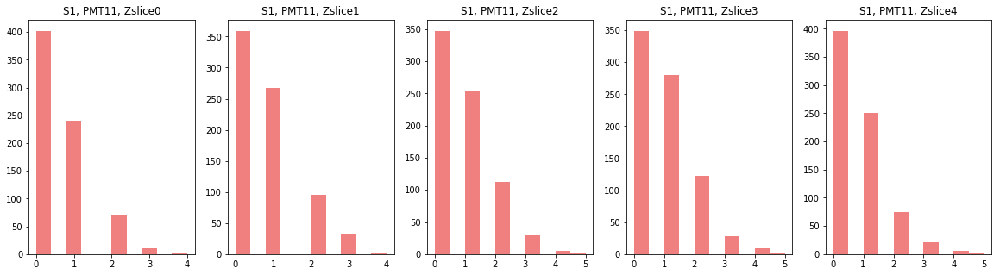

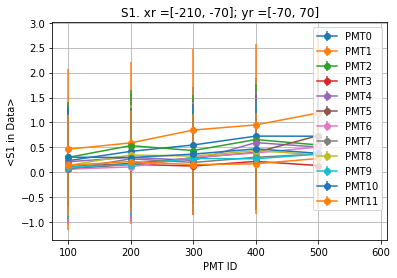

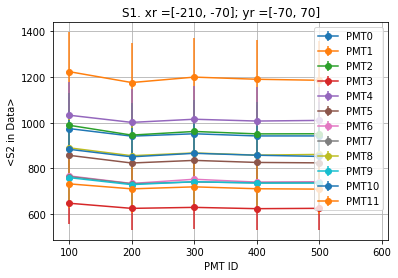

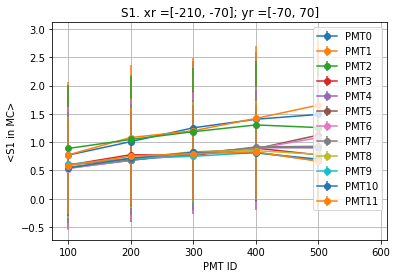

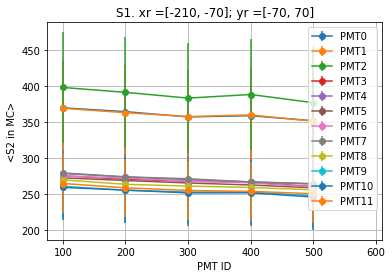

Dividing S2s
Dividing S1s


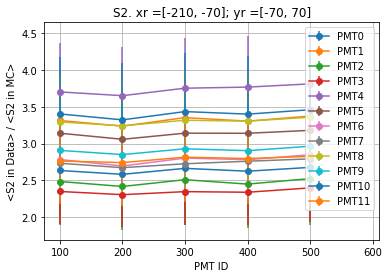

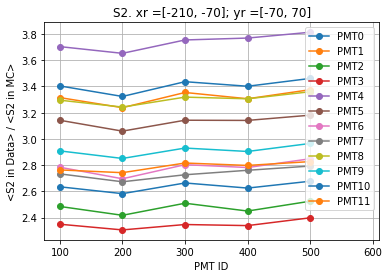

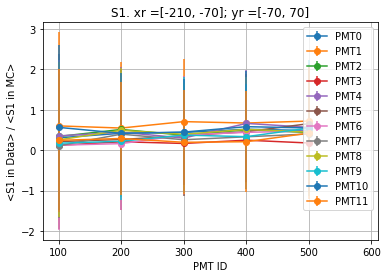

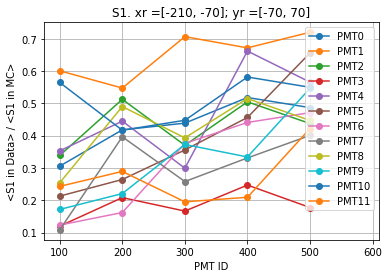

xr = [-210, -70] ; yr = [70, 210]
calculating data...


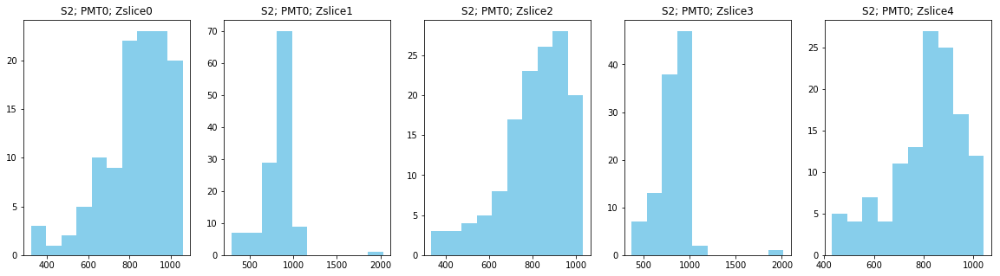

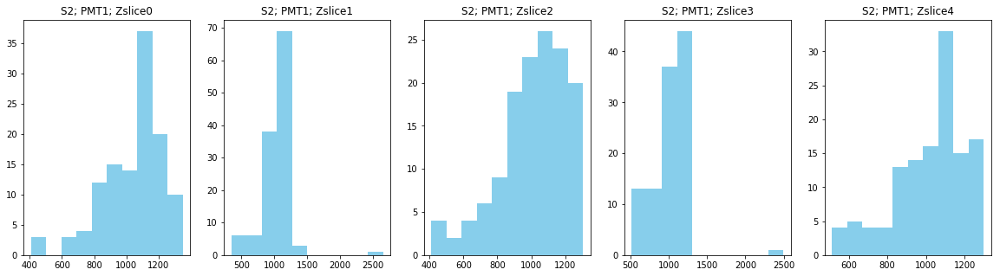

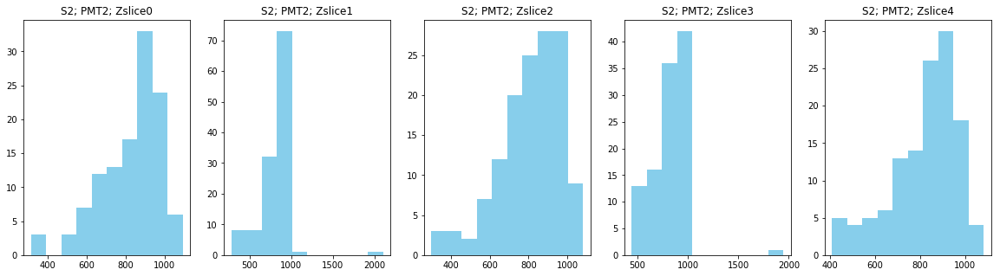

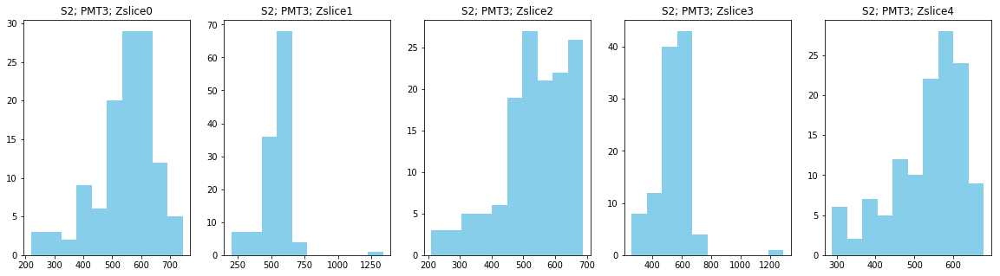

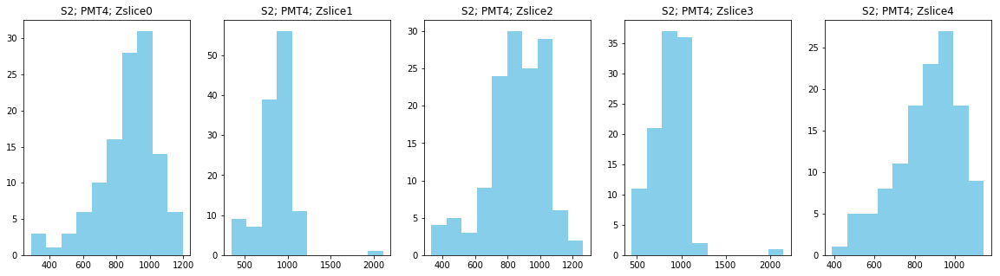

...

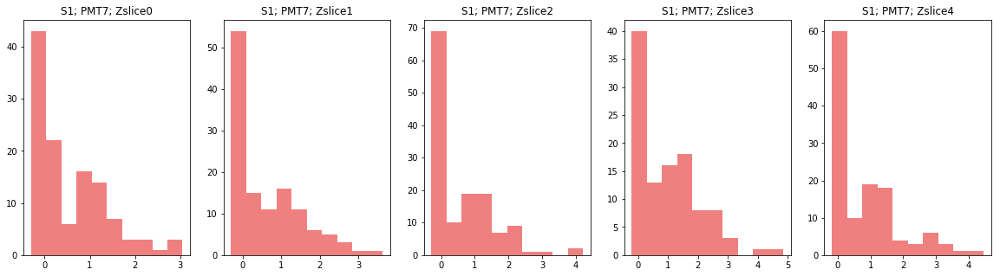

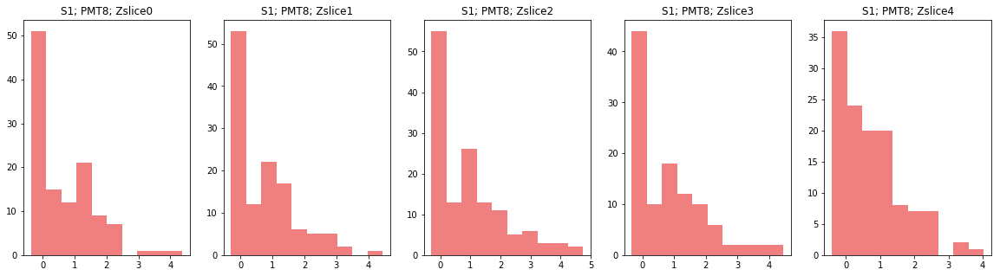

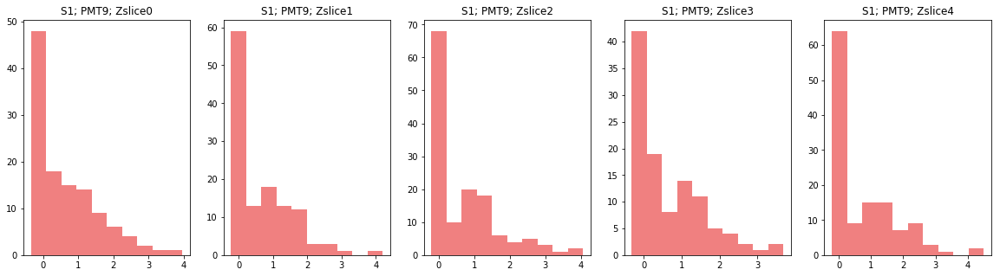

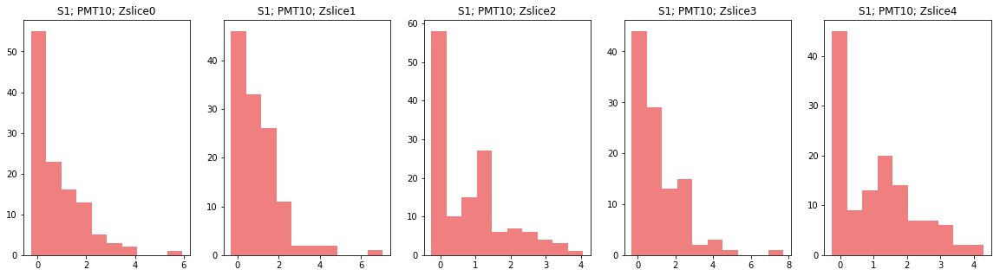

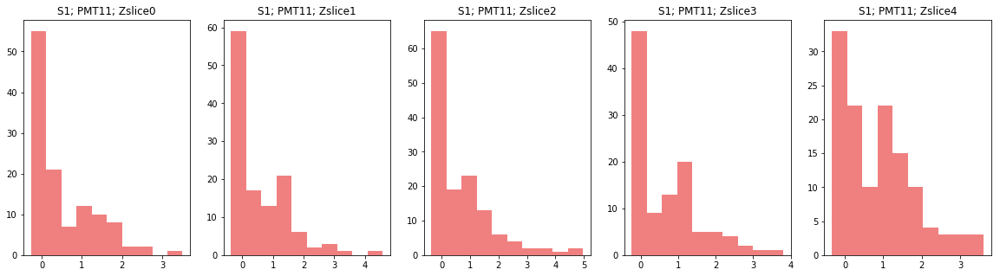

calculating mc...


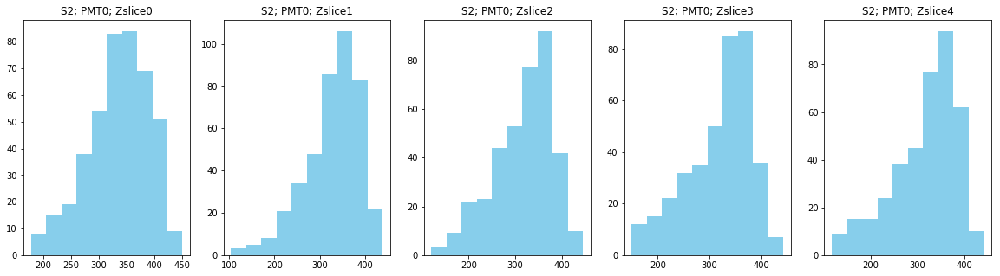

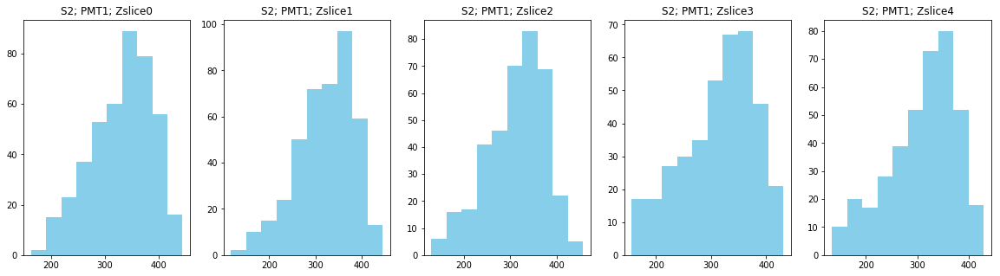

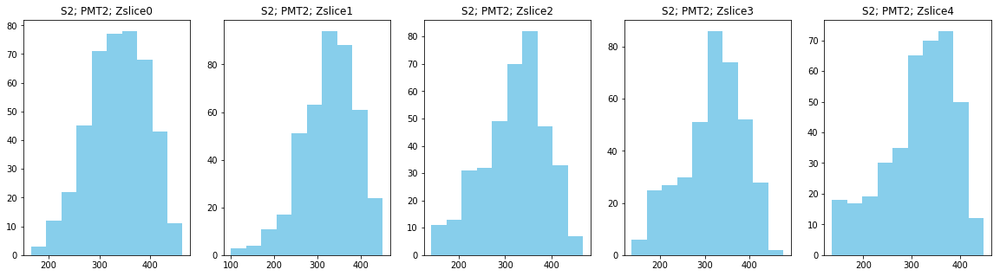

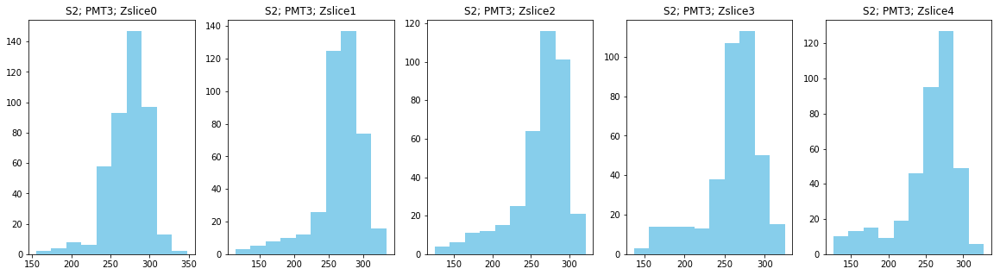

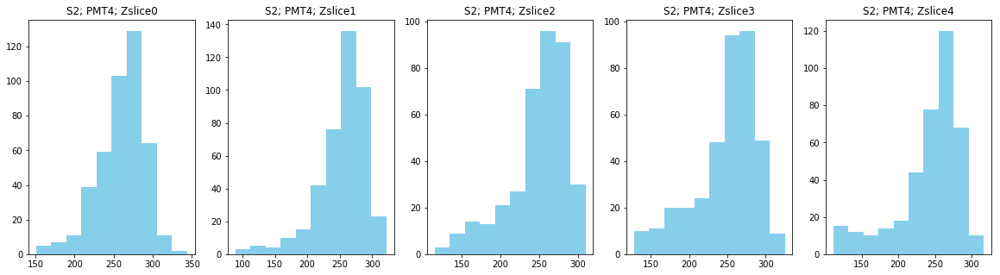

...

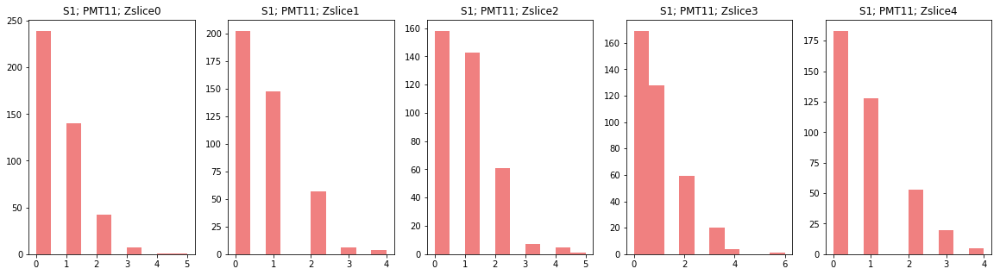

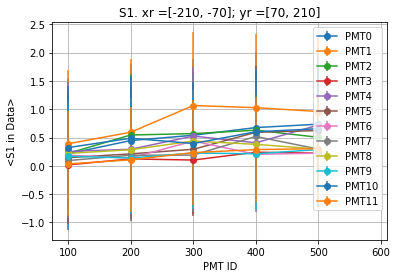

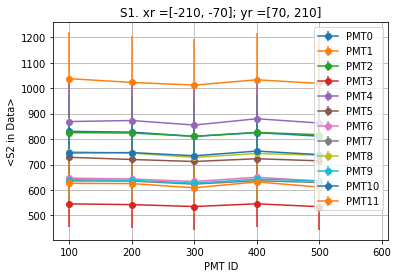

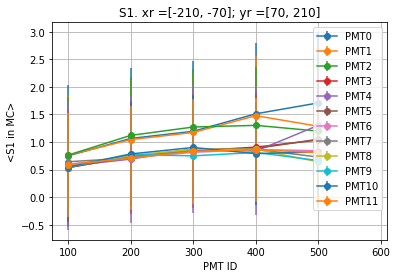

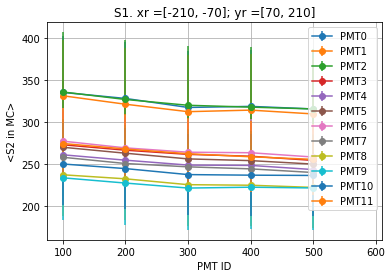

Dividing S2s
Dividing S1s


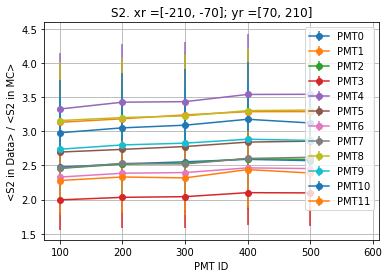

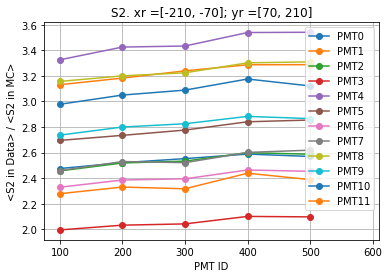

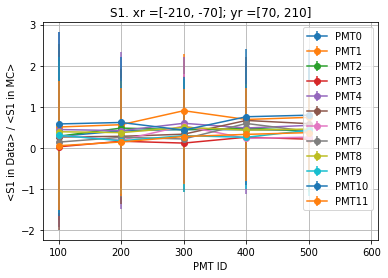

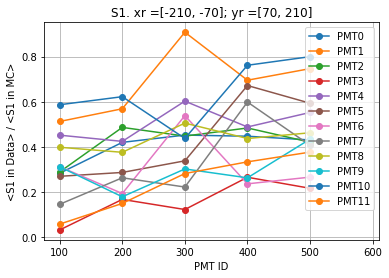

xr = [-70, 70] ; yr = [-210, -70]
calculating data...


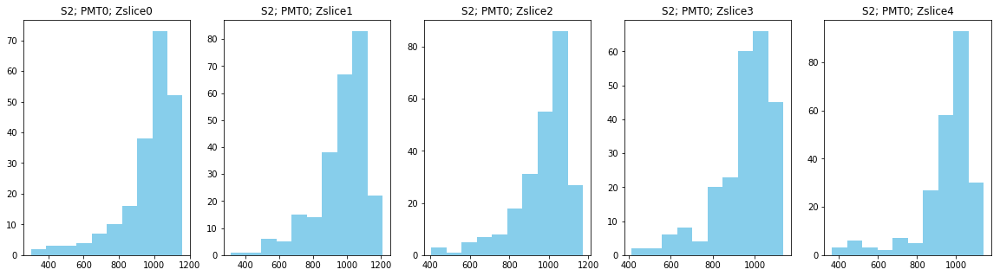

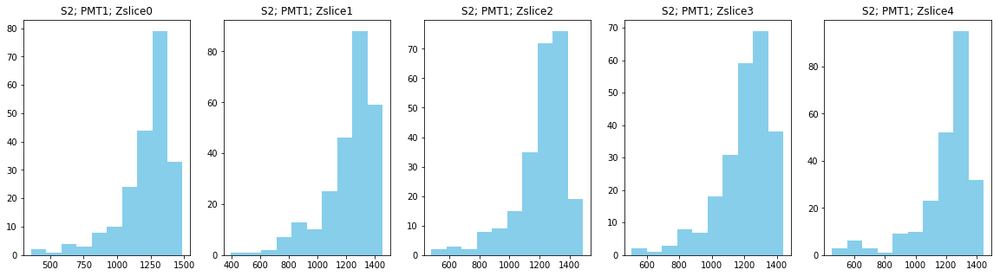

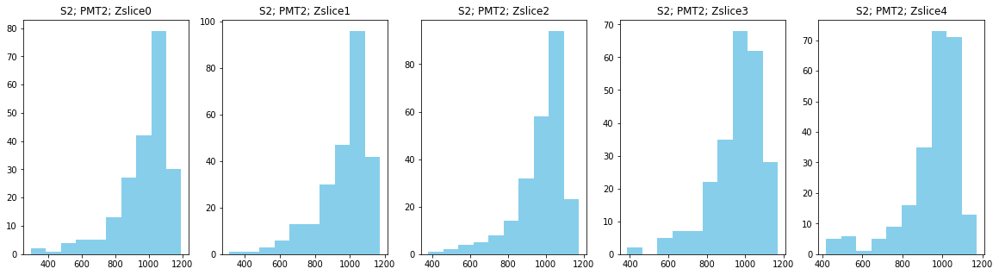

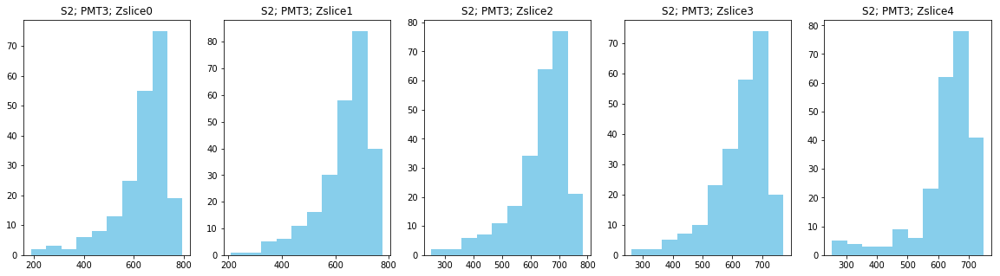

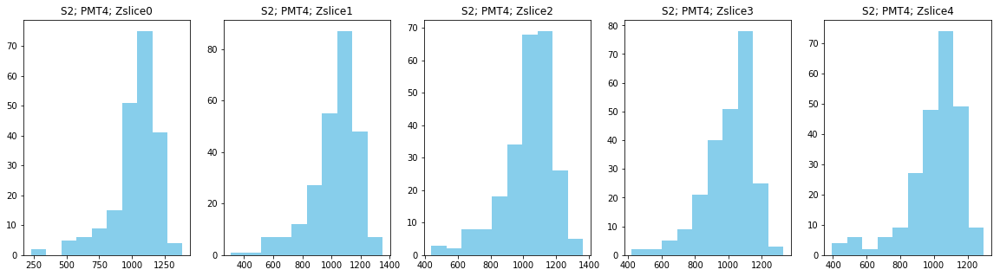

...

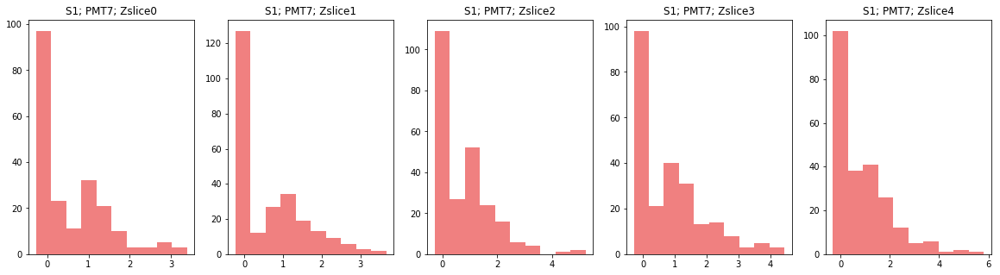

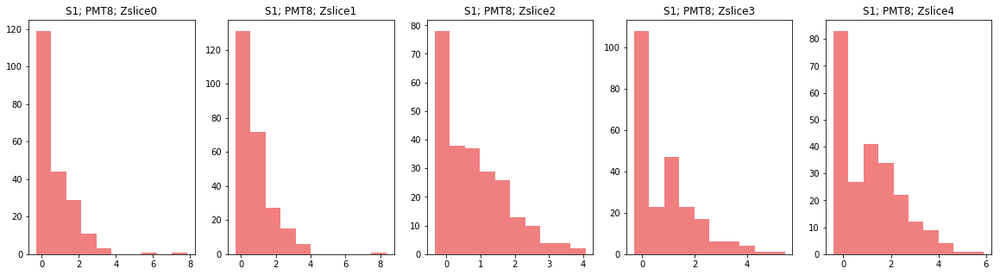

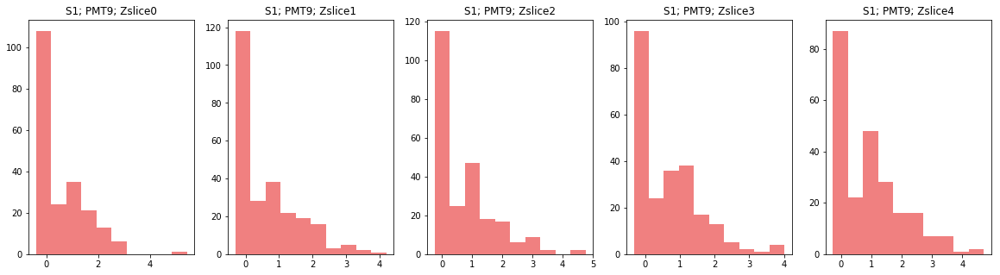

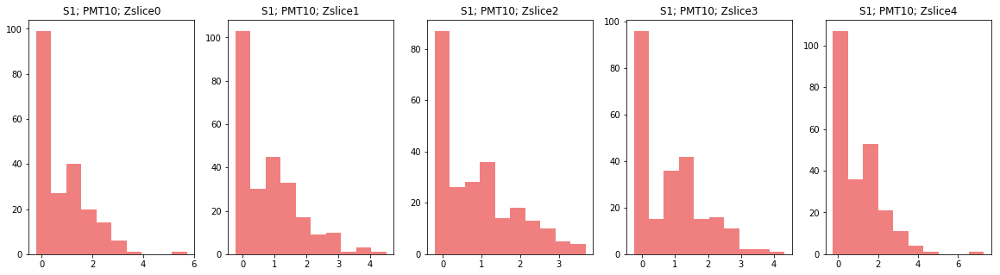

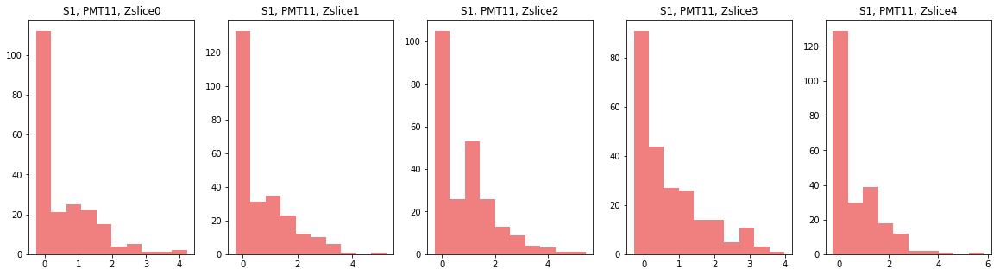

calculating mc...


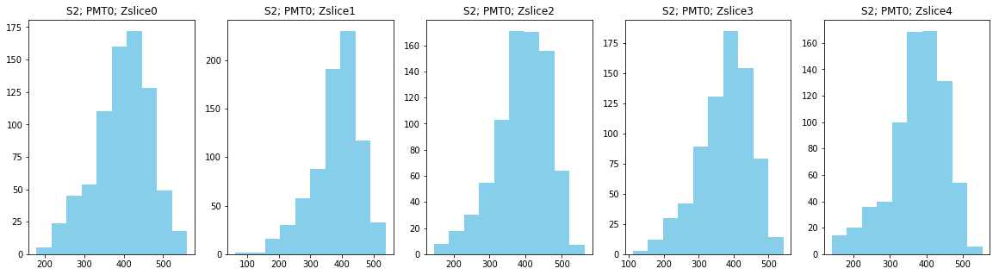

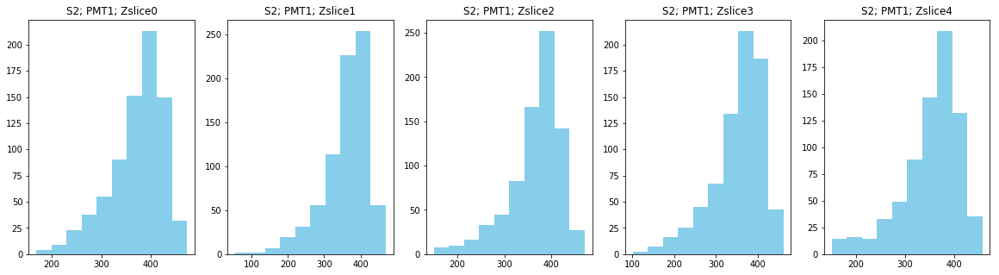

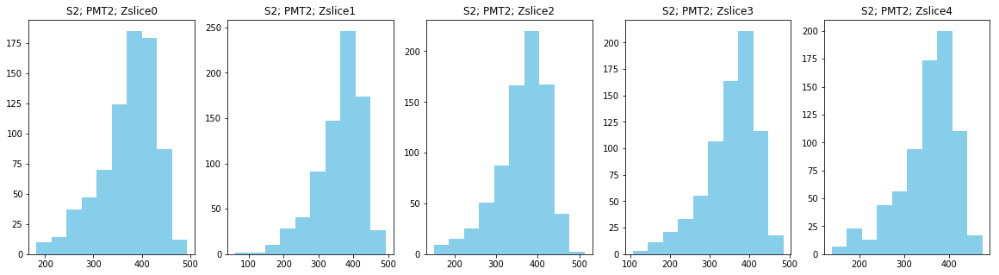

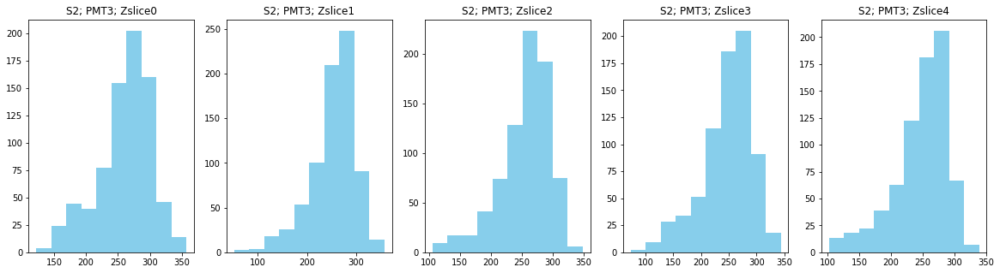

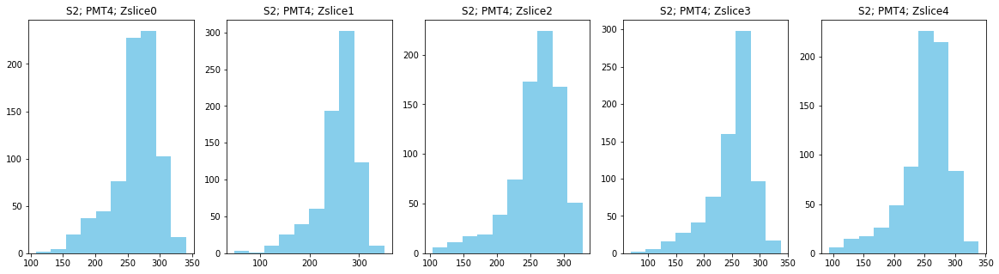

...

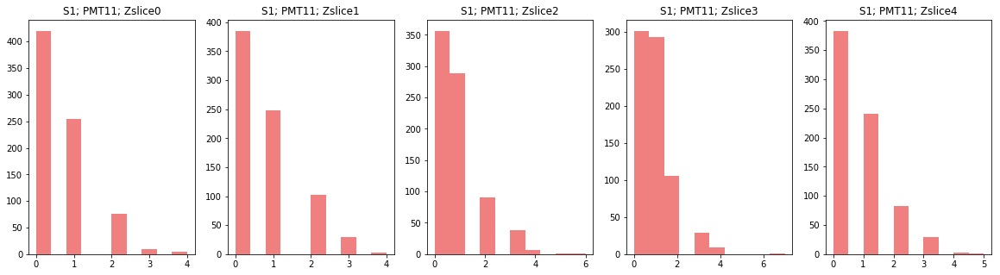

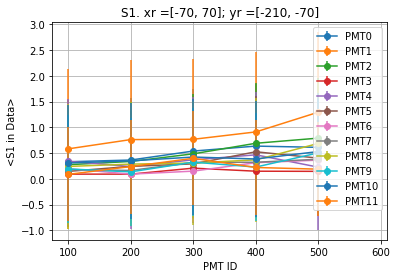

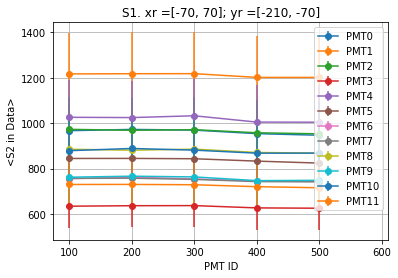

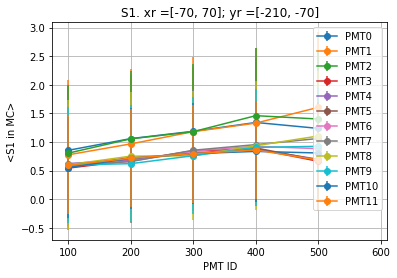

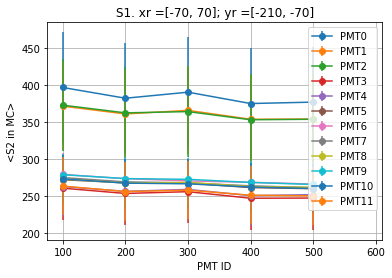

Dividing S2s
Dividing S1s


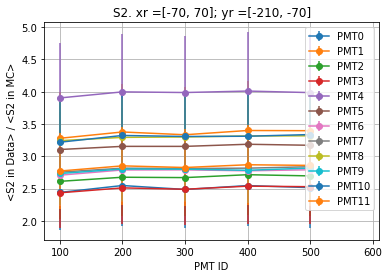

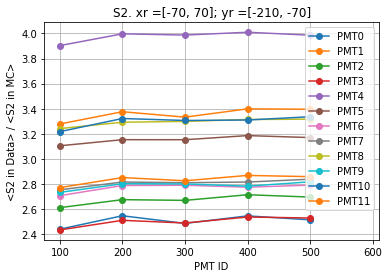

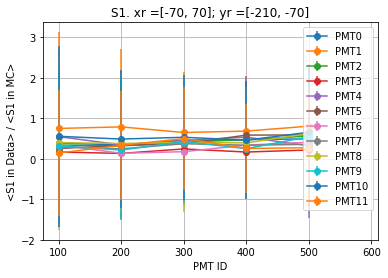

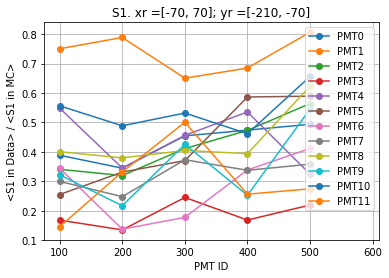

xr = [-70, 70] ; yr = [-70, 70]
calculating data...


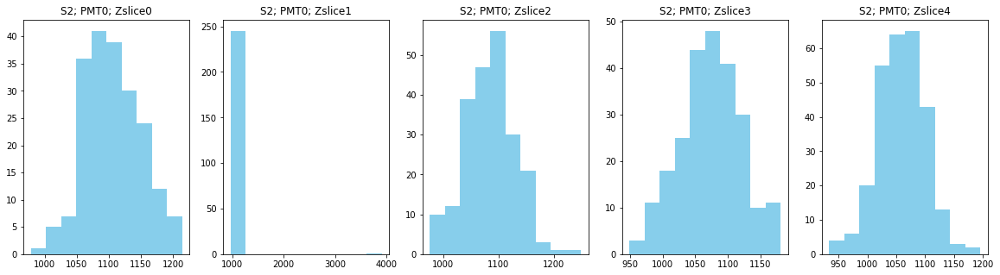

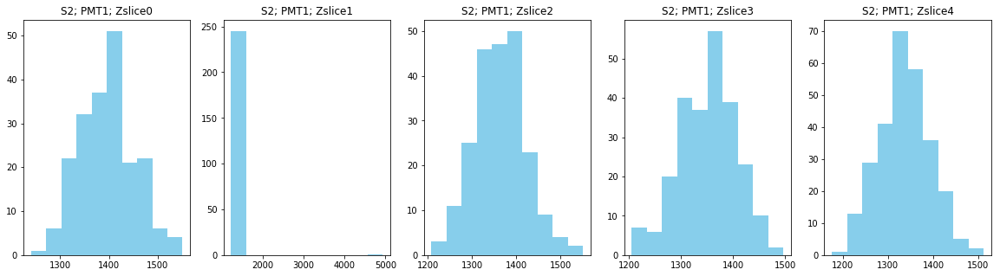

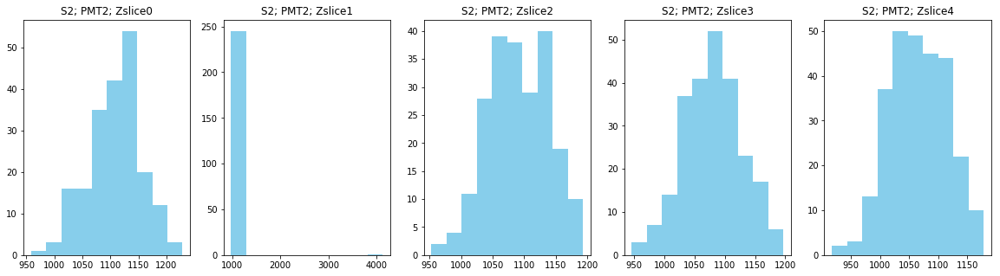

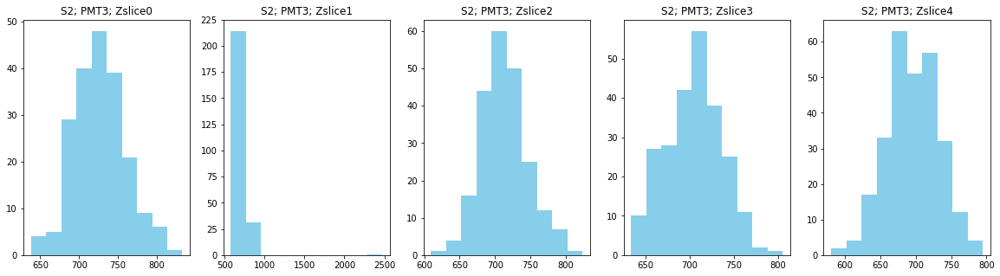

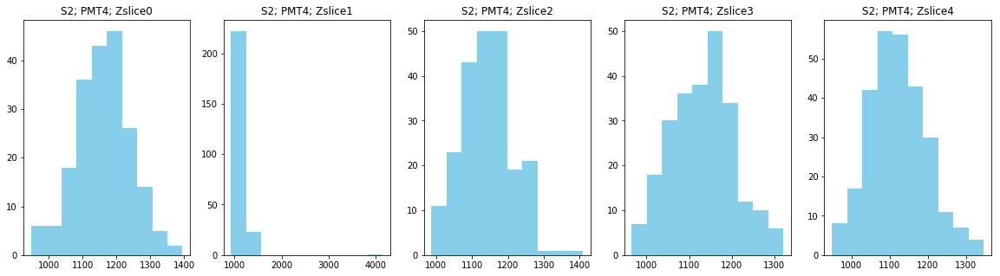

...

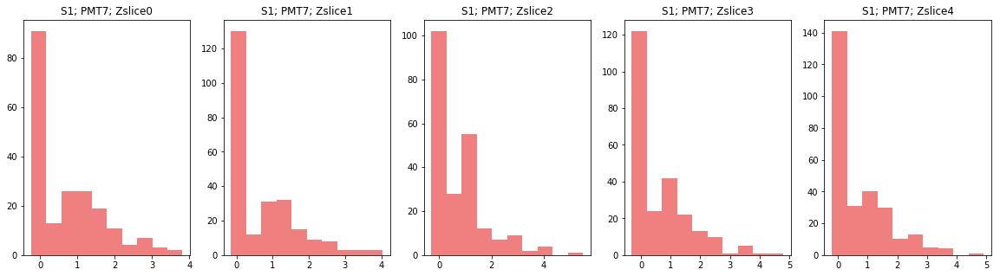

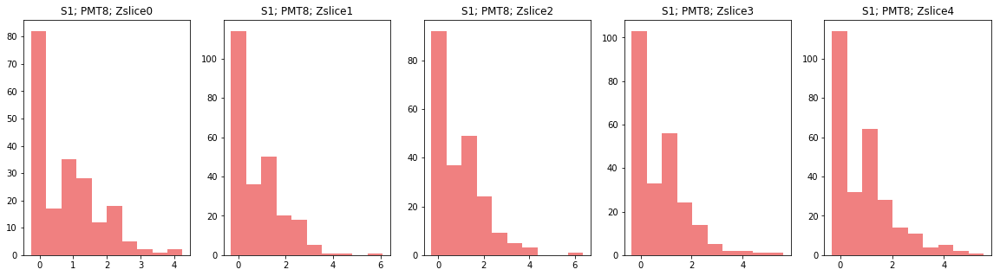

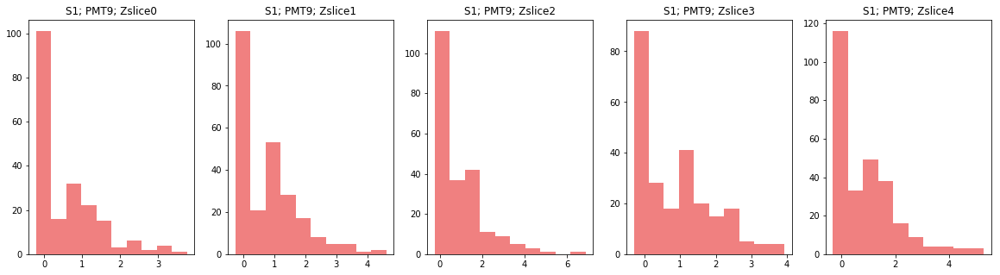

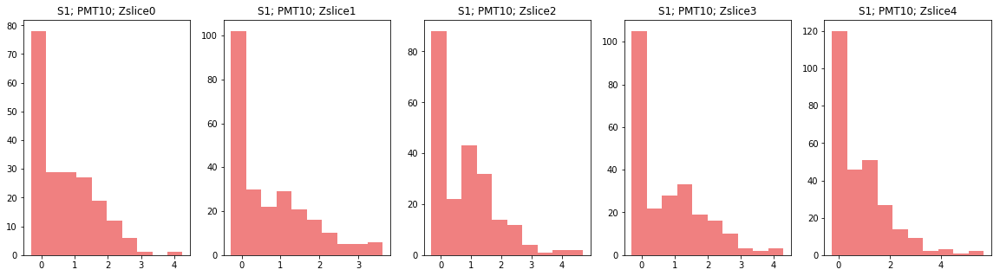

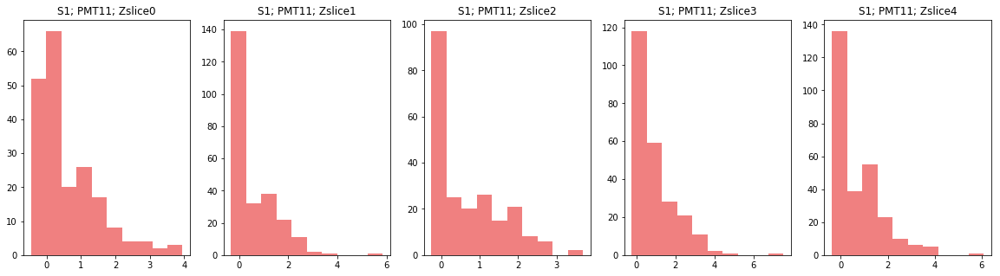

calculating mc...


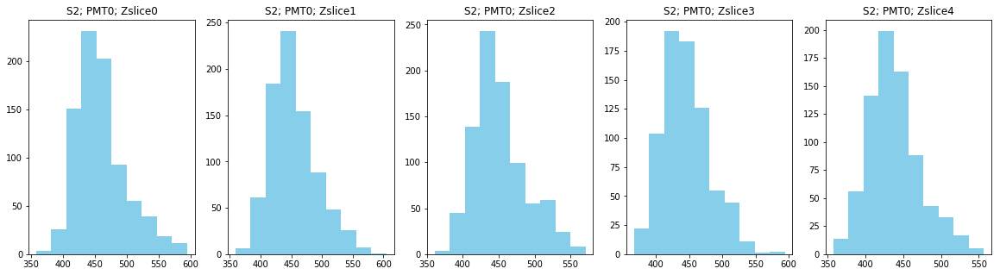

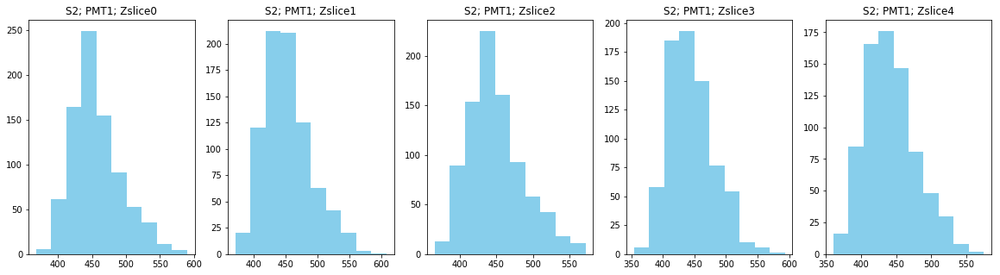

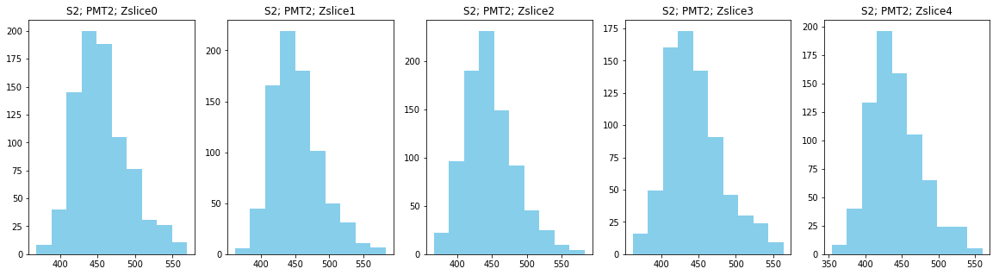

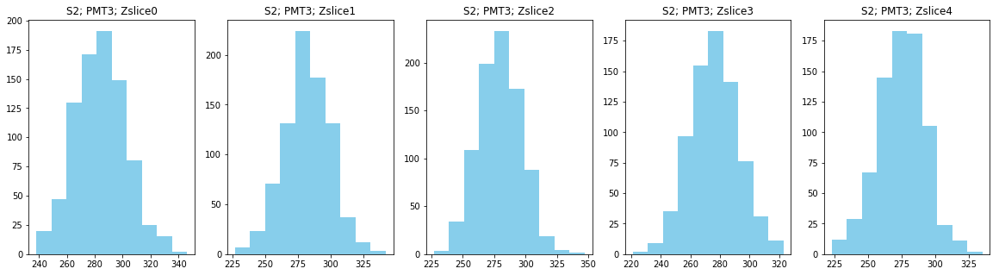

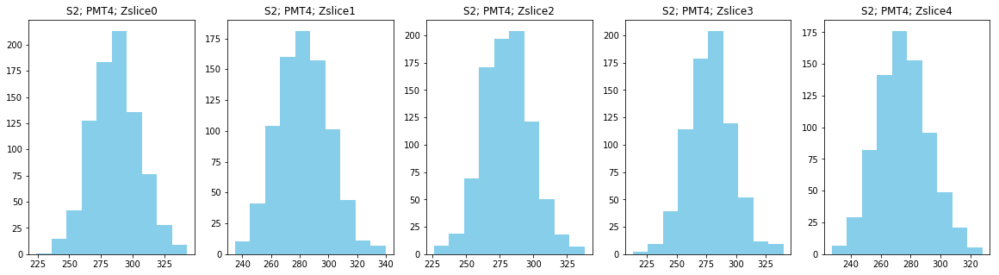

...

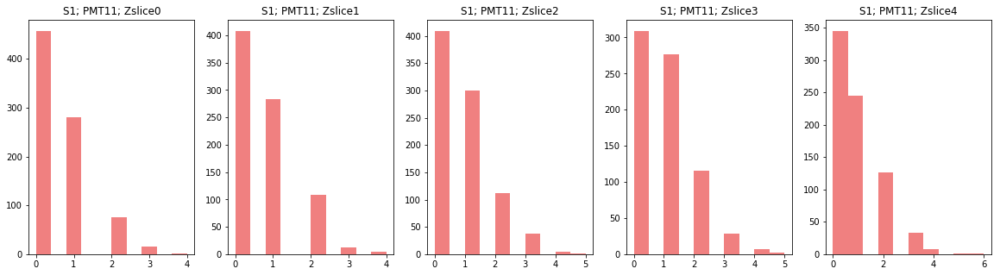

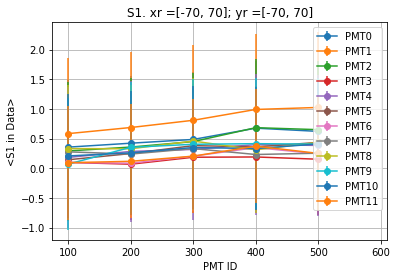

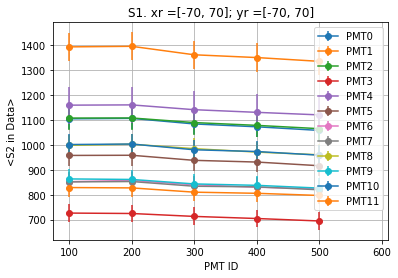

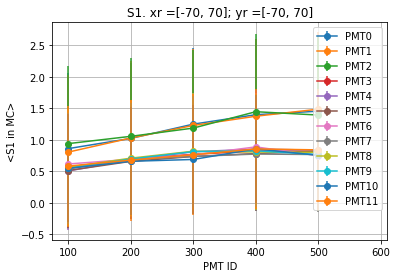

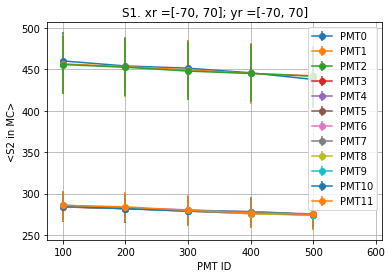

Dividing S2s
Dividing S1s


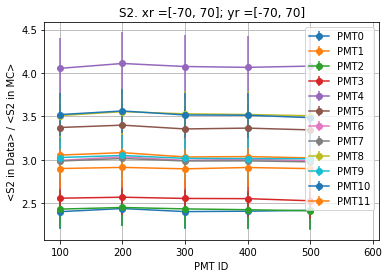

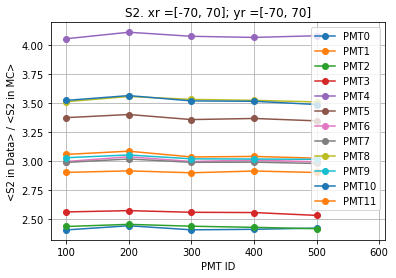

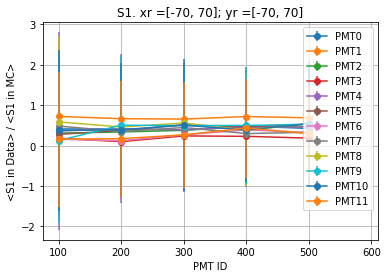

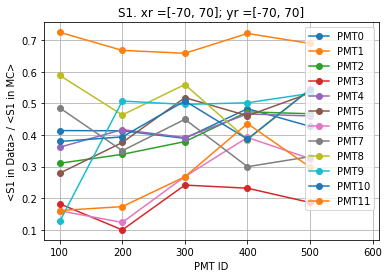

xr = [-70, 70] ; yr = [70, 210]
calculating data...


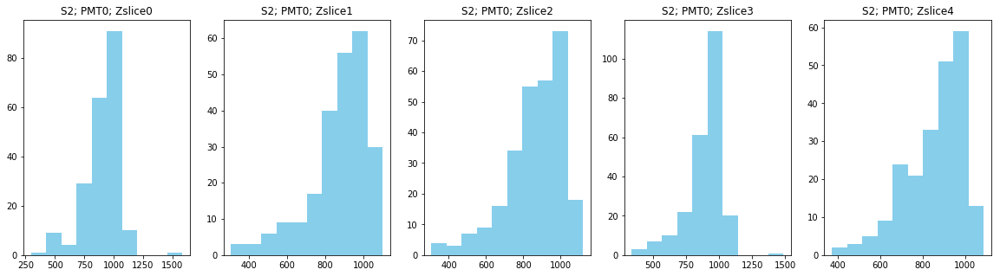

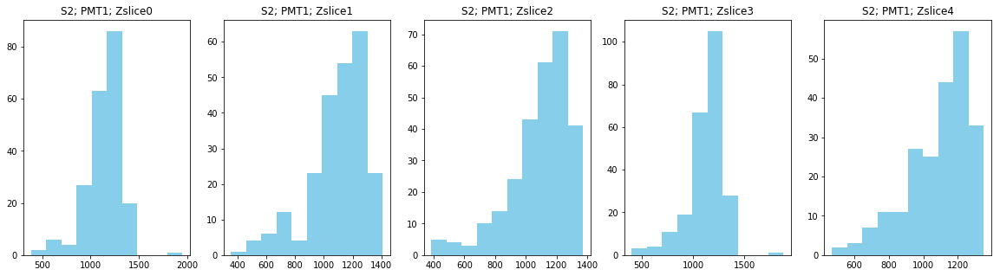

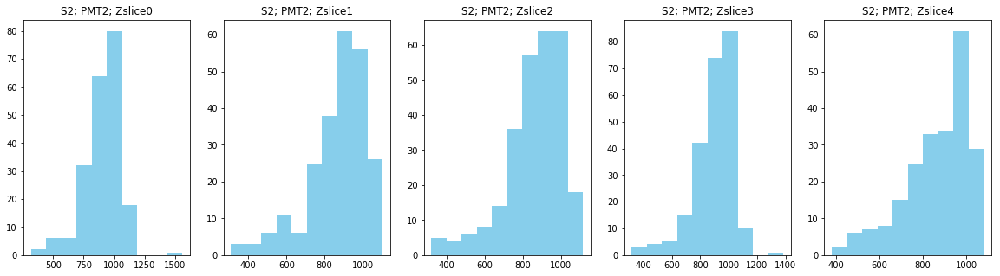

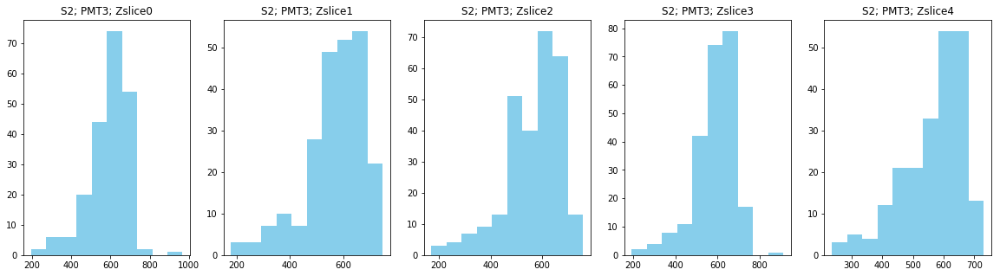

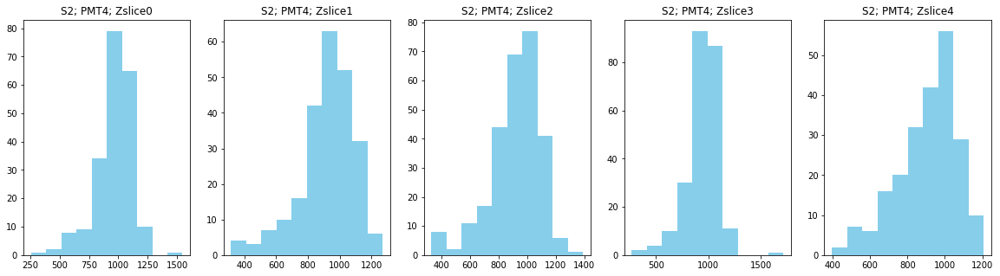

...

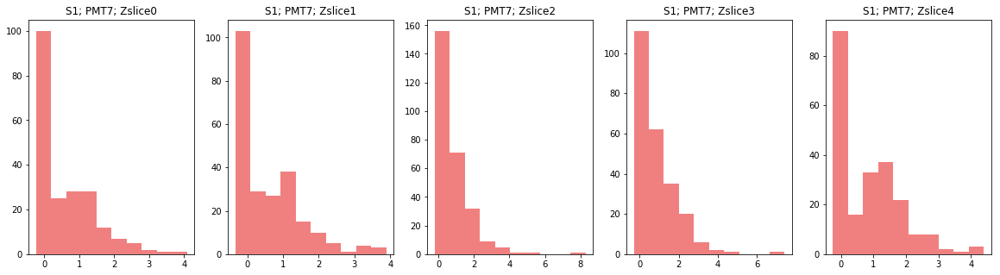

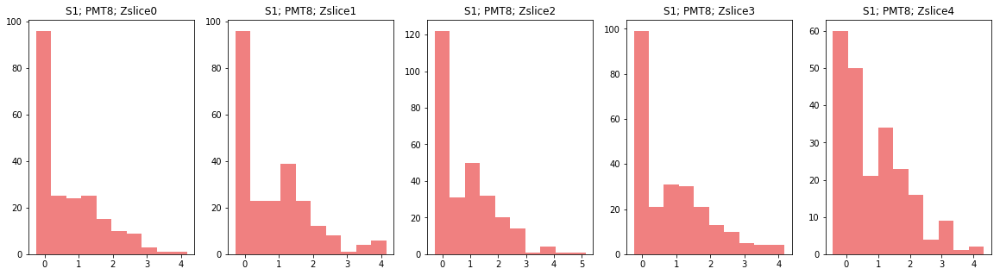

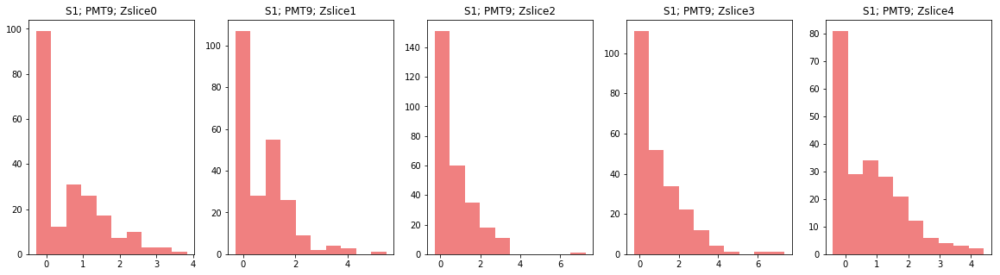

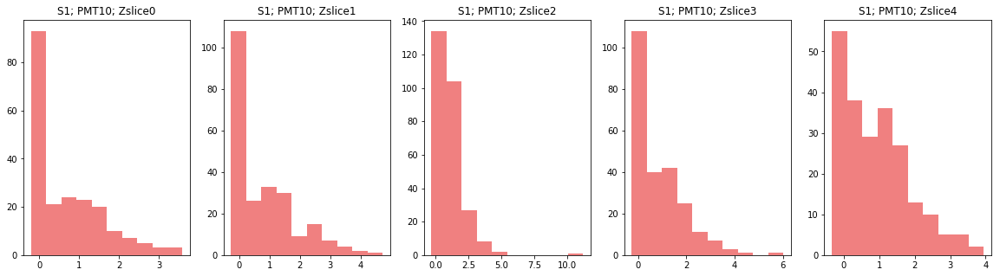

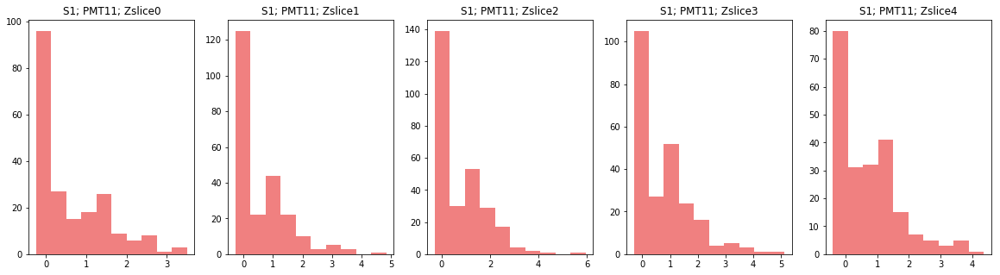

calculating mc...


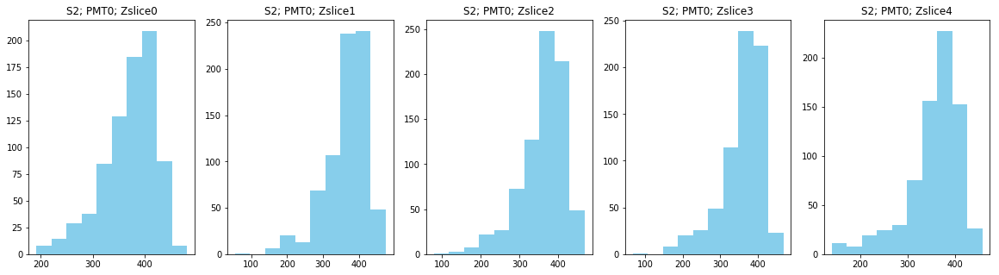

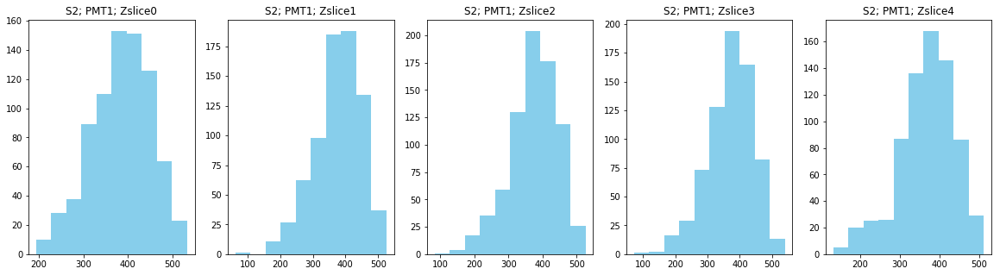

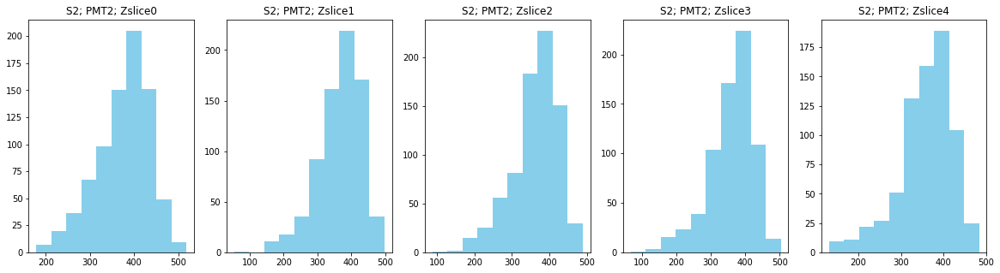

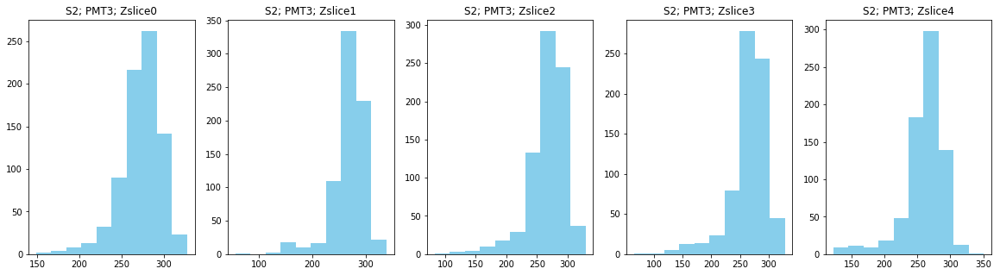

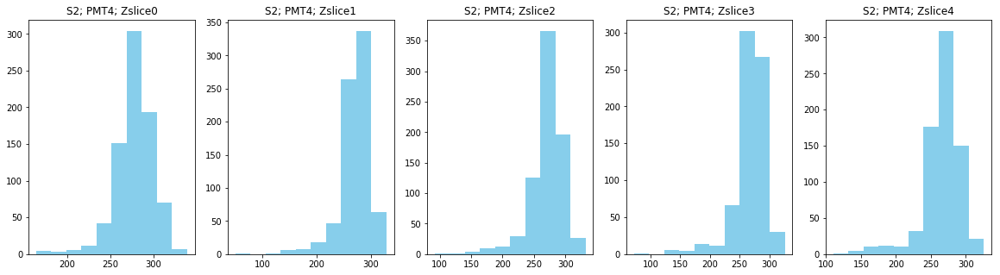

...

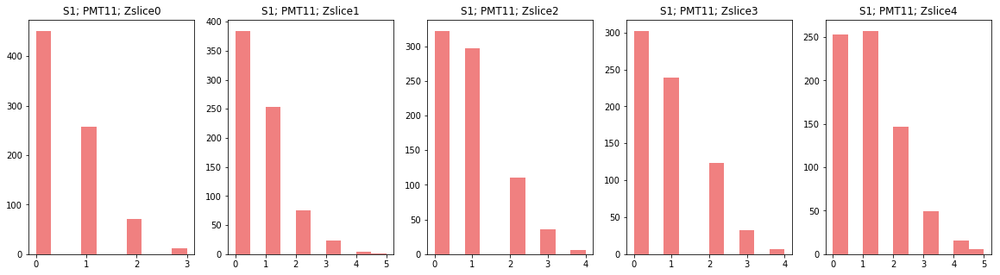

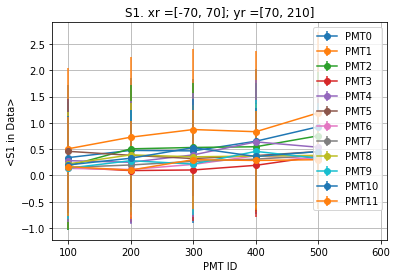

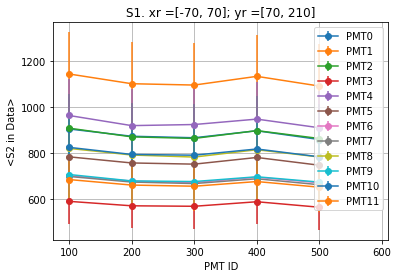

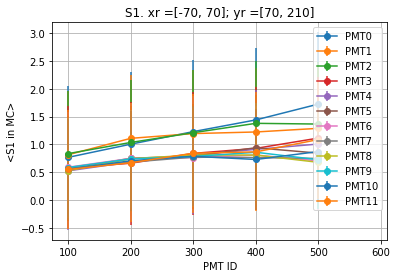

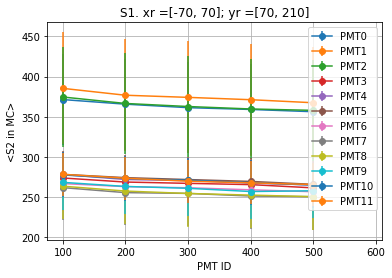

Dividing S2s
Dividing S1s


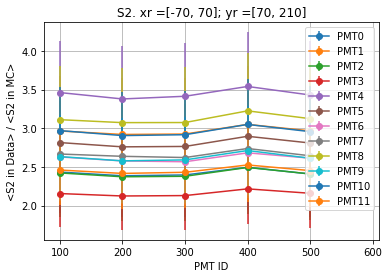

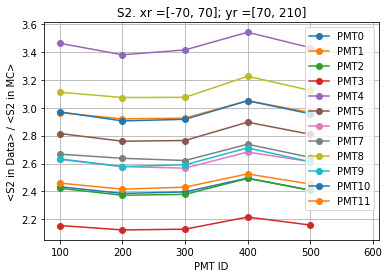

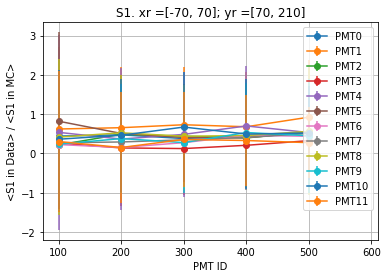

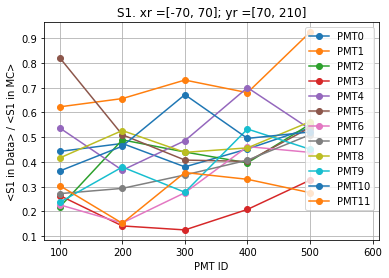

xr = [70, 210] ; yr = [-210, -70]
calculating data...


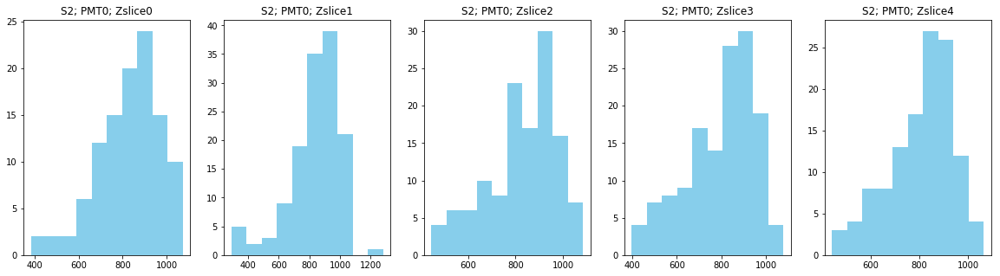

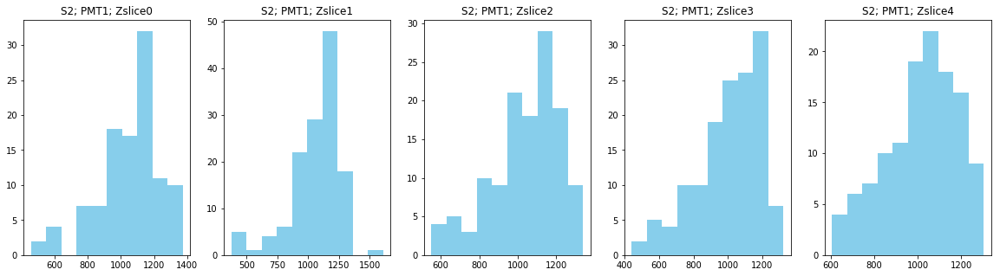

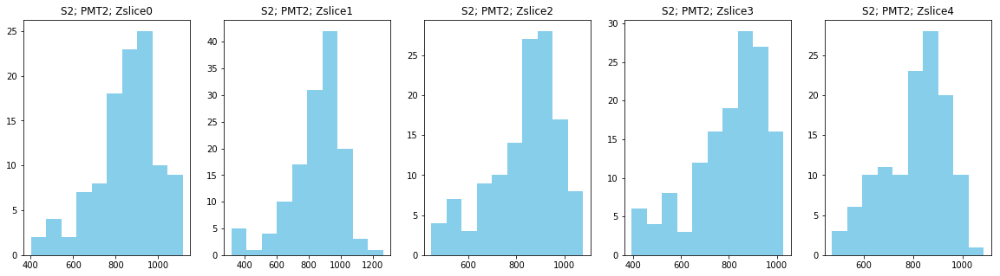

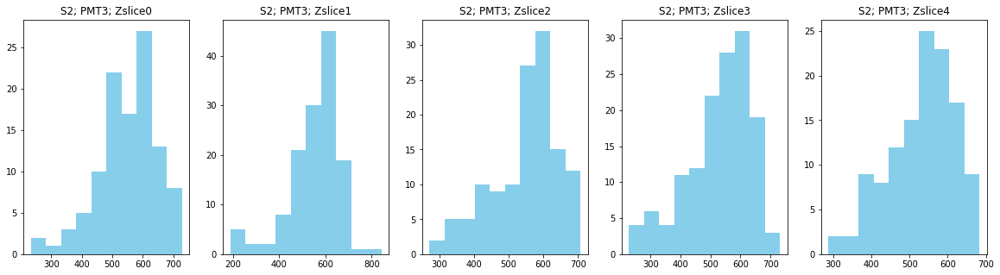

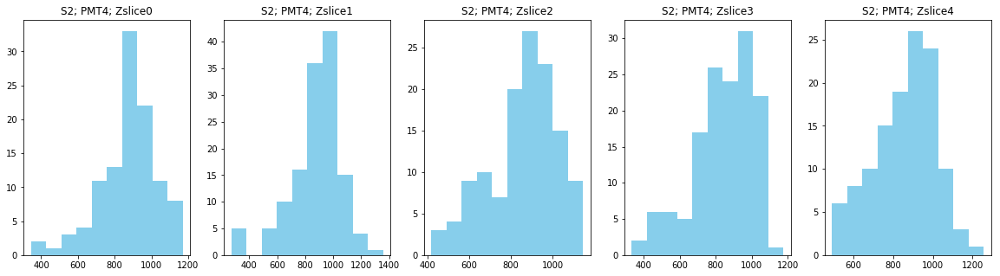

...

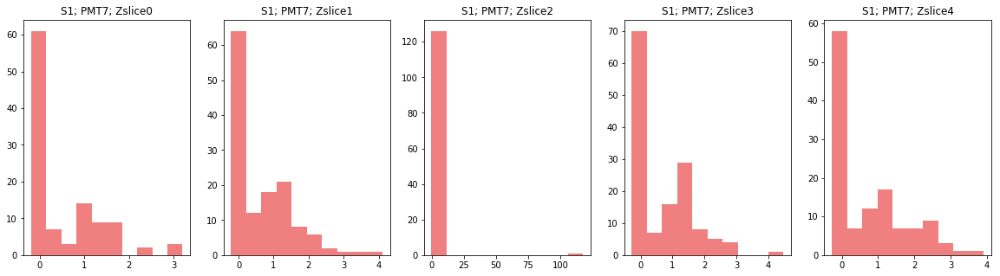

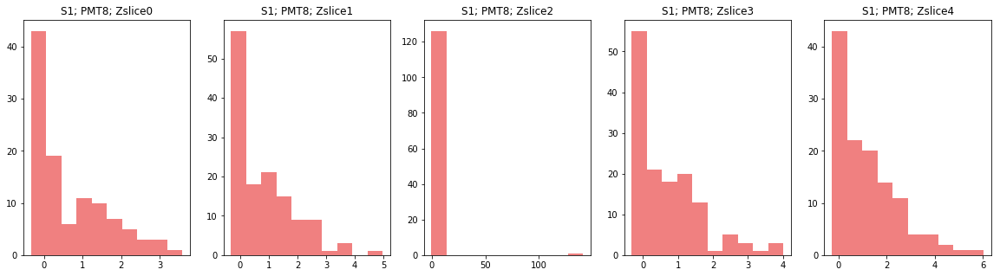

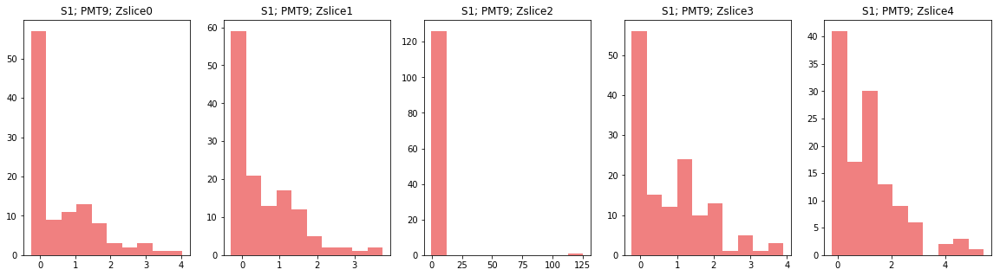

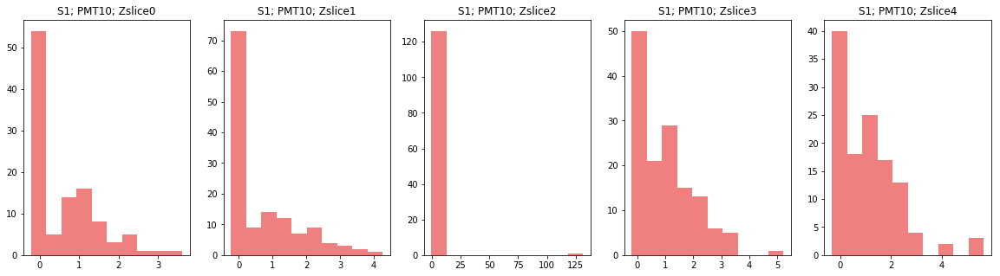

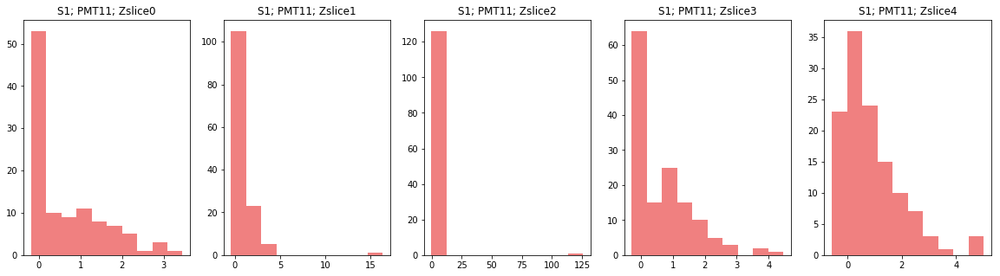

calculating mc...


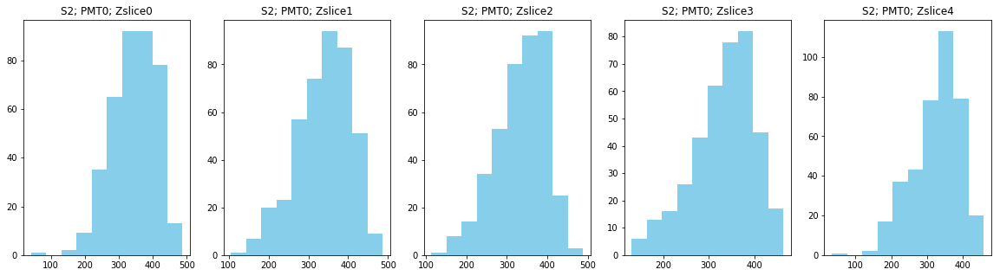

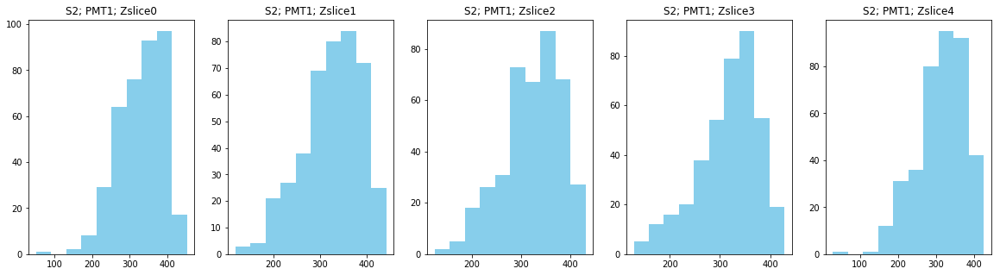

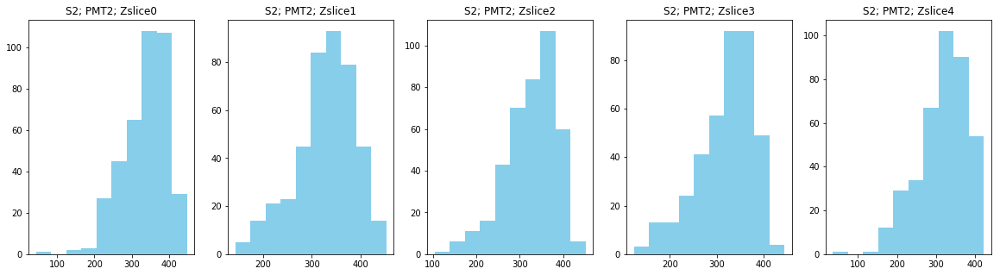

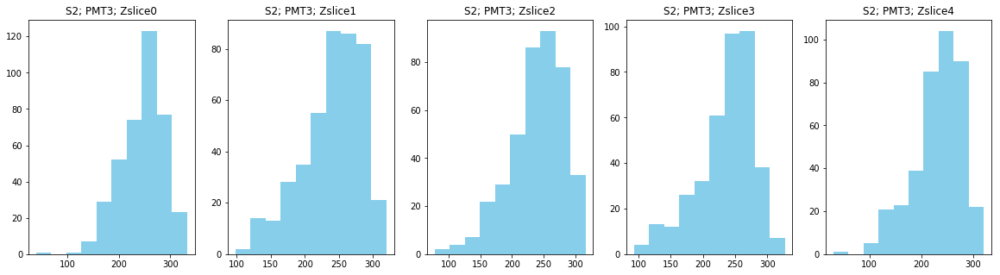

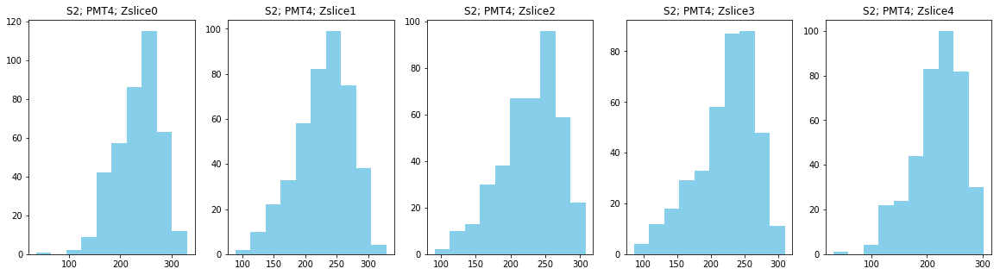

...

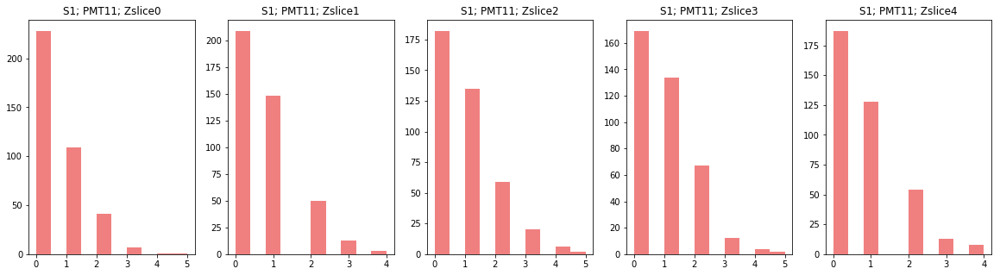

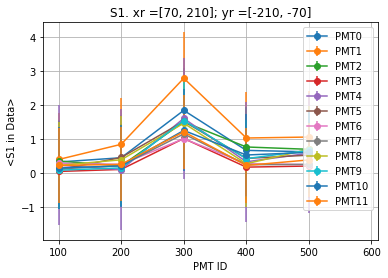

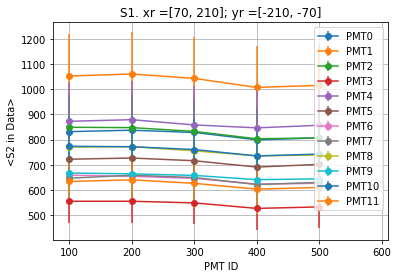

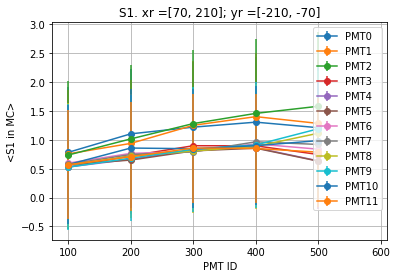

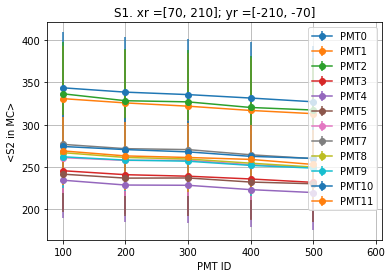

Dividing S2s
Dividing S1s


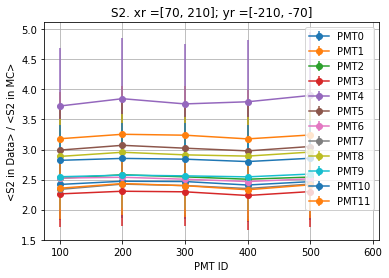

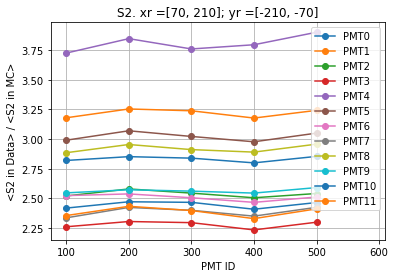

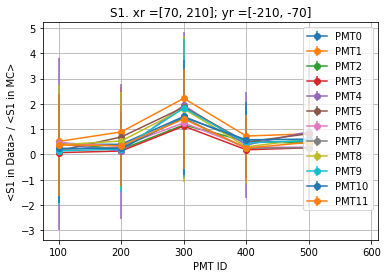

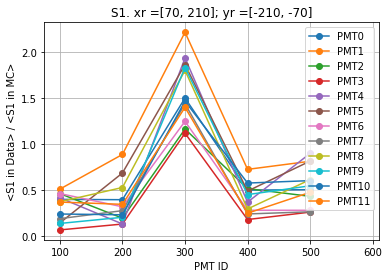

xr = [70, 210] ; yr = [-70, 70]
calculating data...


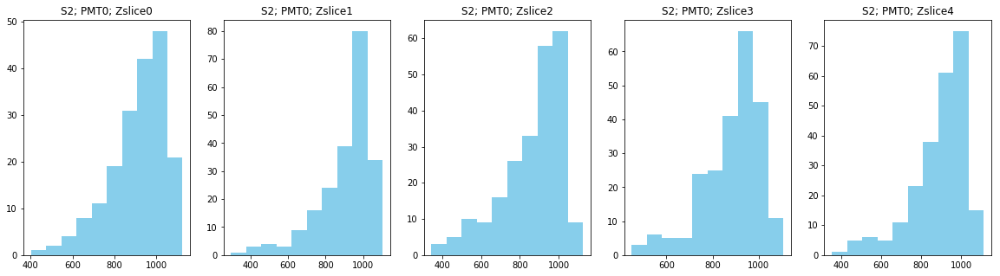

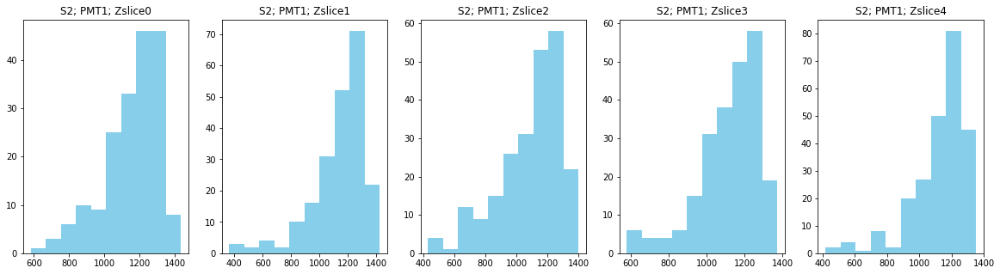

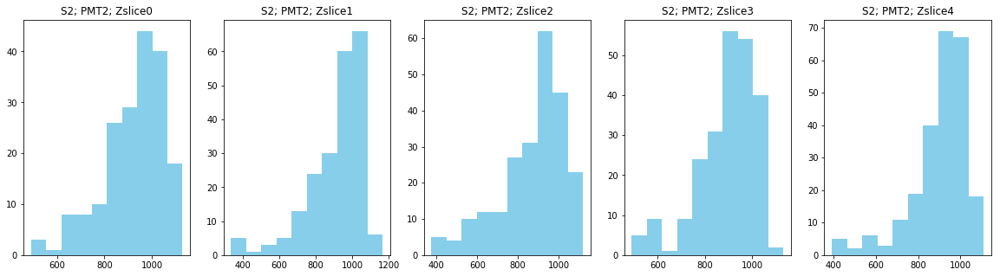

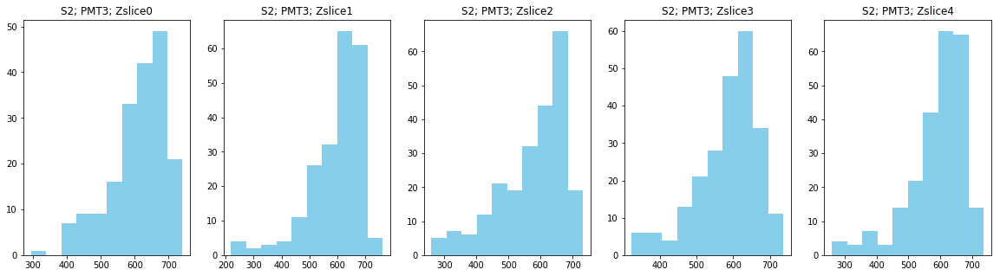

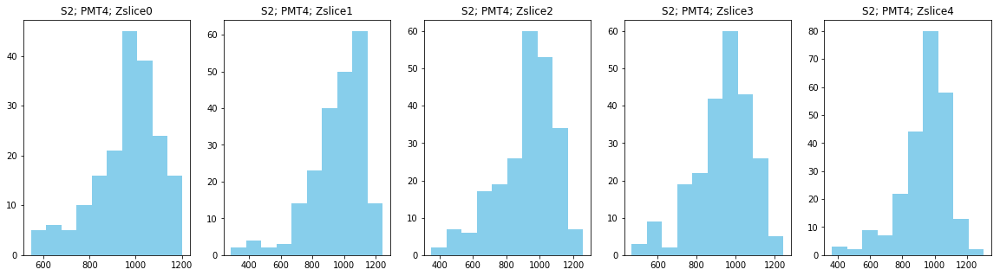

...

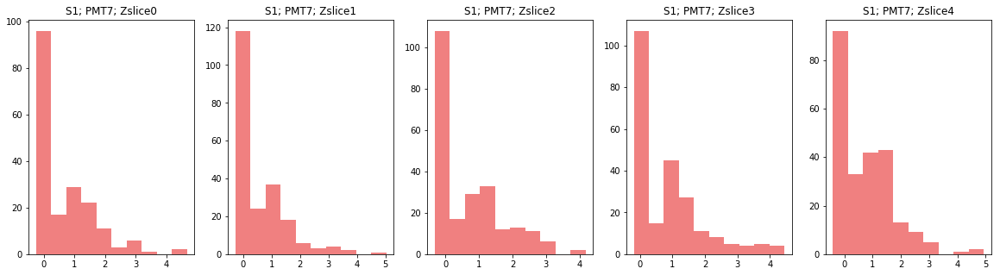

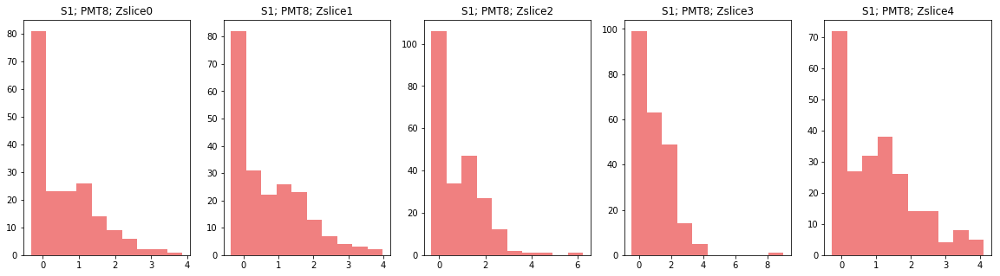

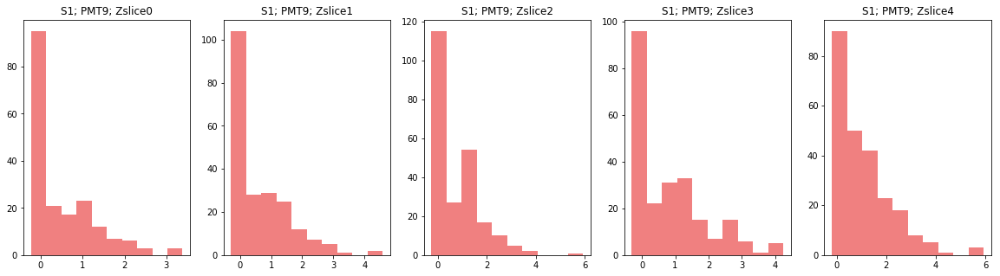

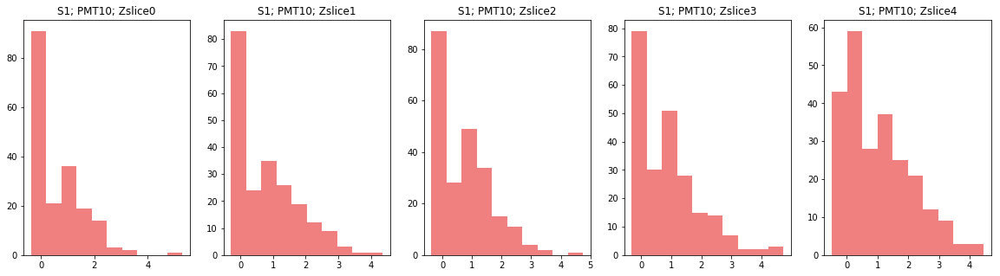

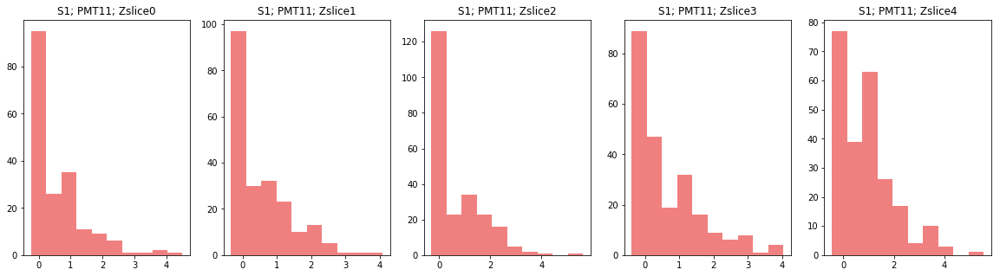

calculating mc...


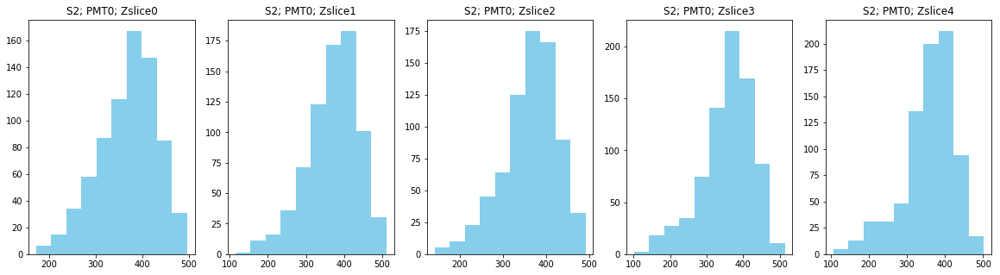

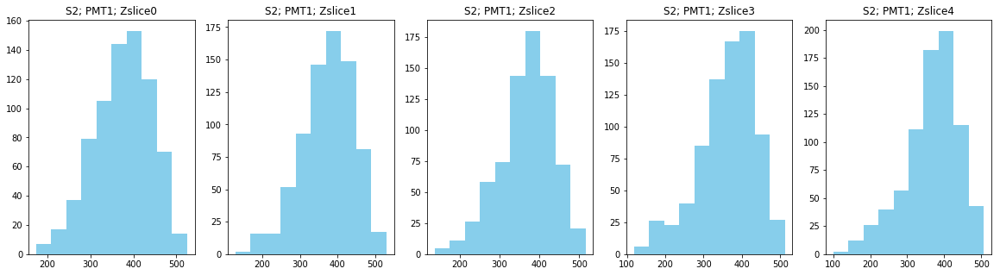

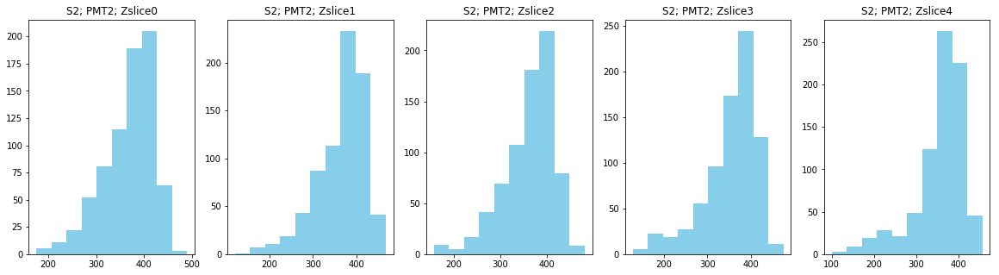

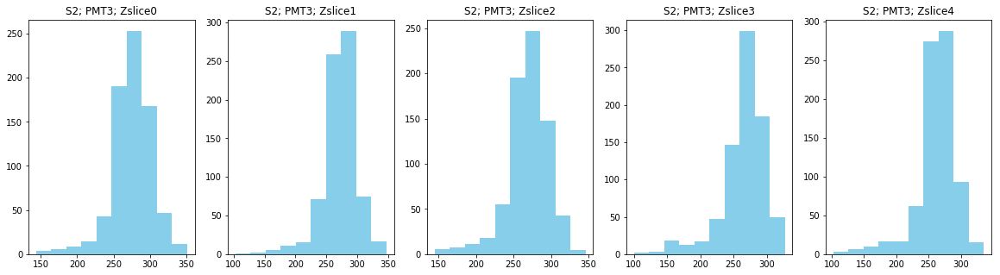

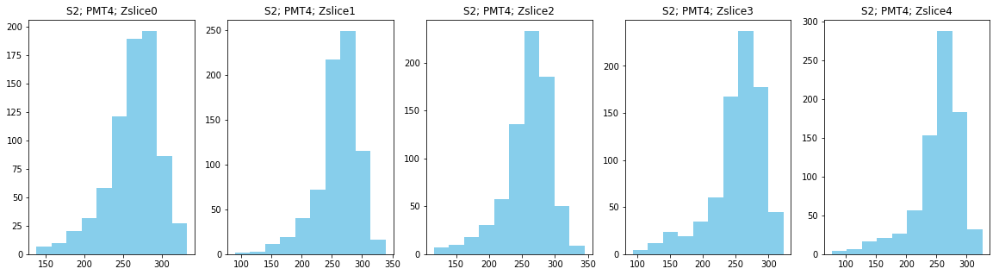

...

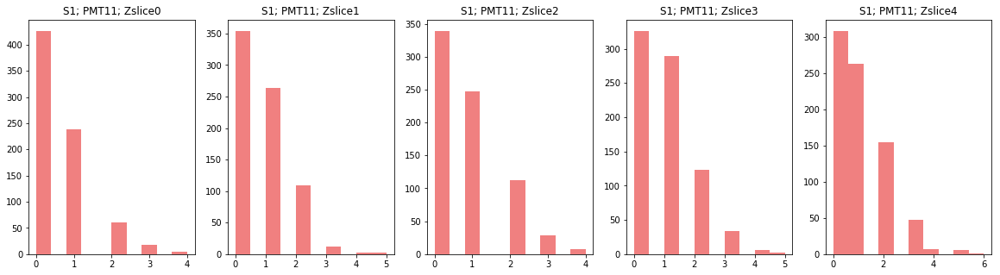

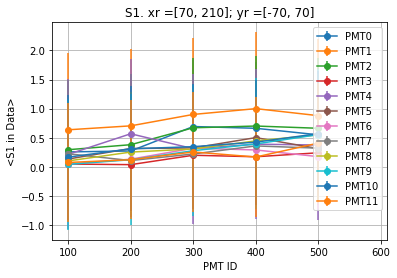

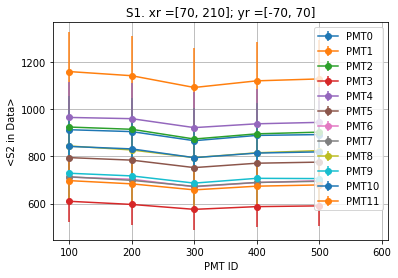

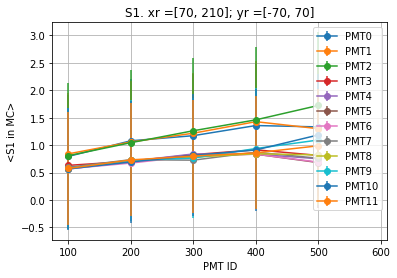

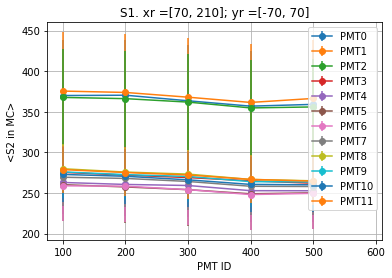

Dividing S2s
Dividing S1s


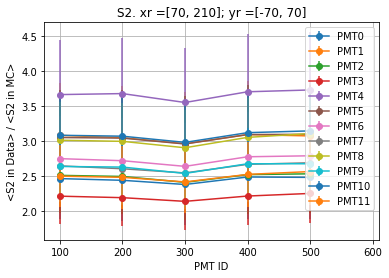

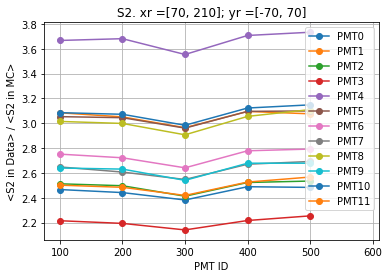

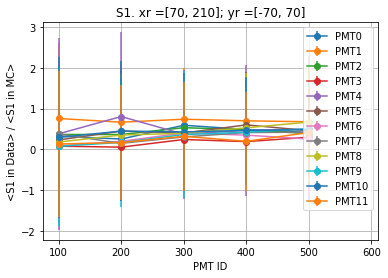

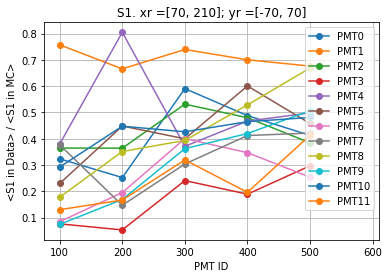

xr = [70, 210] ; yr = [70, 210]
calculating data...


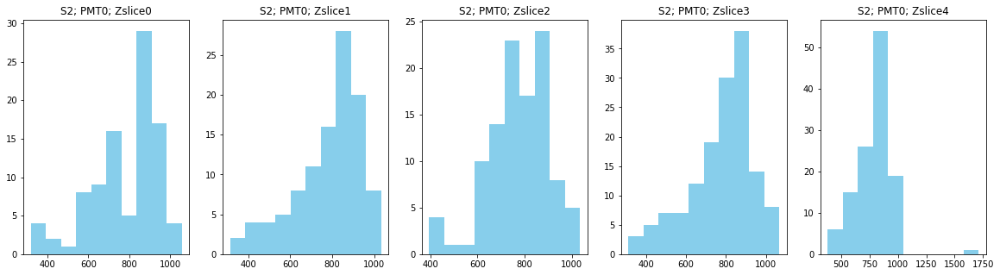

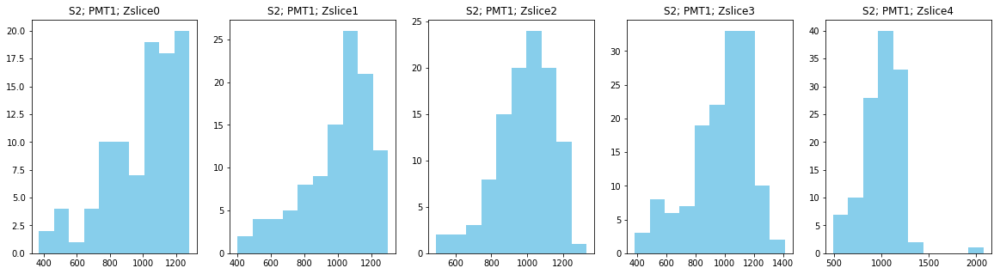

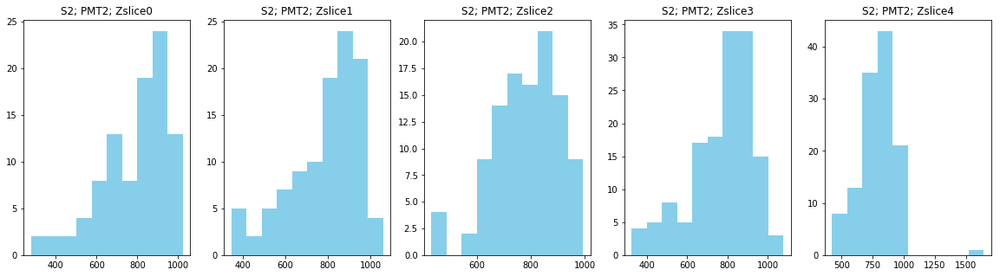

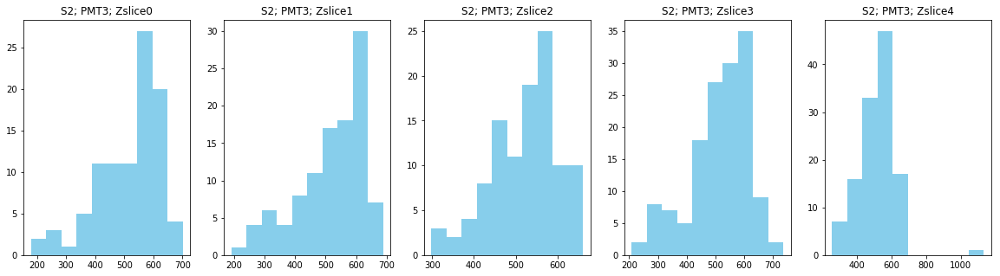

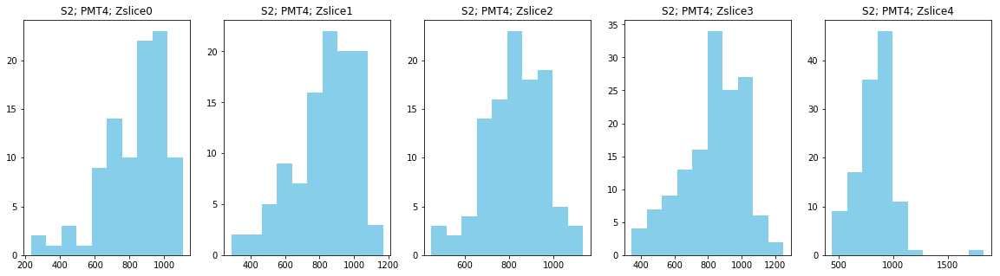

...

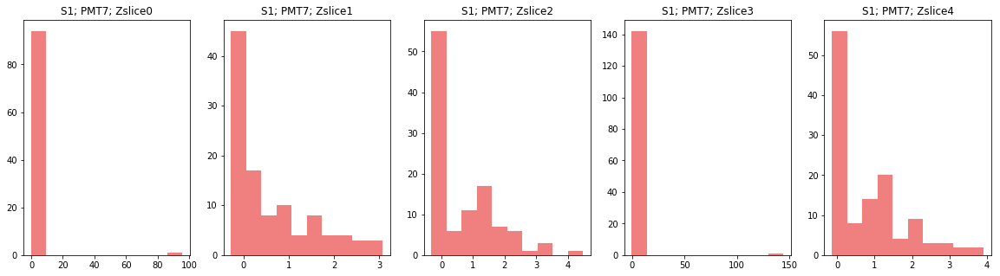

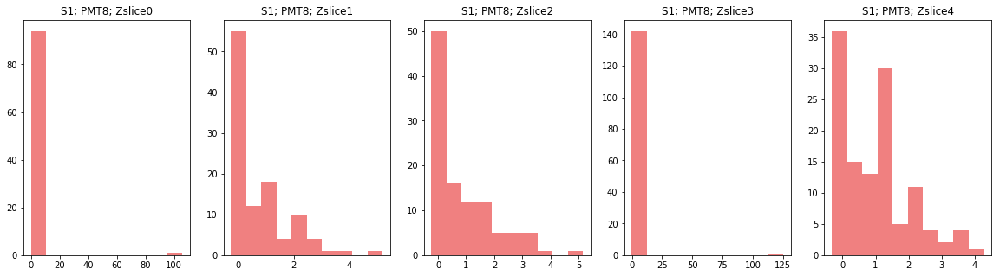

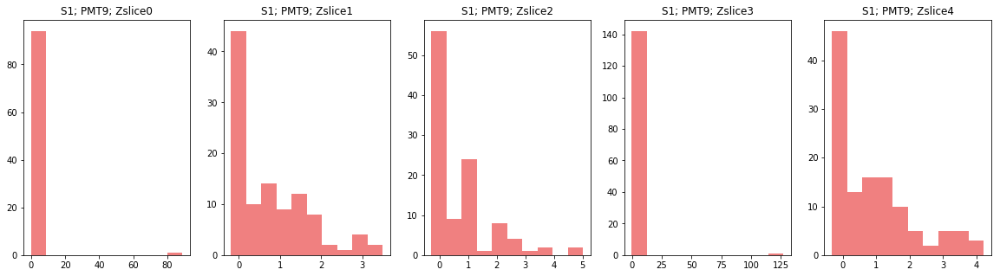

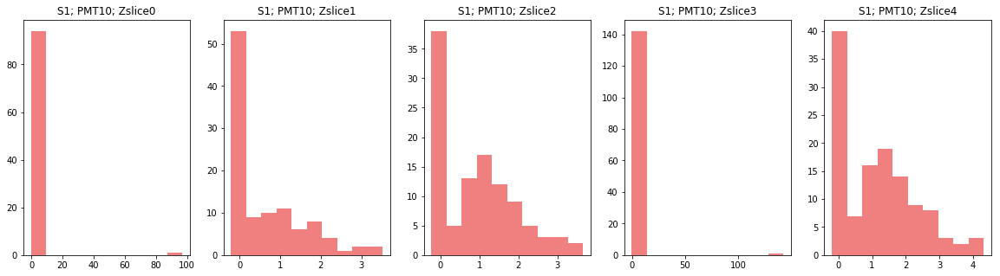

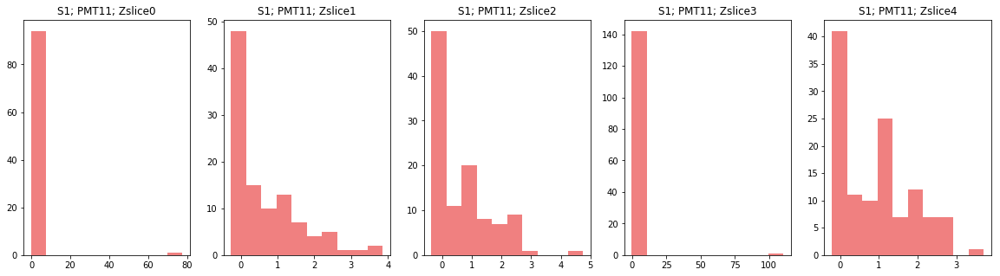

calculating mc...


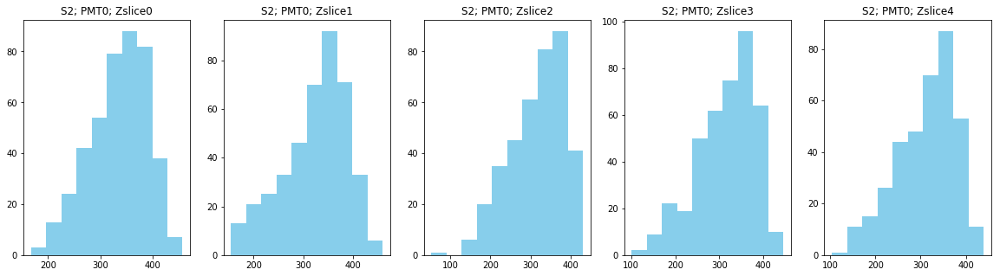

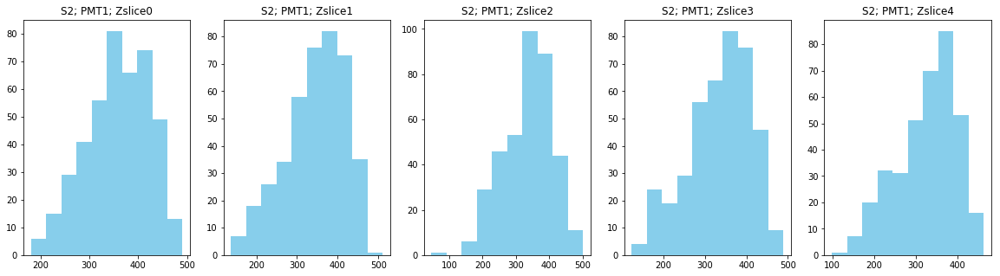

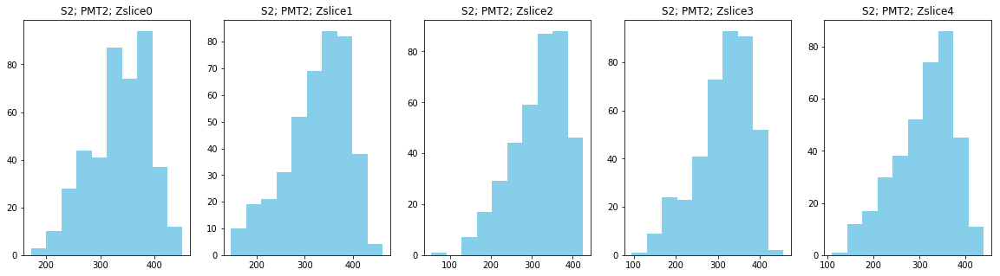

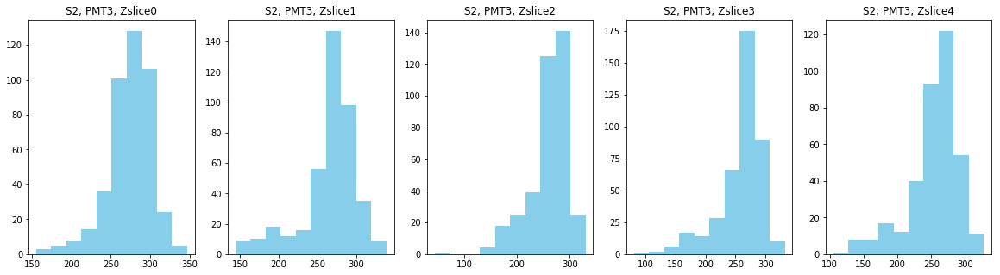

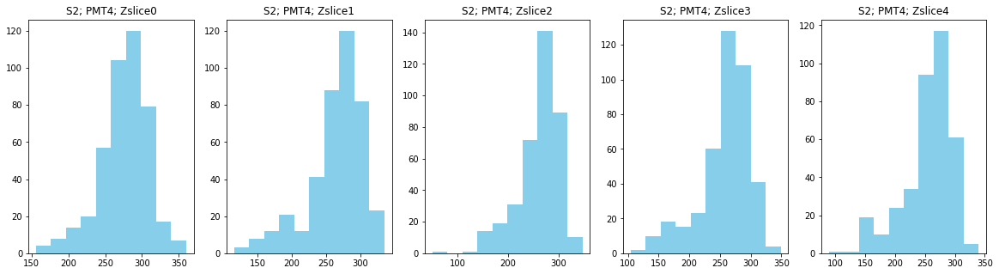

...

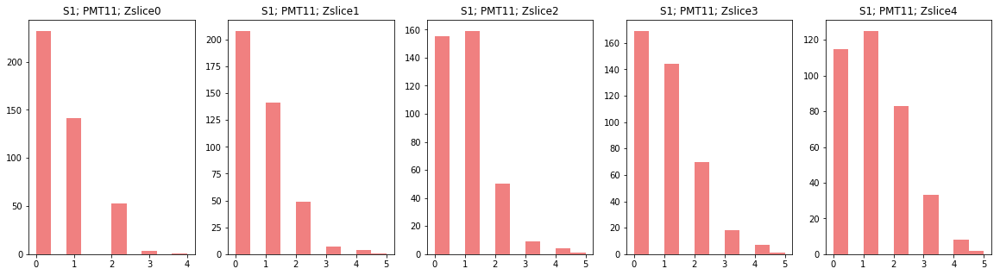

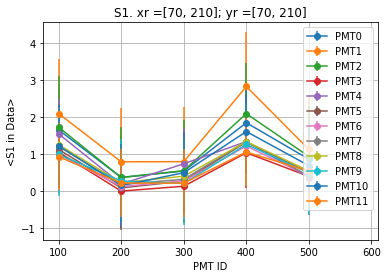

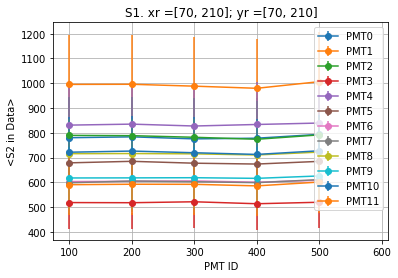

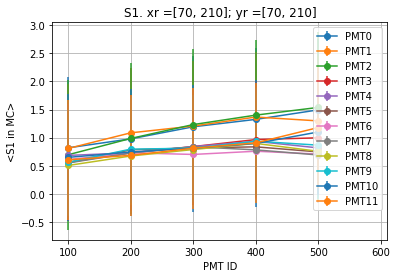

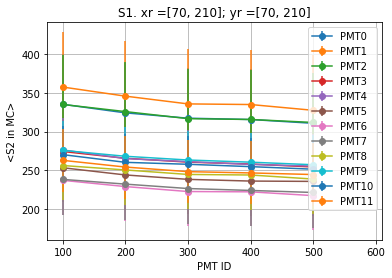

Dividing S2s
Dividing S1s


/Users/jmhaefner/miniconda/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.
/Users/jmhaefner/miniconda/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in multiply
  after removing the cwd from sys.path.


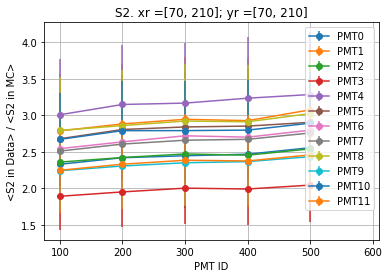

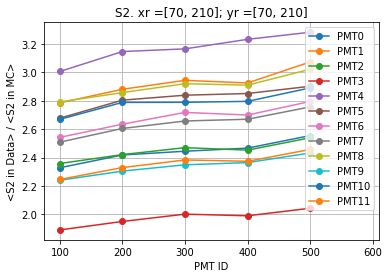

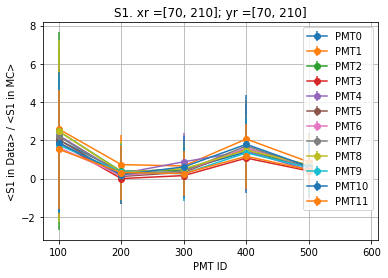

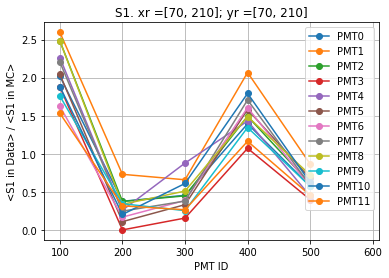

In [48]:
#xedges = [-210, -70]
xedges = [-210, -70, 70, 210]
xranges = [[xedges[i], xedges[i+1]] for i in range(len(xedges)-1)]

#yedges = [-70, 70]
yedges = [-210, -70, 70, 210]
yranges = [[yedges[i], yedges[i+1]] for i in range(len(yedges)-1)]

zcuts = [2, 100, 200, 300, 400, 500]
zranges = [[zcuts[i], zcuts[i+1]] for i in range(len(zcuts)-1)]

for xr, yr in itertools.product(xranges, yranges):
    print('xr =', xr, '; yr =', yr)

    print('calculating data...')
    data_s1avgs_ZPMT, data_s2avgs_ZPMT, data_s1vars, data_s2vars = mean_signal_vsPMTZ(good_data_pmaps, xr, yr, zranges)
    print('calculating mc...')
    mc_s1avgs_ZPMT, mc_s2avgs_ZPMT, mc_s1vars, mc_s2vars = mean_signal_vsPMTZ(good_mc_pmaps, xr, yr, zranges)
    
    ### PLOTS BEFORE DIVISION ###
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], data_s1avgs_ZPMT[pid], yerr = np.array(data_s1vars[pid])**0.5, fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('PMT ID')
    plt.ylabel('<S1 in Data>')
    plt.xlim(75, 610)
    plt.title('S1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], data_s2avgs_ZPMT[pid], yerr = np.array(data_s2vars[pid])**0.5, fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('PMT ID')
    plt.ylabel('<S2 in Data>')
    plt.xlim(75, 610)
    plt.title('S2. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], mc_s1avgs_ZPMT[pid], yerr = np.array(mc_s1vars[pid])**0.5, fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('PMT ID')
    plt.ylabel('<S1 in MC>')
    plt.xlim(75, 610)
    plt.title('S1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], mc_s2avgs_ZPMT[pid], yerr = np.array(mc_s2vars[pid])**0.5, fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('PMT ID')
    plt.ylabel('<S2 in MC>')
    plt.xlim(75, 610)
    plt.title('S2. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()
    
    # print('Data ZPMTs =', data_s2avgs_ZPMT)
    # print('MC ZPMTS   =', mc_s2avgs_ZPMT)
    
    ### DIVIDED PLOTS ###
    
    print('Dividing S2s')
    pmt_ratios_s2 = data_s2avgs_ZPMT / mc_s2avgs_ZPMT
    pmt_ratios_s2[pmt_ratios_s2 == np.inf] = 0

    print('Dividing S1s')                
    pmt_ratios_s1 = data_s1avgs_ZPMT / mc_s1avgs_ZPMT
    pmt_ratios_s1[pmt_ratios_s1 == np.inf] = 0
    
    pmt_ratios_s1_err = varfrac(data_s1avgs_ZPMT, mc_s1avgs_ZPMT, data_s1vars, mc_s1vars)**0.5
    pmt_ratios_s2_err = varfrac(data_s2avgs_ZPMT, mc_s2avgs_ZPMT, data_s2vars, mc_s2vars)**0.5
    
    ## Plot with error bars
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], pmt_ratios_s2[pid], yerr = pmt_ratios_s2_err[pid], fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('PMT ID')
    plt.ylabel('<S2 in Data> / <S2 in MC>')
    plt.xlim(75, 610)
    plt.title('S2. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()
    
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], pmt_ratios_s2[pid], fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('PMT ID')
    plt.ylabel('<S2 in Data> / <S2 in MC>')
    plt.xlim(75, 610)
    plt.title('S2. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    ## Plot without error bars
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], pmt_ratios_s1[pid], yerr = pmt_ratios_s1_err[pid], fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('PMT ID')
    plt.ylabel('<S1 in Data> / <S1 in MC>')
    plt.xlim(75, 610)
    plt.title('S1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()
    
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], pmt_ratios_s1[pid], fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('PMT ID')
    plt.ylabel('<S1 in Data> / <S1 in MC>')
    plt.xlim(75, 610)
    plt.title('S1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

In [43]:
np.array([1, 2, 3, 4, 5])**2

array([ 1,  4,  9, 16, 25])

In [47]:
np.array(data_s1vars[pid])**2

array([1.51981767, 1.51981767, 1.51981767, 1.51981767, 1.51981767])